# UBC ECON 323 Final Project 
# Zihao Wang
## U.S.-China Trade Spat, Data Visualization & Prediction based on Political Variable Score
###  ***This project is a purely experiment, it does not have any intention to express any of my political idea or bias, nor create any of the reader's political interest

Firstly, I need to apologize that this project can be polished in various ways. Given the time contraint, I was not able to get the precise Tariff Data. It was extemrely exaughsting to down load the country-paired tariff data in time-series mannar, and it was even harder to merge in a short period of time. I then took a detour to examin and predictions based on some political indicators that may bring some new interests. The content can be more fruitful if I make the gravity model computable, such as CES, or other functions with homethetic features that can predict the trade flow by each commodity. I'll continue enchance the flavor/richness of this project in the very near future.

# Abstract 

This project includes several visualization on international trade flow, U.S. and China partner trade share in aggregated and disaggregated level by commodity code and state. 3 detailed the tariff war timeline is also presented. Some simple regression and machine learning method are applied to answer the question how will he bilateral trade flow change if the country was assigned some different political scores. The dataset is extracted mainly from CEPII database and the USITC dynamic gravity model databse. The merged dataframe contains 194884 pairs of trade flows from 2005 to 2013. A precise U.S.-China bilateral trade flow and tariff data from 1992 to 2013 was also examined. 

For the simple tariff analysis, the prediction is based on the current aggregate tariff level 21% for both countries, for whihch scenario, China's export decreased more than the U.S.'s, a vallid reason from the given data is that China has never been leived high tariff by the U.S. for the past decade. Though, Similarly, for policicy variables, China's export is also hurt more compared to the U.S. if higher hosility scores and trade sanction being assigned. By the end I also present the USITC GME package designed for international trade analysis which I discoverd by the end of finishing this project .

The detailed summary table is presented in the Conclusion Section.

# Content
###  1. U.S. and China Top Trade Partners by Pie Chart
###  2.The Relative Trade Deficit Position, 45 Degree Line Plot
###  3.Trade War in Detail
    
    3.1 5-digit End Use Code Goods Trade Value during the Trade War
    3.2 Timeline and Lag
    3.3 Visuliaztion on Tariff Trend and Adjustment Lag
### 4. Exports to China from the U.S. by States
    4.1 Exports Value by States in 2018
    4.2 Goods Exports (non-service) Relative Change in 2019 by State
### 5.  Global Trade Network Visulization
### 6. Small Dataset with Precise Aggregate Tariff Data
    6.1 Data Cleaning
    6.2 Small Dataset Regression 
### 7. Large Dataset Gravity, Lasso, Neural Networks and Classification
    7.1 Cleaning Data
    7.2 Gravity Model Linear regression
    7.3 Variance Inflation Factor (VIF)
    7.4 Ridge Model
    7.5 Lasso Regression
            Lasso Path
    7.7 Gravity Linear V.S. Regularization (Ridge V.S. Lasso)
    7.8 Test and Train
    7.9 Neural Networks
            Visualization
            Data vs Test_n_Train vs Neural Networks vs Gravity Multilinear vs Lasso vs Simple Linear
    7.10 Political Score
    7.11 Hostility Level
    7.12 Classfication
### 8. Model Estimation by USITC GME Package
### 9. Prediction Summary
### 10. Conclusion
### 11. Reference

# Figure
#### matplotlib and Bokeh Pie Charts,
#### 5-Digit End Use line Plot
#### Trade Balance Position Plot
#### Bokeh U.S. Exports Heat Map
#### Networkx Trade Network Plot
#### Trade War Timeline and Tariff line Plots
#### Model Selection Contractions Plots
#### Classification Plots
    

Install some pip. 

In [ ]:
# Uncomment following line to install on colab.
#! pip install qeds fiona geopandas xgboost gensim folium pyLDAvis descartes

In [ ]:
# uncomment to install jupyterlab-manager. 
#!jupyter labextension install @jupyter-widgets/jupyterlab-manager

In [483]:
#install  jupyter_bokeh extension
#!jupyter labextension install @bokeh/jupyter_bokeh

Building jupyterlab assets (build:prod:minimize)


In [1]:
#!pip install gme

  Created wheel for gme: filename=gme-1.2-py3-none-any.whl size=27290 sha256=7a1c230c9ee1836a9d82824b93cba8d57d4d32fe19ec4275c97a47a529ce4ca9
  Stored in directory: /Users/zihao/Library/Caches/pip/wheels/2e/dd/b4/f7f3d707ebd7a89d1c4a15751c0878251365296ceadbe5952b
Successfully built gme


In [404]:
#!pip install geopandas

['Requirement already satisfied: geopandas in ./opt/anaconda3/lib/python3.7/site-packages (0.7.0)',
 'Requirement already satisfied: pyproj>=2.2.0 in ./opt/anaconda3/lib/python3.7/site-packages (from geopandas) (2.6.0)',
 'Requirement already satisfied: shapely in ./opt/anaconda3/lib/python3.7/site-packages (from geopandas) (1.7.0)',
 'Requirement already satisfied: fiona in ./opt/anaconda3/lib/python3.7/site-packages (from geopandas) (1.8.13.post1)',
 'Requirement already satisfied: pandas>=0.23.0 in ./opt/anaconda3/lib/python3.7/site-packages (from geopandas) (1.0.1)',
 'Requirement already satisfied: click-plugins>=1.0 in ./opt/anaconda3/lib/python3.7/site-packages (from fiona->geopandas) (1.1.1)',
 'Requirement already satisfied: cligj>=0.5 in ./opt/anaconda3/lib/python3.7/site-packages (from fiona->geopandas) (0.5.0)',
 'Requirement already satisfied: click<8,>=4.0 in ./opt/anaconda3/lib/python3.7/site-packages (from fiona->geopandas) (7.0)',
 'Requirement already satisfied: munch

In [481]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import (
    linear_model, metrics, neural_network, pipeline, model_selection
)
from sklearn.metrics import mean_squared_error, r2_score
import gme as gme
import qeds
qeds.themes.mpl_style();
plotly_template = qeds.themes.plotly_template()
colors = qeds.themes.COLOR_CYCLE




%matplotlib inline
# activate plot theme

import yaml

from bokeh.layouts import column
from bokeh.models import ColumnDataSource, Slider
from bokeh.plotting import figure
from bokeh.themes import Theme
from bokeh.io import show, output_notebook






Imports many datasets

In [356]:
df = pd.read_excel (r'/Users/zihao/Desktop/UBC/Econ 323/Project/TRADHIST_BITRADE_BITARIFF_3.xlsx')
df_2018_exports = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/2018_exports_all.xlsx')
df_2018_imports = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/2018_imports_all.xlsx')
df_tariff = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/U.S. China Average Tariff Change.xlsx')
df_us_partner = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/U.S. Trade Partner 2018.xlsx')
df_china_partner = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/China Trade Partner 2018.xlsx')
df_us_tariff_time = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/U.S. tariff on China.xlsx')

In [357]:
df_us_tariff_time = pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/U.S. tariff on China.xlsx')

In [358]:
df_china_tariff_time =  pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/China tariif on U.S.xlsx')

In [359]:
df_gravity_model = pd.read_csv(r'/Users/zihao/Desktop/UBC/Econ 323/Project/gravity dataset/DATASET/2004-2016 gravity.csv')

In [360]:
df_gravity_model2 = pd.read_stata(r'/Users/zihao/Desktop/UBC/Econ 323/Project/gravity dataset/DATASET/gravdata_cepii/gravdata.dta')

In [238]:
import numpy as np
background_1 = tuple(np.array([253, 238, 222]) / 255)

Let's firstly look at the bilateral trade data of the United States

In [221]:
df_us_partner

,Reporter Name,Partner Name,Export Share in Total Products (%),Import Share in Total Products (%),Trade Balance (US$ Thousand),Export (US$ Thousand),Import (US$ Thousand),Import Partner Share (%),Export Partner Share (%),AHS Simple Average (%),...,MFN Dutiable Tariff Lines Share (%),MFN Duty Free Tariff Lines Share (%),MFN Specific Tariff Lines Share (%),MFN AVE Tariff Lines Share (%),MFN MaxRate (%),MFN MinRate (%),MFN SpecificDuty Imports (US$ Thousand),MFN Dutiable Imports (US$ Thousand),MFN Duty Free Imports (US$ Thousand),No Of Tariff Agreement
0,United States,Aruba,37.99,1.41,570308.23,601974.40,31666.17,0.00,0.04,0.74,...,51.22,46.34,0.00,2.44,90.03,0,0.00,5422.55,4333.60,1.0
1,United States,Afghanistan,24.22,2.91,1197093.01,1226885.15,29792.15,0.00,0.07,1.47,...,56.18,30.19,0.21,13.42,76.52,0,1.06,16866.93,10514.38,2.0
2,United States,Angola,18.71,0.40,-2243739.33,525185.65,2768924.98,0.11,0.03,1.03,...,37.84,56.76,5.41,0.00,16.50,0,2487662.61,2553366.97,210040.74,3.0
3,United States,Anguila,19.99,0.62,110551.09,115705.45,5154.36,0.00,0.01,0.73,...,42.65,54.41,0.00,2.94,16.50,0,0.00,2396.21,2567.91,1.0
4,United States,Albania,6.71,5.19,-11206.99,59200.12,70407.11,0.00,0.00,6.75,...,65.92,24.97,0.12,8.99,350.00,0,38.91,65995.63,2639.05,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
226,United States,Yemen,4.39,0.79,189077.98,191307.70,2229.72,0.00,0.01,3.11,...,61.81,20.83,0.00,17.36,37.11,0,0.00,341.11,1852.67,2.0
227,United States,South Africa,56.83,31.65,-3132357.73,5517377.25,8649734.98,0.33,0.33,0.63,...,54.17,37.57,1.47,6.79,350.00,0,38849.58,3567909.24,4859075.84,3.0
228,United States,"Congo, Dem. Rep.",9.75,1.41,27678.64,78002.32,50323.68,0.00,0.00,0.69,...,39.52,60.00,0.00,0.48,19.70,0,0.00,20667.85,28685.94,2.0
229,United States,Zambia,10.35,1.08,4537.42,195379.27,190841.84,0.01,0.01,2.18,...,59.60,36.36,0.00,4.04,350.00,0,0.00,138367.28,51342.50,4.0


The U.S.'s trade balance with the world is 

In [362]:
us_world_blance = df_us_partner.iloc[223]['Trade Balance (US$ Thousand)']
us_world_blance

-946129553.57

# 1. U.S. and China Top Trade Partners by Pie Chart
Then look at the U.S.'s and China's top trade partners in pie charts. Also observe the source of the U.S. trade deficit 

In [363]:
#clean 

#pull out some redudant aggregate regions from the dataset
region = ["World","Latin America & Caribbean","North America",'East Asia & Pacific',
          'Europe & Central Asia','Middle East & North Africa','Sub-Saharan Africa','Other Asia, nes','South Asia']
#U.S. top 10 exports destination 
df_us_top10_destination = df_us_partner.nlargest(16,'Export Partner Share (%)')
df_us_top10_destination_1 = df_us_top10_destination[['Partner Name','Export Partner Share (%)']]
df_us_top10_destination_1.drop(df_us_top10_destination_1.
                               loc[df_us_top10_destination_1['Partner Name'].isin(region)].index, inplace=True)
df_us_top10_destination_2 = df_us_top10_destination_1.drop(223).reset_index().drop('index',axis=1)
others_us_share = 100 - df_us_top10_destination_2['Export Partner Share (%)'].sum()
other_us_row = pd.DataFrame([['Others',others_us_share]], columns=['Partner Name','Export Partner Share (%)'])
df_us_top10_destination_3 = pd.concat([other_us_row,df_us_top10_destination_2]).set_index('Partner Name')



#U.S. top 10 imports origin
df_us_top10_origin = df_us_partner.nlargest(16,'Import Partner Share (%)')
df_us_top10_origin_1 = df_us_top10_origin[['Partner Name','Import Partner Share (%)']]
df_us_top10_origin_1.drop(df_us_top10_origin_1.
                        loc[df_us_top10_origin_1['Partner Name'].isin(region)].index, inplace=True)
df_us_top10_origin_2 = df_us_top10_origin_1.drop(223).reset_index().drop('index',axis=1)
others_share_imports = 100 - df_us_top10_origin_2['Import Partner Share (%)'].sum()
other_row_imports = pd.DataFrame([['Others',others_share_imports]], columns=['Partner Name','Import Partner Share (%)'])
df_us_top10_origin_3 = pd.concat([other_row_imports,df_us_top10_origin_2]).set_index('Partner Name')

#China top 10 exports destination 
df_china_top10_destination = df_china_partner.nlargest(16,'Export Partner Share (%)')
df_china_top10_destination_1 = df_china_top10_destination[['Partner Name','Export Partner Share (%)']]
df_china_top10_destination_1.drop(df_china_top10_destination_1.
                               loc[df_china_top10_destination_1['Partner Name'].isin(region)].index, inplace=True)
df_china_top10_destination_2 = df_china_top10_destination_1.drop(215).reset_index().drop('index',axis=1)
others_china_share = 100 - df_china_top10_destination_2['Export Partner Share (%)'].sum()
other_china_row = pd.DataFrame([['Others',others_china_share]], columns=['Partner Name','Export Partner Share (%)'])
df_china_top10_destination_3 = pd.concat([other_china_row,df_china_top10_destination_2]).set_index('Partner Name')

#China top 10 imports origin
df_china_top10_origin = df_china_partner.nlargest(17,'Import Partner Share (%)')
df_china_top10_origin_1 = df_china_top10_origin[['Partner Name','Import Partner Share (%)']]
df_china_top10_origin_1.drop(df_china_top10_origin_1.
                        loc[df_china_top10_origin_1['Partner Name'].isin(region)].index, inplace=True)
df_china_top10_origin_2 = df_china_top10_origin_1.drop(215).reset_index().drop('index',axis=1)
others_share_china_import = 100 - df_china_top10_origin_2['Import Partner Share (%)'].sum()
other_row_china_imports = pd.DataFrame([['Others',others_share_china_import]], columns=['Partner Name','Import Partner Share (%)'])
df_china_top10_origin_3 = pd.concat([other_row_china_imports,df_china_top10_origin_2]).set_index('Partner Name')

#we also clean the data of u.s. trade balance top 10 list 
df_us_balance = df_us_partner.nsmallest(12,'Trade Balance (US$ Thousand)')
df_deficit = df_us_balance[['Partner Name','Trade Balance (US$ Thousand)']]
df_deficit.drop(df_deficit.loc[df_deficit['Partner Name'].isin(region)].index, inplace=True)
df_us_balance_1 = df_deficit.drop(223).reset_index().drop('index',axis=1)
balance_other_country = us_world_blance - df_us_balance_1['Trade Balance (US$ Thousand)'].sum()
other_us_blance = pd.DataFrame([['Deficit From Other Countries',balance_other_country]], columns=['Partner Name','Trade Balance (US$ Thousand)'])
df_us_deficit = pd.concat([other_us_blance,df_us_balance_1]).set_index('Partner Name')

#for the sake of better plotting in bokeh I put others on the top
df_us_top10_destination_3


,Export Partner Share (%)
Partner Name,
Others,38.22
Canada,18.00
Mexico,15.94
China,7.21
Japan,4.52
United Kingdom,3.98
Germany,3.44
"Korea, Rep.",3.39
Netherlands,2.92


In [364]:
df_us_top10_origin_3


,Import Partner Share (%)
Partner Name,
Others,32.44
China,21.57
Mexico,13.37
Canada,12.47
Japan,5.59
Germany,4.91
"Korea, Rep.",2.92
United Kingdom,2.36
Ireland,2.21


In [477]:
df_china_top10_destination_3

,Export Partner Share (%)
Partner Name,
Others,38.19
United States,19.23
"Hong Kong, China",12.15
Japan,5.90
"Korea, Rep.",4.37
Vietnam,3.37
Germany,3.12
India,3.08
Netherlands,2.93


In [365]:
df_china_top10_origin_3

,Import Partner Share (%)
Partner Name,
Others,52.42
"Korea, Rep.",9.58
Japan,8.45
United States,7.31
Germany,4.98
Australia,4.92
Brazil,3.61
Vietnam,3.00
Malaysia,2.97


In [366]:
#prep for bokeh some dictionaries
us_top10_destination = df_us_top10_destination_3['Export Partner Share (%)'].to_dict()
us_top10_origin = df_us_top10_origin_3['Import Partner Share (%)'].to_dict()
china_top10_destination = df_china_top10_destination_3['Export Partner Share (%)'].to_dict()
china_top10_origin = df_china_top10_origin_3['Import Partner Share (%)'].to_dict()
us_top10_destination

{'Others': 38.21999999999999,
 'Canada': 18.0,
 'Mexico': 15.94,
 'China': 7.21,
 'Japan': 4.52,
 'United Kingdom': 3.98,
 'Germany': 3.44,
 'Korea, Rep.': 3.39,
 'Netherlands': 2.92,
 'Brazil': 2.38}

In [367]:
df_us_deficit = df_us_deficit.reindex(['Deficit From Other Countries', 'Mexico', 'Germany', 'Japan','Ireland','Vietnam','Italy','China'])

In [368]:
#reorder prepare for a better visualization for pie chart
df_us_deficit

,Trade Balance (US$ Thousand)
Partner Name,
Deficit From Other Countries,-1.556063e+08
Mexico,-8.376046e+07
Germany,-7.101312e+07
Japan,-7.067617e+07
Ireland,-4.695435e+07
Vietnam,-4.160220e+07
Italy,-3.346167e+07
China,-4.430553e+08


The bokeh pie chart below is based on the example given by the bokeh library.

reference from the bokeh lib http://docs.bokeh.org/en/latest/docs/gallery/pie_chart.htm

In [449]:
#I manually looped over 

from math import pi

from bokeh.io import output_notebook, show
from bokeh.palettes import Category20c
from bokeh.plotting import figure
from bokeh.transform import cumsum
from bokeh.models import LabelSet, ColumnDataSource
from bokeh.layouts import row
from bokeh.layouts import gridplot


#1st U.S. destination plot
x = us_top10_destination
data = pd.Series(x).reset_index(name='value').rename(columns={'index':'country'})
data['angle'] = data['value']/data['value'].sum() * 2*pi
data['color'] = Category20c[len(x)]

s = figure(plot_height=350, title="U.S. Top 10 Export Destination by Percentage Point in 2018", toolbar_location=None,
           tools="hover", tooltips="@country: @value", x_range=(-0.5, 1.0))

s.wedge(x=0, y=1, radius=0.4,
        start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
        line_color="white", fill_color='color', legend_field='country', source=data)
data["country"] = data['country'].astype(str)
data["country"] = data["country"].str.pad(28, side = "left")
source = ColumnDataSource(data)

labels = LabelSet(x=0, y=1, text='country',
        angle=cumsum('angle', include_zero=True), source=source, render_mode='canvas')

s.add_layout(labels)



s.axis.axis_label=None
s.axis.visible=False
s.grid.grid_line_color = None


#2nd U.S. origin plot
x1 = us_top10_origin
data1 = pd.Series(x1).reset_index(name='value').rename(columns={'index':'country'})
data1['angle'] = data1['value']/data1['value'].sum() * 2*pi
data1['color'] = Category20c[len(x1)]

s1 = figure(plot_height=350, title="U.S. Top 10 Imports Country of Origin by Percentage Point in 2018", toolbar_location=None,
           tools="hover", tooltips="@country: @value", x_range=(-0.5, 1.0))

s1.wedge(x=0, y=1, radius=0.4,
        start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
        line_color="white", fill_color='color', legend_field='country', source=data1)
data1["country"] = data1['country'].astype(str)
data1["country"] = data1["country"].str.pad(28, side = "left")
source1 = ColumnDataSource(data1)

labels1 = LabelSet(x=0, y=1, text='country',
        angle=cumsum('angle', include_zero=True), source=source1, render_mode='canvas')

s1.add_layout(labels1)



s1.axis.axis_label=None
s1.axis.visible=False
s1.grid.grid_line_color = None

#3rd China Destination Plot
x2 = china_top10_destination
data2 = pd.Series(x2).reset_index(name='value').rename(columns={'index':'country'})
data2['angle'] = data2['value']/data2['value'].sum() * 2*pi
data2['color'] = Category20c[len(x2)]

s2 = figure(plot_height=350, title="China Top 10 Export Destination by Percentage Point in 2018", toolbar_location=None,
           tools="hover", tooltips="@country: @value", x_range=(-0.5, 1.0))

s2.wedge(x=0, y=1, radius=0.4,
        start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
        line_color="white", fill_color='color', legend_field='country', source=data2)
data2["country"] = data2['country'].astype(str)
data2["country"] = data2["country"].str.pad(28, side = "left")
source2 = ColumnDataSource(data2)

labels2 = LabelSet(x=0, y=1, text='country',
        angle=cumsum('angle', include_zero=True), source=source2, render_mode='canvas')

s2.add_layout(labels2)



s2.axis.axis_label=None
s2.axis.visible=False
s2.grid.grid_line_color = None

#4th China Origin Plot

x3 = china_top10_origin
data3 = pd.Series(x3).reset_index(name='value').rename(columns={'index':'country'})
data3['angle'] = data3['value']/data3['value'].sum() * 2*pi
data3['color'] = Category20c[len(x3)]

s3 = figure(plot_height=350, title="China Top 10 Imports Country of Origin by Percentage Point in 2018", toolbar_location=None,
           tools="hover", tooltips="@country: @value", x_range=(-0.5, 1.0))

s3.wedge(x=0, y=1, radius=0.4,
        start_angle=cumsum('angle', include_zero=True), end_angle=cumsum('angle'),
        line_color="white", fill_color='color', legend_field='country', source=data3)
data3["country"] = data3['country'].astype(str)
data3["country"] = data3["country"].str.pad(28, side = "left")
source3 = ColumnDataSource(data3)

labels3 = LabelSet(x=0, y=1, text='country',
        angle=cumsum('angle', include_zero=True), source=source3, render_mode='canvas')

s3.add_layout(labels3)



s3.axis.axis_label=None
s3.axis.visible=False
s3.grid.grid_line_color = None
##now we use grid to show results




#show the result by a 2*2 grid
grid = gridplot([s, s1, s2,s3], ncols=2)


# show the results
#show(row(s, s1))

output_notebook()

#reference from the bokeh lib http://docs.bokeh.org/en/latest/docs/gallery/pie_chart.html   
show(grid)



You can also check the bokeh video I attached to see the detail of the plot


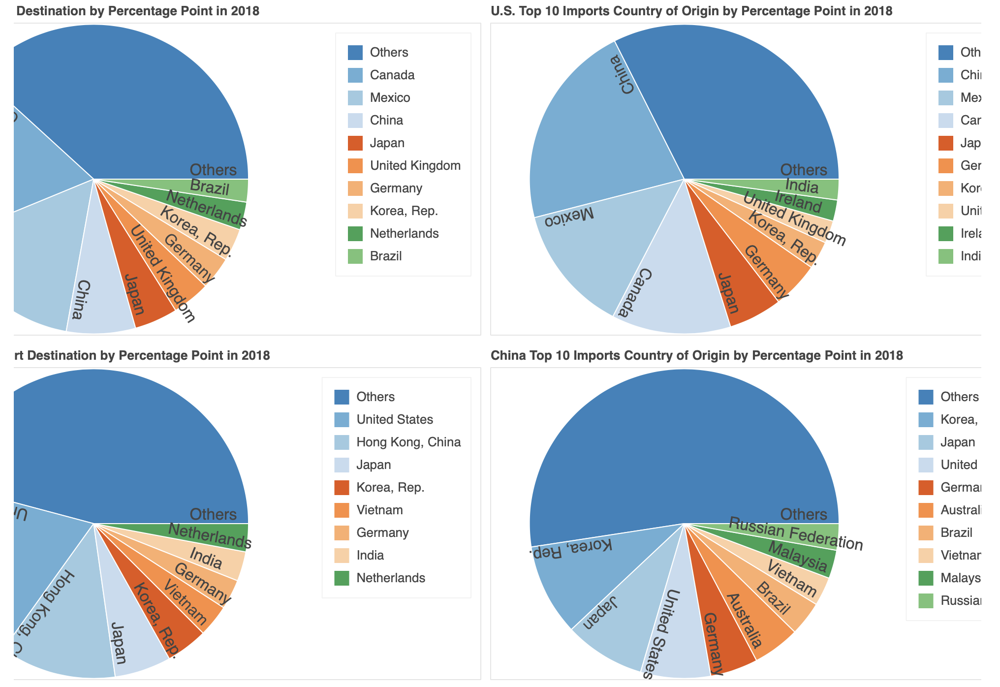

In [459]:
from IPython.display import Image
Image("/Users/zihao/Desktop/UBC/Econ 323/Project/Pie Share.png")

Top 8 deficit, slice China out.

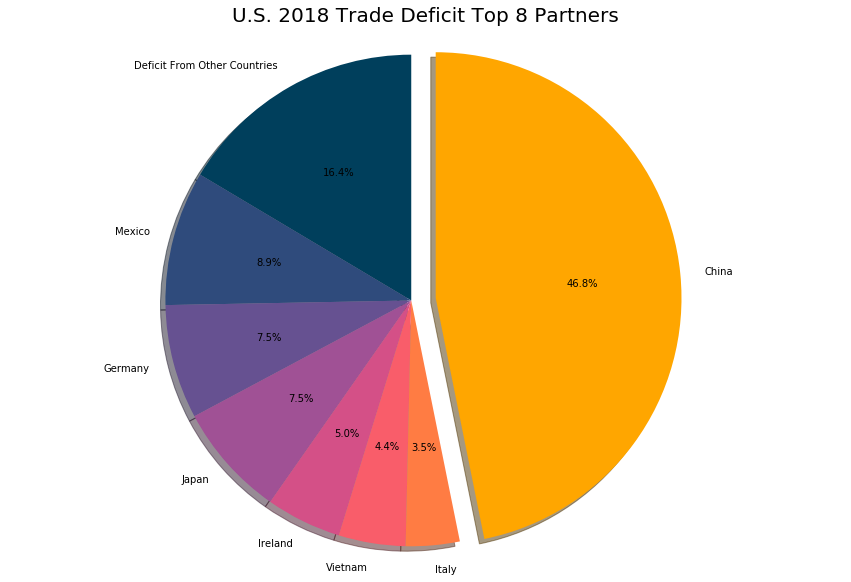

In [381]:
#I chose a better visualization pallette?
labels = df_us_deficit.index.tolist()
df_normalize_percentage= df_us_deficit['Trade Balance (US$ Thousand)']/us_world_blance
sizes = df_normalize_percentage.tolist()
colors = ['#003f5c','#2f4b7c','#665191','#a05195','#d45087','#f95d6a','#ff7c43','#ffa600']

#split china out
explode = (0, 0, 0, 0,0,0,0,0.1)
fig, ax = plt.subplots(figsize = (15,10))
ax.pie(sizes, labels=labels,explode=explode, colors = colors, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
ax.set_title('U.S. 2018 Trade Deficit Top 8 Partners',size = 20)

import matplotlib as mpl
mpl.rcParams['font.size'] = 15




# 2.The Relative Trade Deficit Position, 45 Degree Line Plot

In [382]:
df_2018_ex_im = pd.merge(df_2018_exports, df_2018_imports, on="Reporter Name")
df_2018_ex_im

,Reporter Name,Exports,Imports
0,Afghanistan,1.769009e+06,1.481318e+07
1,Albania,2.875860e+06,5.941287e+06
2,Algeria,NaN,NaN
3,Andorra,1.294482e+05,1.609394e+06
4,Angola,3.768468e+07,1.635306e+07
...,...,...,...
198,Venezuela,NaN,NaN
199,Vietnam,NaN,NaN
200,Yemen,NaN,NaN
201,Zambia,9.052165e+06,9.461739e+06


In [383]:
df_2018_ex_im.set_index("Reporter Name",inplace=True)

In [384]:
df_2018_ex_im.loc["United States"]

Exports    1.665303e+09
Imports    2.611432e+09
Name: United States, dtype: float64

In [385]:
df_2018_clean = df_2018_ex_im.dropna(axis=0)
df_2018_clean 

,Exports,Imports
Reporter Name,,
Afghanistan,1.769009e+06,1.481318e+07
Albania,2.875860e+06,5.941287e+06
Andorra,1.294482e+05,1.609394e+06
Angola,3.768468e+07,1.635306e+07
Antigua and Barbuda,2.584108e+04,5.691552e+05
...,...,...
United States,1.665303e+09,2.611432e+09
Uruguay,7.498005e+06,8.893246e+06
Uzbekistan,1.091901e+07,1.731395e+07


In [386]:
null_sum_clean = df_2018_clean.isnull().sum()
null_sum_clean

Exports    0
Imports    0
dtype: int64

In [387]:
df_2018_clean  = df_2018_clean / 1000000

In [388]:
df_2018_clean.loc["China"]["Exports"]

2494.230194966

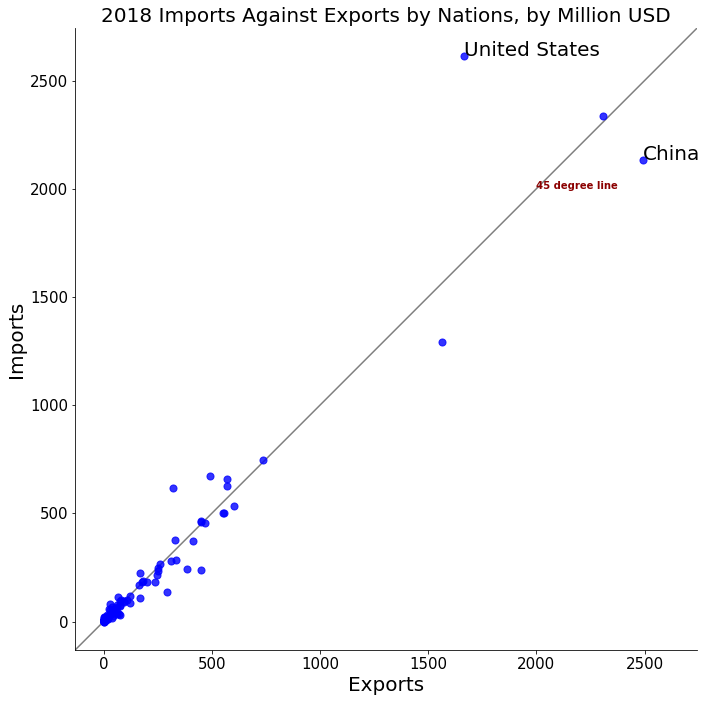

In [389]:
background_1 = tuple(np.array([253, 238, 222]) / 255)
def scatterlabels(xvar, yvar, ax):
    df_2018_clean.plot(xvar,yvar, kind="scatter", color= "blue", alpha=0.8, ax=ax, s=50)
    for idx in df_2018_clean.index :
        if idx == "China" :
            
            ax.annotate("China", (df_2018_clean.loc["China",xvar], df_2018_clean.loc["China",yvar]), color="black",size=20)
        
        elif idx == "United States" :
            
            ax.annotate("United States", (df_2018_clean.loc["United States",xvar], df_2018_clean.loc["United States",yvar]), color="black",size=20)
       
           
        
    return(ax)

fig, ax = plt.subplots(figsize=(20,10))
ax = scatterlabels("Exports","Imports",ax)
ax.set_xlabel('Exports',size=20)
ax.set_ylabel('Imports', size =20)
ax.set_title("2018 Imports Against Exports by Nations, by Million USD",size =20)
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
    np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
]
# now plot both limits against eachother
# a 45 degree line 
ax.plot(lims, lims, 'k-', alpha=0.5, zorder=0)
ax.set_aspect('equal')
ax.set_xlim(lims)
ax.set_ylim(lims)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.annotate(
    "45 degree line",
    xy=(10, 20), xycoords="data", xytext=(2000,2000),
    annotation_clip=False,
    horizontalalignment="left",
    arrowprops={"visible": False},
    fontsize=12, fontweight="semibold", color = tuple(np.array([139,0,0]) / 255),size =10)

fig.tight_layout()



#  3.Trade War in Detail
## 3.1  5-digit End Use Code Goods Trade Value during the Trade War

In [628]:
import requests


url = 'https://www.census.gov/foreign-trade/statistics/product/enduse/imports/c5700.html?'
html = requests.get(url).content
df_list = pd.read_html(html)
df_end_use = df_list[-1]

df_end_use.to_csv('my data.csv')

In [649]:
df_end_use = df_end_use[(df_end_use != 0).all(1)]
df_end_use_1 =  df_end_use.nlargest(70,'Value 2019')
df_end_use_1 

,End-Use Code,Value 2010,Value 2011,Value 2012,Value 2013,Value 2014,Value 2015,Value 2016,Value 2017,Value 2018,Value 2019
141,TOTAL,364952634,399371233,425619083,440430020,468474895,483201655,462419992,505220233,539675591,452243440
121,"(41050) Cell phones and other household goods,...",32612041,40437973,52820617,58708992,64102970,64538065,61465082,70339967,71872376,64552117
84,(21300) Computers,39343305,47212554,47638124,47154020,46246719,43804679,40407803,45400673,47178858,42379802
124,"(41120) Toys, games, and sporting goods",27817414,25306178,25115136,24632369,24432816,26355499,25044156,26726633,28222683,26512710
108,"(40020) Apparel, textiles, nonwool or cotton",17317807,19754755,20619014,21554715,23924860,25645126,24143354,24114281,25140494,24453425
...,...,...,...,...,...,...,...,...,...,...,...
126,(41140) Musical instruments,655151,660364,674404,647305,708923,703271,708904,717117,777382,816483
122,(41100) Motorcycles and parts,133870,181086,229314,254189,260398,478429,466435,568479,842384,724828
74,"(21110) Food, tobacco machinery",430348,509068,551661,585582,671607,725335,755540,806258,796777,681196
92,(22010) Parts-civilian aircraft,303580,413779,445631,509563,535630,534547,522628,600075,676175,651946


In [650]:

df_end_use1 = df_end_use_1.set_index('End-Use Code').T.astype(float).drop(['TOTAL'],axis=1)
df_end_use1

End-Use Code,"(41050) Cell phones and other household goods, n.e.c.",(21300) Computers,"(41120) Toys, games, and sporting goods","(40020) Apparel, textiles, nonwool or cotton",(21400) Telecommunications equipment,(21301) Computer accessories,"(41000) Furniture, household goods, etc.",(41030) Household appliances,(30230) Other parts and accessories of vehicles,(20005) Electric apparatus,...,"(12070) Tobacco, waxes, etc.","(42110) Gem stones, other","(50040) Other (movies, miscellaneous imports, and special transactions)",(12500) Plastic materials,"(13020) Stone, sand, cement, etc.",(41140) Musical instruments,(41100) Motorcycles and parts,"(21110) Food, tobacco machinery",(22010) Parts-civilian aircraft,(00180) Other foods
Value 2010,32612041.0,39343305.0,27817414.0,17317807.0,16619084.0,28195127.0,13561429.0,9390599.0,7361394.0,11044289.0,...,644778.0,1512192.0,161174.0,571061.0,782220.0,655151.0,133870.0,430348.0,303580.0,339091.0
Value 2011,40437973.0,47212554.0,25306178.0,19754755.0,17336848.0,27663608.0,13753109.0,10210570.0,9029238.0,12946856.0,...,760624.0,1577880.0,203950.0,808861.0,799358.0,660364.0,181086.0,509068.0,413779.0,431406.0
Value 2012,52820617.0,47638124.0,25115136.0,20619014.0,19145602.0,28418685.0,14779785.0,11145330.0,11172211.0,11590260.0,...,899706.0,1661028.0,225795.0,812741.0,853707.0,674404.0,229314.0,551661.0,445631.0,495041.0
Value 2013,58708992.0,47154020.0,24632369.0,21554715.0,20951280.0,28979113.0,15179327.0,12482507.0,11681762.0,12696414.0,...,945442.0,1613486.0,199275.0,903012.0,995017.0,647305.0,254189.0,585582.0,509563.0,534875.0
Value 2014,64102970.0,46246719.0,24432816.0,23924860.0,22537644.0,31191054.0,16052809.0,13244246.0,13464650.0,13333796.0,...,964357.0,1486404.0,204473.0,1183041.0,1088456.0,708923.0,260398.0,671607.0,535630.0,475411.0
Value 2015,64538065.0,43804679.0,26355499.0,25645126.0,27085100.0,30456135.0,17894345.0,14217862.0,14867660.0,13627422.0,...,998928.0,1354299.0,249775.0,1041041.0,1301605.0,703271.0,478429.0,725335.0,534547.0,496359.0
Value 2016,61465082.0,40407803.0,25044156.0,24143354.0,29036921.0,28252467.0,18644665.0,13715844.0,14231925.0,13132186.0,...,942742.0,1170479.0,285428.0,972701.0,1469631.0,708904.0,466435.0,755540.0,522628.0,513580.0
Value 2017,70339967.0,45400673.0,26726633.0,24114281.0,33441172.0,31650136.0,20669159.0,14147002.0,14387447.0,14171418.0,...,1014030.0,1034977.0,293207.0,1311665.0,1714360.0,717117.0,568479.0,806258.0,600075.0,598441.0
Value 2018,71872376.0,47178858.0,28222683.0,25140494.0,33882831.0,32501200.0,22694251.0,16047425.0,16382779.0,16088867.0,...,1152272.0,1073617.0,421308.0,1596564.0,1924222.0,777382.0,842384.0,796777.0,676175.0,711488.0
Value 2019,64552117.0,42379802.0,26512710.0,24453425.0,24443054.0,18709286.0,16920257.0,14069356.0,13012552.0,12948998.0,...,967714.0,937668.0,925406.0,877651.0,868285.0,816483.0,724828.0,681196.0,651946.0,642395.0


In [699]:
#let's apply the shift funciton, see which chinese industry got hurt the most. We can clearly see the last row is negative
df_end_use2=((df_end_use1 - df_end_use1.shift()) / df_end_use1.shift())
df_end_use_trans= df_end_use2.T
df_end_use_trans.columns = ['2010', '2011', '2012','2013','2014','2015','2016','2017','2018','2019']
df_china_end_use = df_end_use_trans.T 
#growth rate
df_end_use_trans

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
End-Use Code,,,,,,,,,,
"(41050) Cell phones and other household goods, n.e.c.",NaN,0.239971,0.306213,0.111479,0.091877,0.006787,-0.047615,0.144389,0.021786,-0.101851
(21300) Computers,NaN,0.200015,0.009014,-0.010162,-0.019241,-0.052805,-0.077546,0.123562,0.039166,-0.101720
"(41120) Toys, games, and sporting goods",NaN,-0.090276,-0.007549,-0.019222,-0.008101,0.078693,-0.049756,0.067180,0.055976,-0.060589
"(40020) Apparel, textiles, nonwool or cotton",NaN,0.140719,0.043749,0.045380,0.109959,0.071903,-0.058560,-0.001204,0.042556,-0.027329
(21400) Telecommunications equipment,NaN,0.043189,0.104330,0.094313,0.075717,0.201772,0.072063,0.151678,0.013207,-0.278601
...,...,...,...,...,...,...,...,...,...,...
(41140) Musical instruments,NaN,0.007957,0.021261,-0.040182,0.095192,-0.007973,0.008010,0.011585,0.084038,0.050298
(41100) Motorcycles and parts,NaN,0.352700,0.266326,0.108476,0.024427,0.837299,-0.025070,0.218774,0.481821,-0.139552
"(21110) Food, tobacco machinery",NaN,0.182922,0.083669,0.061489,0.146905,0.079999,0.041643,0.067128,-0.011759,-0.145061


In [719]:
#There's one outlier that ruins the whole graph 
df_end_use_trans['2016'].idxmax()

'(30000) Passenger cars, new and used'

In [683]:
#Let's see what happens to the Chinese Product exports 
most_china_list = df_end_use_trans.nsmallest(10,'2019').index.tolist()
most_china_list

['(13020) Stone, sand, cement, etc.',
 '(30220) Automotive tires and tubes',
 '(21320) Semiconductors',
 '(12500) Plastic materials',
 '(21301) Computer accessories',
 '(12135) Synthetic cloth',
 '(01000) Fish and shellfish',
 '(21160) Measuring, testing, control instruments',
 '(12550) Chemicals-other, n.e.c.',
 '(15000) Iron and steel products, n.e.c.']

In [720]:


not_bad = list(df_end_use1.columns)

for i in not_bad:
    if i in most_china_list:
        not_bad.remove(i)
not_bad.remove(df_end_use_trans['2016'].idxmax())



['(41050) Cell phones and other household goods, n.e.c.',
 '(21300) Computers',
 '(41120) Toys, games, and sporting goods',
 '(40020) Apparel, textiles, nonwool or cotton',
 '(21400) Telecommunications equipment',
 '(41000) Furniture, household goods, etc.',
 '(41030) Household appliances',
 '(30230) Other parts and accessories of vehicles',
 '(20005) Electric apparatus',
 '(40040) Footwear',
 '(40000) Apparel, household goods - cotton',
 '(21180) Industrial machines, other',
 '(21190) Photo, service industry machinery',
 '(41200) Televisions and video equipment',
 '(41020) Cookware, cutlery, tools',
 '(16120) Industrial supplies, other',
 '(20000) Generators, accessories',
 '(40140) Other consumer nondurables',
 '(12540) Chemicals-organic',
 '(21610) Medicinal equipment',
 '(40050) Camping apparel and gear',
 '(21100) Industrial engines',
 '(15200) Finished metal shapes',
 '(40030) Apparel,household goods-nontextile',
 '(41210) Stereo equipment, etc',
 '(50030) Minimum value shipments

In [741]:
# now read and clean the U.S. exports file 

url = 'https://www.census.gov/foreign-trade/statistics/product/enduse/exports/c5700.html'
html = requests.get(url).content
df_list_us = pd.read_html(html)
df_end_use_us= df_list_us[-1]

df_end_use_us.to_csv('my data us.csv')
df_end_use_us = df_end_use_us[(df_end_use_us != 0).all(1)]
df_end_use_1_us =  df_end_use_us.nlargest(70,'Value 2019')
df_end_use_1_us

,End-Use Code,Value 2010,Value 2011,Value 2012,Value 2013,Value 2014,Value 2015,Value 2016,Value 2017,Value 2018,Value 2019
133,TOTAL,91911081,104121524,110516616,121746189,123657203,115873365,115594784,129797587,120148141,106626775
88,"(22090) Civilian aircraft, engines, equipment,...",5754879,6388494,8357556,12586701,13927126,15439704,14577081,16264439,18220787,10458939
83,(21320) Semiconductors,6410995,4607132,3892964,4737314,5510760,5976385,5955948,6076755,7117197,9113628
2,(00100) Soybeans,10864318,10508369,14879547,13304176,14485397,10494079,14212335,12230585,3129041,7991950
94,"(30000) Passenger cars, new and used",3441170,5305700,5698113,8522223,11178484,9055568,8842569,10208474,6638100,7231631
...,...,...,...,...,...,...,...,...,...,...,...
111,(41030) Household appliances,172171,163815,161100,173186,156649,160376,162870,182692,205756,194372
55,(12750) Industrial rubber products,163349,181810,172857,204646,213004,195600,186298,210638,212998,191699
5,"(00210) Sorghum, barley, oats",3877,241,284,96643,1467583,2116876,1030781,838817,521577,191684
33,(12100) Iron and steel mill products,175218,206232,204275,186074,216657,201045,161389,217445,220335,184759


In [775]:
df_end_use1_us = df_end_use_1_us.set_index('End-Use Code').T.astype(float).drop(['TOTAL'],axis=1)
#let's apply the shift funciton, see which chinese industry got hurt the most. We can clearly see the last row is negative
df_end_use2_us=((df_end_use1_us - df_end_use1_us.shift()) / df_end_use1_us.shift())
df_end_use_trans_us= df_end_use2_us.T
df_end_use_trans_us.columns = ['2010', '2011', '2012','2013','2014','2015','2016','2017','2018','2019']
df_china_end_use_us = df_end_use_trans_us.T 
#growth rate
df_end_use_trans_us['2013'].idxmax()

'(00210) Sorghum, barley, oats'

We seclect the top 10 HS2 commodities that were most affected by the tariff escalation 

In [745]:
#China exports to U.S.
df_end_use_trans.nsmallest(10,'2019')

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
End-Use Code,,,,,,,,,,
"(13020) Stone, sand, cement, etc.",NaN,0.021909,0.067991,0.165525,0.093907,0.195827,0.129091,0.166524,0.122414,-0.548760
(30220) Automotive tires and tubes,NaN,0.185733,0.284274,0.272377,0.168855,-0.288444,-0.257422,-0.059118,0.237382,-0.500792
(21320) Semiconductors,NaN,0.555661,-0.013246,-0.023967,0.206043,0.144985,0.055277,0.127307,-0.078197,-0.454291
(12500) Plastic materials,NaN,0.416418,0.004797,0.111070,0.310106,-0.120030,-0.065646,0.348477,0.217204,-0.450288
(21301) Computer accessories,NaN,-0.018851,0.027295,0.019720,0.076329,-0.023562,-0.072355,0.120261,0.026890,-0.424351
(12135) Synthetic cloth,NaN,0.281204,0.093669,0.069574,0.056051,0.062712,-0.058729,0.027167,0.082951,-0.364455
(01000) Fish and shellfish,NaN,0.110230,0.002442,0.011203,0.070062,-0.097249,-0.033415,0.076939,0.078985,-0.342140
"(21160) Measuring, testing, control instruments",NaN,0.139496,0.139968,0.087184,0.061042,0.067711,0.031598,0.096015,0.016002,-0.295595
"(12550) Chemicals-other, n.e.c.",NaN,0.551198,0.059874,-0.030072,0.038569,-0.051580,-0.052498,0.048094,0.366366,-0.294860


In [744]:
#U.S. exports to China 
df_end_use_trans_us.nsmallest(10,'2019')

,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
End-Use Code,,,,,,,,,,
(12210) Copper,NaN,0.284117,0.017078,-0.117972,-0.136723,-0.419547,-0.033447,0.199860,-0.213935,-0.748894
"(00210) Sorghum, barley, oats",NaN,-0.937839,0.178423,339.292254,14.185611,0.442423,-0.513065,-0.186232,-0.378199,-0.632491
(13100) Logs and lumber,NaN,0.662561,-0.151574,0.412149,0.160002,-0.229387,0.247170,0.269094,-0.107772,-0.450961
"(11120) Petroleum products, other",NaN,0.574671,0.074208,0.376012,-0.270624,-0.105296,-0.036773,0.243342,-0.179879,-0.435605
"(22090) Civilian aircraft, engines, equipment, and parts",NaN,0.110100,0.308220,0.506027,0.106495,0.108607,-0.055870,0.115754,0.120284,-0.425989
(12700) Synthetic rubber-primary,NaN,0.085737,0.080699,-0.140991,-0.100860,-0.293144,-0.103461,0.087465,-0.001362,-0.402623
(00310) Dairy products and eggs,NaN,0.524074,0.027630,1.013803,-0.032044,-0.427603,-0.112393,0.503283,-0.223736,-0.387536
(12200) Aluminum and alumina,NaN,0.336770,-0.101715,-0.049950,-0.204781,-0.232125,-0.263336,0.206854,-0.355763,-0.373764
(30230) Other parts and accessories of vehicles,NaN,0.153988,0.042625,0.761972,0.270673,-0.110203,0.248302,0.166169,0.052884,-0.322354


In [762]:
most_us_list = df_end_use_trans_us.nsmallest(10,'2019').index.tolist()
most_us_list

['(12210) Copper',
 '(00210) Sorghum, barley, oats',
 '(13100) Logs and lumber',
 '(11120) Petroleum products, other',
 '(22090) Civilian aircraft, engines, equipment, and parts',
 '(12700) Synthetic rubber-primary',
 '(00310) Dairy products and eggs',
 '(12200) Aluminum and alumina',
 '(30230) Other parts and accessories of vehicles',
 '(10120) Hides and skins']

In [777]:
not_bad_us = list(df_end_use1_us.columns)

for i in not_bad_us:
    if i in most_us_list:
        not_bad_us.remove(i)
most_us_list.remove(df_end_use_trans_us['2013'].idxmax())

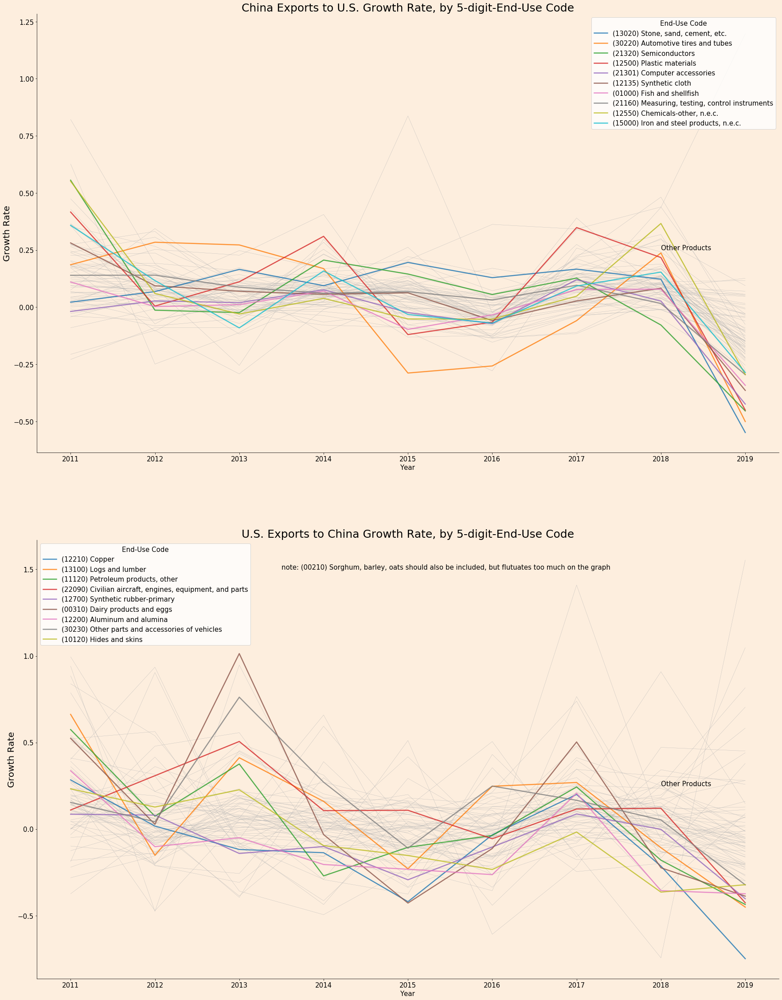

In [790]:

fig, ax = plt.subplots(2,figsize=(30,40))

df_china_end_use[not_bad].plot(ax=ax[0], color=[(0.7, 0.7, 0.7)], lw=0.4, legend=False)


df_china_end_use[most_china_list].plot(ax=ax[0] ,lw=2.5, legend=True,alpha = 0.8)

df_china_end_use_us[not_bad_us].plot(ax=ax[1], color=[(0.7, 0.7, 0.7)], lw=0.4, legend=False)

df_china_end_use_us[most_us_list].plot(ax=ax[1] ,lw=2.5, legend=True,alpha = 0.8)


ax[0].set_title("China Exports to U.S. Growth Rate, by 5-digit-End-Use Code",size = 25)

ax[0].text(8, 0.25, "Other Products")
ax[1].set_title("U.S. Exports to China Growth Rate, by 5-digit-End-Use Code",size = 25)

ax[1].text(8, 0.25, "Other Products")
ax[1].text(3.5, 1.5, "note: (00210) Sorghum, barley, oats should also be included, but flutuates too much on the graph")

for j in range(len(ax)):
    ax[j].set_facecolor(background_1)
    ax[j].spines["right"].set_visible(False)
    ax[j].spines["top"].set_visible(False)
    ax[j].set_ylabel("Growth Rate",size = 20)
    ax[j].set_xlabel('Year')
fig.set_facecolor(background_1) 





## 3.2 Timeline and Lag

In [390]:
df_tariff.round(1)

,Reporter Name,Partner Name,Trade Flow,Product Group,Indicator,1992,1993,1994,1995,1996,...,2018-09-24 00:00:00,2018-11-01 00:00:00,2019-01-01 00:00:00,2019-02-07 00:00:00,2019-05-10 00:00:00,2019-07-01 00:00:00,2019-09-01 00:00:00,2019-09-17 00:00:00,2019-12-26 00:00:00,2020-02-07 00:00:00
0,China,United States,Import,All Products,AHS Weighted Average (%),22.6,25.2,20.2,NaN,19.4,...,18.3,18.2,16.5,16.5,20.7,20.7,21.8,21.1,20.9,20.9
1,United States,China,Import,All Products,AHS Weighted Average (%),9.1,9.0,NaN,6.6,6.1,...,12.0,12.0,12.0,12.0,17.6,17.6,21.0,21.0,21.0,21.0


In [391]:
df_tariff_short = df_tariff.head(2).drop(['Partner Name', 'Trade Flow','Product Group','Indicator'], axis=1)
df_tariff_short.set_index("Reporter Name",inplace=True)
df_tariff_short

,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,...,2018-09-24 00:00:00,2018-11-01 00:00:00,2019-01-01 00:00:00,2019-02-07 00:00:00,2019-05-10 00:00:00,2019-07-01 00:00:00,2019-09-01 00:00:00,2019-09-17 00:00:00,2019-12-26 00:00:00,2020-02-07 00:00:00
Reporter Name,,,,,,,,,,,,,,,,,,,,,
China,22.596588,25.216208,20.165407,NaN,19.432578,16.807201,16.158146,15.039880,17.136340,16.150239,...,18.3,18.2,16.5,16.5,20.7,20.7,21.80000,21.10000,20.912747,20.912747
United States,9.140252,8.979555,NaN,6.596073,6.109358,5.684370,4.911233,4.427894,4.112225,4.161655,...,12.0,12.0,12.0,12.0,17.6,17.6,21.03562,21.03562,21.035620,21.026250


In [18]:
df_new_tariff = df_tariff_short.T.reset_index()


In [57]:
df_new_tariff.to_csv(r'/Users/zihao/Desktop/UBC/Econ 323/Project/df_new_tariff.csv', index = False)

In [392]:
df_tariff_time= pd.read_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/Time_series_tariff.xlsx')
df_tariff_time.tail()

,Year,China,United States
39,2019-07-01,20.700000,17.60000
40,2019-09-01,21.800000,21.03562
41,2019-09-17,21.100000,21.03562
42,2019-12-26,20.912747,21.03562
43,2020-02-07,20.912747,21.02625


In [393]:
pd.to_datetime(df_tariff_time.Year, format='%Y%M%D')

0    1992-01-01
1    1993-01-01
2    1994-01-01
3    1995-01-01
4    1996-01-01
5    1997-01-01
6    1998-01-01
7    1999-01-01
8    2000-01-01
9    2001-01-01
10   2002-01-01
11   2003-01-01
12   2004-01-01
13   2005-01-01
14   2006-01-01
15   2007-01-01
16   2008-01-01
17   2009-01-01
18   2010-01-01
19   2011-01-01
20   2012-01-01
21   2013-01-01
22   2014-01-01
23   2015-01-01
24   2016-01-01
25   2017-01-01
26   2018-01-01
27   2018-02-07
28   2018-03-23
29   2018-04-02
30   2018-05-01
31   2018-07-01
32   2018-07-06
33   2018-08-23
34   2018-09-24
35   2018-11-01
36   2019-01-01
37   2019-02-07
38   2019-05-10
39   2019-07-01
40   2019-09-01
41   2019-09-17
42   2019-12-26
43   2020-02-07
Name: Year, dtype: datetime64[ns]

In [394]:
df_tariff_time.head()

,Year,China,United States
0,1992-01-01,22.596588,9.140252
1,1993-01-01,25.216208,8.979555
2,1994-01-01,20.165407,NaN
3,1995-01-01,NaN,6.596073
4,1996-01-01,19.432578,6.109358


In [395]:
df_tariff_time.set_index('Year',inplace=True)


In [396]:
df_tariff_time.head()

,China,United States
Year,,
1992-01-01,22.596588,9.140252
1993-01-01,25.216208,8.979555
1994-01-01,20.165407,NaN
1995-01-01,NaN,6.596073
1996-01-01,19.432578,6.109358


In [397]:
df_tariff_time.rename(columns={"China": "China tariff on the U.S.'s exports", "United States": "U.S. tariff on China's exports"},inplace = True)
neworder = ["U.S. tariff on China's exports","China tariff on the U.S.'s exports"]
df_US_China = df_tariff_time.reindex(columns=neworder)



In [398]:

df_US_China = df_US_China.round(1)
df_US_China.head()

,U.S. tariff on China's exports,China tariff on the U.S.'s exports
Year,,
1992-01-01,9.1,22.6
1993-01-01,9.0,25.2
1994-01-01,NaN,20.2
1995-01-01,6.6,NaN
1996-01-01,6.1,19.4


In [399]:
null_sum_tariff = df_US_China.isnull().sum()
null_sum_tariff

U.S. tariff on China's exports        1
China tariff on the U.S.'s exports    3
dtype: int64

In [400]:
df_trade_war = df_US_China.loc[df_US_China.index > '2017-01-01 00:00:00']
df_trade_war.head()

,U.S. tariff on China's exports,China tariff on the U.S.'s exports
Year,,
2018-01-01,2.8,5.9
2018-02-07,3.2,5.9
2018-03-23,3.8,5.9
2018-04-02,3.8,8.4
2018-05-01,3.8,8.3


In [1065]:



url = 'https://www.census.gov/foreign-trade/balance/c5700.html'
html = requests.get(url).content
df_list_us = pd.read_html(html)
 
df_us_trade_in_2020=df_list_us[0]
df_us_trade_in_2019 = df_list_us[1]
df_us_trade_in_2018 = df_list_us[2]
df_trade_flow = pd.concat([df_us_trade_in_2018, df_us_trade_in_2019,df_us_trade_in_2020])
df_trade_flow

,Month,Exports,Imports,Balance
0,January 2018,9902.6,45765.6,-35863.1
1,February 2018,9759.9,39020.6,-29260.7
2,March 2018,12652.1,38327.6,-25675.5
3,April 2018,10503.8,38303.9,-27800.1
4,May 2018,10428.2,43965.7,-33537.5
5,June 2018,10860.1,44612.1,-33752.0
6,July 2018,10134.6,47120.6,-36986.0
7,August 2018,9285.9,47869.2,-38583.3
8,September 2018,9730.0,50015.0,-40285.0
9,October 2018,9139.9,52202.3,-43062.5


In [1066]:
df_trade_flow = df_trade_flow.set_index('Month').drop(['TOTAL 2018','TOTAL 2019','TOTAL 2020'])


In [1067]:
balance  = df_trade_flow['Balance'].tolist() ## later annotate 
df_trade_flow.drop('Balance',axis=1,inplace = True)
improve = (balance[9] - balance[25])/balance[9]
improve


0.6284911465892599

In [996]:
from datetime import datetime, timedelta




month = ['01-01-2018','02-01-2018','03-01-2018','04-01-2018','05-01-2018','06-01-2018','07-01-2018',
         '08-01-2018','09-01-2018','10-01-2018','11-01-2018','12-01-2018','01-01-2019','02-01-2019','03-01-2019','04-01-2019','05-01-2019','06-01-2019',
         '07-01-2019','08-01-2019','09-01-2019','10-01-2019','11-01-2019','12-01-2019','01-01-2020','02-01-2020']

#add it into the dataframe 
df_trade_flow['month'] = month
df_trade_flow_clean = df_trade_flow.reset_index().drop('Month',axis=1)

df_trade_flow_clean.to_excel(r'/Users/zihao/Desktop/UBC/Econ 323/Project/df_trade_flow_clean.xlsx', index = False)

In [1014]:
df_trade_flow_date = pd.read_excel (r'/Users/zihao/Desktop/UBC/Econ 323/Project/df_trade_flow_date.xlsx')


pd.to_datetime(df_trade_flow_date.Year, format='%Y%M%D')
df_trade_flow_date.head()

,Exports,Imports,Year
0,9902.6,45765.6,2018-01-01
1,9759.9,39020.6,2018-02-01
2,12652.1,38327.6,2018-03-01
3,10503.8,38303.9,2018-04-01
4,10428.2,43965.7,2018-05-01


In [1015]:
df_trade_flow_date1 = df_trade_flow_date.set_index('Year')


## 3.3 Visuliaztion on Tariff Trend, Bilateral Tariff War and Adjustment Lag
The timeline is based on https://www.china-briefing.com/news/the-us-china-trade-war-a-timeline/

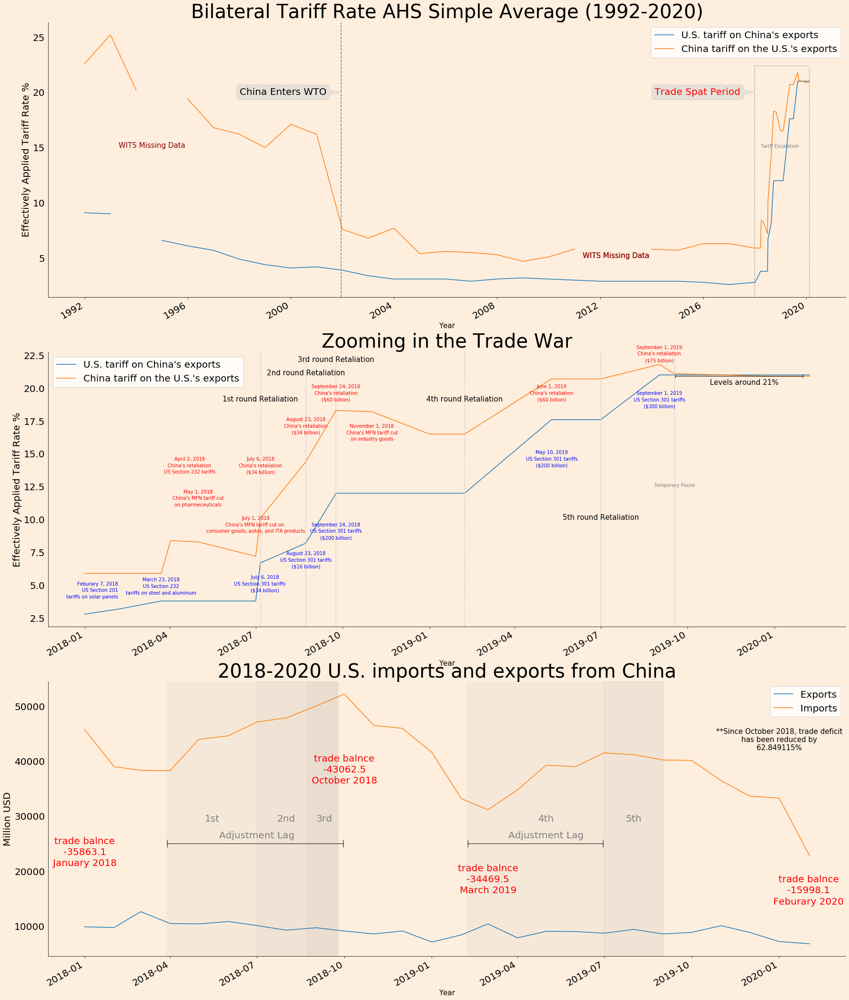

In [1071]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import matplotlib.patches as patches
from matplotlib.path import Path



style = dict(size=15, color=tuple(np.array([139,0,0]) / 255))
style2 = dict(size=20, color='gray')
style3 = dict(size=10, color='blue')
style4 = dict(size=10, color='red')
style5 = dict(size=15, color='black')
style6 = dict(size=10, color='gray')
style7 = dict(size=20, color='red')

fig, ax = plt.subplots(3,figsize=(30,40))
df_US_China.plot(ax=ax[0])
ax[0].set_title("Bilateral Tariff Rate AHS Simple Average (1992-2020)",size =40)
ax[0].set_ylabel('Effectively Applied Tariff Rate %', size =20)

ax[0].text('1996-01-01', 15, "WITS Missing Data ", ha='right', **style)
ax[0].text('2014-01-01', 5, "WITS Missing Data ", ha='right', **style)
ax[0].axvline(x="2001-12-11",linestyle = '--',color='gray')
ax[0].text('2014-01-01', 5, "WITS Missing Data ", ha='right', **style)
ax[0].annotate('China Enters WTO', xy=('2001-12-11', 20),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=20, ha='right', va="center",
             bbox=dict(boxstyle="round", alpha=0.1),
             arrowprops=dict(arrowstyle="wedge,tail_width=0.5", alpha=0.1));

ax[0].text('2018-03-23', 15, "Tariff Escalation ", ha='left', **style6)
ax[0].axvline(x="2018-01-01", ymin=0 ,ymax=0.84,color="gray",linestyle = ':')
ax[0].axvline(x="2020-02-17", ymin=0 ,ymax=0.84,color="gray",linestyle = ':')
ax[0].hlines(y=22.4, xmin="2018-01-01",xmax="2020-02-17",color="gray",linestyle = ':')
ax[0].annotate("Trade Spat Period", xy=('2018-01-01', 20),  xycoords='data',
             xytext=(-30, 0), textcoords='offset points',
             size=20, ha='right', va="center", color = 'red',
             bbox=dict(boxstyle="round", alpha=0.1),
             arrowprops=dict(arrowstyle="wedge,tail_width=0.5", alpha=0.1))




df_trade_war.plot(ax=ax[1])
ax[1].set_title("Zooming in the Trade War",size =40)
ax[1].set_ylabel('Effectively Applied Tariff Rate %', size =20)

ax[1].text('2018-02-07', 5.0, "Feburary 7, 2018 ", ha='right', **style3)
ax[1].text('2018-02-07', 4.5, "US Section 201 ", ha='right', **style3)
ax[1].text('2018-02-07', 4.0, "tariffs on solar panels ", ha='right', **style3)

ax[1].text('2018-03-23', 5.3, "March 23, 2018", ha='center', **style3)
ax[1].text('2018-03-23', 4.8, "US Section 232", ha='center', **style3)
ax[1].text('2018-03-23', 4.3, "tariffs on steel and aluminum", ha='center', **style3)

ax[1].text('2018-04-22', 14.5, "April 2, 2018", ha='center', **style4)
ax[1].text('2018-04-22', 14, "China's retaliation", ha='center', **style4)
ax[1].text('2018-04-22', 13.5, "US Section 232 tariffs", ha='center', **style4)

ax[1].text('2018-05-01', 12, "May 1, 2018", ha='center', **style4)
ax[1].text('2018-05-01', 11.5, "China's MFN tariff cut", ha='center', **style4)
ax[1].text('2018-05-01', 11, "on pharmeceuticals", ha='center', **style4)

ax[1].text('2018-07-01', 10, "July 1, 2018", ha='center', **style4)
ax[1].text('2018-07-01', 9.5, "China's MFN tariff cut on ", ha='center', **style4)
ax[1].text('2018-07-01', 9, "consumer goods, autos, and ITA products", ha='center', **style4)

ax[1].text('2018-07-06', 5.5, "      July 6, 2018", ha='center', **style3)
ax[1].text('2018-07-06', 5, "US Section 301 tariffs ", ha='center', **style3)
ax[1].text('2018-07-06', 4.5, "      ($34 billion)", ha='center', **style3)

ax[1].text('2018-07-06', 14.5, "July 6, 2018", ha='center', **style4)
ax[1].text('2018-07-06', 14, "China's retaliation", ha='center', **style4)
ax[1].text('2018-07-06', 13.5, "($34 billion)", ha='center', **style4)

ax[1].axvline(x="2018-07-06",linestyle = '--',color='lightgray')
ax[1].text('2018-07-06', 19, '1st round Retaliation', ha='center', **style5)

ax[1].axvline(x="2018-08-23",linestyle = '--',color='lightgray')
ax[1].text('2018-08-23', 21, '2nd round Retaliation', ha='center', **style5)

ax[1].text('2018-08-23', 7.3, 'August 23, 2018', ha='center', **style3)
ax[1].text('2018-08-23', 6.8, "US Section 301 tariffs", ha='center', **style3)
ax[1].text('2018-08-23', 6.3, "($16 billion)", ha='center', **style3)

ax[1].text('2018-08-23', 17.5, "August 23, 2018", ha='center', **style4)
ax[1].text('2018-08-23', 17, "China's retaliation", ha='center', **style4)
ax[1].text('2018-08-23', 16.5, "($34 billion)", ha='center', **style4)

ax[1].text('2018-09-24', 9.5, "September 24, 2018", ha='center', **style3)
ax[1].text('2018-09-24', 9, "US Section 301 tariffs", ha='center', **style3)
ax[1].text('2018-09-24', 8.5, "($200 billion)", ha='center', **style3)

ax[1].text('2018-09-24', 20, "September 24, 2018", ha='center', **style4)
ax[1].text('2018-09-24', 19.5, "China's retaliation", ha='center', **style4)
ax[1].text('2018-09-24', 19, "($60 billion)", ha='center', **style4)

ax[1].axvline(x="2018-09-24",linestyle = '--',color='lightgray')
ax[1].text('2018-09-24', 22, '3rd round Retaliation', ha='center', **style5)

ax[1].text('2018-11-01', 17, "November 1, 2018", ha='center', **style4)
ax[1].text('2018-11-01', 16.5, "China's MFN tariff cut", ha='center', **style4)
ax[1].text('2018-11-01', 16, "on industry goods", ha='center', **style4)

ax[1].text('2019-05-10', 15, "May 10, 2019", ha='center', **style3)
ax[1].text('2019-05-10', 14.5, "US Section 301 tariffs", ha='center', **style3)
ax[1].text('2019-05-10', 14, "($200 billion)", ha='center', **style3)

ax[1].text('2019-05-10', 20, "June 1, 2019", ha='center', **style4)
ax[1].text('2019-05-10', 19.5, "China's retaliation", ha='center', **style4)
ax[1].text('2019-05-10', 19, "($60 billion)", ha='center', **style4)

ax[1].axvline(x="2019-02-07",linestyle = '--',color='lightgray')
ax[1].text('2019-02-07', 19, '4th round Retaliation', ha='center', **style5)

ax[1].text('2019-09-01', 19.5, "September 1, 2019", ha='center', **style3)
ax[1].text('2019-09-01', 19, "US Section 301 tariffs", ha='center', **style3)
ax[1].text('2019-09-01', 18.5, "($300 billion)", ha='center', **style3)

ax[1].text('2019-09-01', 23, "September 1, 2019", ha='center', **style4)
ax[1].text('2019-09-01', 22.5, "China's retaliation", ha='center', **style4)
ax[1].text('2019-09-01', 22, "($75 billion)", ha='center', **style4)

ax[1].axvline(x="2019-07-01",linestyle = '--',color='lightgray')
ax[1].text('2019-07-01', 10, '5th round Retaliation', ha='center', **style5)

ax[1].annotate('Levels around 21%', xy=('2019-11-30', 21), xycoords='data', ha='center',
            xytext=(0, -20), textcoords='offset points')
ax[1].annotate('', xy=('2019-09-17', 20.9), xytext=('2020-02-01', 20.9),
            xycoords='data', textcoords='data',
            arrowprops={'arrowstyle': '|-|,widthA=0.2,widthB=0.2', })

ax[1].axvline(x="2019-09-17",linestyle = '--',color='lightgray')
ax[1].text('2019-09-17', 12.5, 'Temporary Pause', ha='center', **style6)

df_trade_flow_date1.plot(ax=ax[2])
ax[2].set_title("2018-2020 U.S. imports and exports from China",size =40)
ax[2].set_ylabel('Million USD', size =20)
ax[2].axvspan('2018-03-28', '2018-07-01', color="grey", alpha=0.05)
ax[2].axvspan('2018-07-01', '2018-08-23', color="grey", alpha=0.1)
ax[2].axvspan('2018-08-23', '2018-09-24', color="grey", alpha=0.15)

ax[2].axvspan('2019-02-07', '2019-07-01', color="grey", alpha=0.05)
ax[2].axvspan('2019-07-01', '2019-09-01', color="grey", alpha=0.1)

ax[2].text('2018-01-01', 25000, 'trade balnce', ha='center', **style7)
ax[2].text('2018-01-01', 23000, balance[0], ha='center', **style7)
ax[2].text('2018-01-01', 21000, 'January 2018', ha='center', **style7)

ax[2].text('2018-10-01', 40000, 'trade balnce', ha='center', **style7)
ax[2].text('2018-10-01', 38000, balance[9], ha='center', **style7)
ax[2].text('2018-10-01', 36000, 'October 2018', ha='center', **style7)

ax[2].text('2019-03-01', 20000, 'trade balnce', ha='center', **style7)
ax[2].text('2019-03-01', 18000, balance[12], ha='center', **style7)
ax[2].text('2019-03-01', 16000, 'March 2019', ha='center', **style7)

ax[2].text('2020-02-01', 18000, 'trade balnce', ha='center', **style7)
ax[2].text('2020-02-01', 16000, balance[25], ha='center', **style7)
ax[2].text('2020-02-01', 14000, 'Feburary 2020', ha='center', **style7)



ax[2].text('2018-05-15', 29000, '1st', ha='center', **style2)
ax[2].text('2018-08-01', 29000, '2nd', ha='center', **style2)
ax[2].text('2018-09-10', 29000, '3rd', ha='center', **style2)
ax[2].text('2019-05-01', 29000, '4th', ha='center', **style2)
ax[2].text('2019-08-01', 29000, '5th', ha='center', **style2)

ax[2].text('2020-01-01', 45000, '**Since October 2018, trade deficit', ha='center', **style5)
ax[2].text('2020-01-01', 43500, 'has been reduced by', ha='center', **style5)
ax[2].text('2020-01-01', 42000, "{:%}".format(improve), ha='center', **style5)





ax[2].text('2018-07-01', 26000, 'Adjustment Lag', ha='center', **style2)
ax[2].annotate('', xy=('2018-03-28', 25000), xytext=('2018-10-01', 25000),
            xycoords='data', textcoords='data',
            arrowprops={'arrowstyle': '|-|,widthA=0.5,widthB=0.5', })

ax[2].text('2019-05-01', 26000, 'Adjustment Lag', ha='center', **style2)
ax[2].annotate('', xy=('2019-02-07', 25000), xytext=('2019-07-01', 25000),
            xycoords='data', textcoords='data',
            arrowprops={'arrowstyle': '|-|,widthA=0.5,widthB=0.5', })





    




for j in range(len(ax)):
    ax[j].spines["right"].set_visible(False)
    ax[j].spines["top"].set_visible(False)
    ax[j].legend(fontsize=20)
    ax[j].tick_params(axis='both', which='both', labelsize=20)
    ax[j].tick_params(which="both", left=False)
    ax[j].set_facecolor(background_1)
    
fig.set_facecolor(background_1) 


























#  4. Exports to China from the U.S. by States 
## 4.1 Exports Value by State in 2018
This pair of state datasets come from USCBC, the U.S.-China Business Council State Export Report 2020.
https://www.uschina.org/reports/2020-state-export-report

And the bokeh map plot is the modification based on https://towardsdatascience.com/walkthrough-mapping-basics-with-bokeh-and-geopandas-in-python-43f40aa5b7e9

In [422]:
import geopandas as gpd

In [464]:
contiguous_usa = gpd.read_file('/Users/zihao/Desktop/UBC/Econ 323/Project/cb_2018_us_state_20m.shp')
contiguous_usa.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,24,01714934,0400000US24,24,MD,Maryland,00,25151100280,6979966958,"MULTIPOLYGON (((-76.04621 38.02553, -76.00734 ..."
1,19,01779785,0400000US19,19,IA,Iowa,00,144661267977,1084180812,"POLYGON ((-96.62187 42.77925, -96.57794 42.827..."
2,10,01779781,0400000US10,10,DE,Delaware,00,5045925646,1399985648,"POLYGON ((-75.77379 39.72220, -75.75323 39.757..."
3,39,01085497,0400000US39,39,OH,Ohio,00,105828882568,10268850702,"MULTIPOLYGON (((-82.86334 41.69369, -82.82572 ..."
4,42,01779798,0400000US42,42,PA,Pennsylvania,00,115884442321,3394589990,"POLYGON ((-80.51989 40.90666, -80.51964 40.987..."


In [463]:
state_pop = pd.read_csv('/Users/zihao/Desktop/UBC/Econ 323/Project/state_pop_2018 copy.csv')
state_pop.head()

,SUMLEV,REGION,DIVISION,STATE,NAME,Goods2018,Service2018,Total2018,GoodsExports2019,Relative_Change
0,10,0,0,0,United States,118.196,56.212,174.408,104.4325,-0.12
1,40,3,6,1,Alabama,3.000,0.400,3.400,2.3000,-0.23
2,40,4,9,2,Alaska,1.000,0.300,1.300,0.9000,-0.10
3,40,4,8,4,Arizona,1.200,1.000,2.200,1.1000,-0.08
4,40,3,7,5,Arkansas,0.400,0.200,0.600,0.5000,0.25


In [465]:
# Merge datasets
pop_states = contiguous_usa.merge(state_pop, left_on = 'NAME', right_on = 'NAME')


In [466]:
# Drop Alaska and Hawaii
pop_states = pop_states.loc[~pop_states['NAME'].isin(['Alaska', 'Hawaii'])]

In [467]:
import json
from bokeh.io import show
from bokeh.models import (CDSView, ColorBar, ColumnDataSource, CustomJS,
                          CustomJSFilter, GeoJSONDataSource, HoverTool,
                          LinearColorMapper, Slider)
from bokeh.layouts import column, row, widgetbox
from bokeh.palettes import brewer
from bokeh.plotting import figure
from bokeh.io import output_notebook

# Input GeoJSON source that contains features for plotting
geosource = GeoJSONDataSource(geojson = pop_states.to_json())

In [473]:
# Define color palettes
palette = brewer['RdPu'][8]
palette = palette[::-1] # reverse order of colors so higher values have darker colors

# Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
color_mapper = LinearColorMapper(palette = palette, low = 0, high = 28)

# Define custom tick labels for color bar.
tick_labels = {'0': '0', '0.5': '0.5',
               '1':'1', '2':'2',
               '4':'4', '6':'6',
               '8':'8', '10':'10',
               '12':'12+'}

# Create color bar.
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal',
                     major_label_overrides = tick_labels)

# Create figure object.
p = figure(title = 'U.S. Good and Service Export to China by States , 2018, USD Billion', plot_height = 600 ,
           plot_width = 950, toolbar_location = 'below',
           tools = "pan, wheel_zoom, box_zoom, reset")
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add patch renderer to figure.
states = p.patches('xs','ys', source = geosource,
                   fill_color = {'field' :'Total2018', 'transform' : color_mapper},
                   line_color = 'gray', line_width = 0.25, fill_alpha = 1)

# Create hover tool
p.add_tools(HoverTool(renderers = [states],
                      tooltips = [('State','@NAME'),('TotalExportValue', '@Total2018'),('GoodExport', '@Goods2018'),
                                 ('ServiceExport','@Service2018')]))

# Specify layout
p.add_layout(color_bar, 'below')
output_notebook()

show(p)

Loading BokehJS ...

file:///private/var/folders/5d/gs1fcrm524j0m4mvfqlchx5w0000gn/T/tmpldrqtmfb.html

"U.S. Exports to China by States.mov"

Texas, Carlifonia, Washington are among the top state exporters to China in 2018.

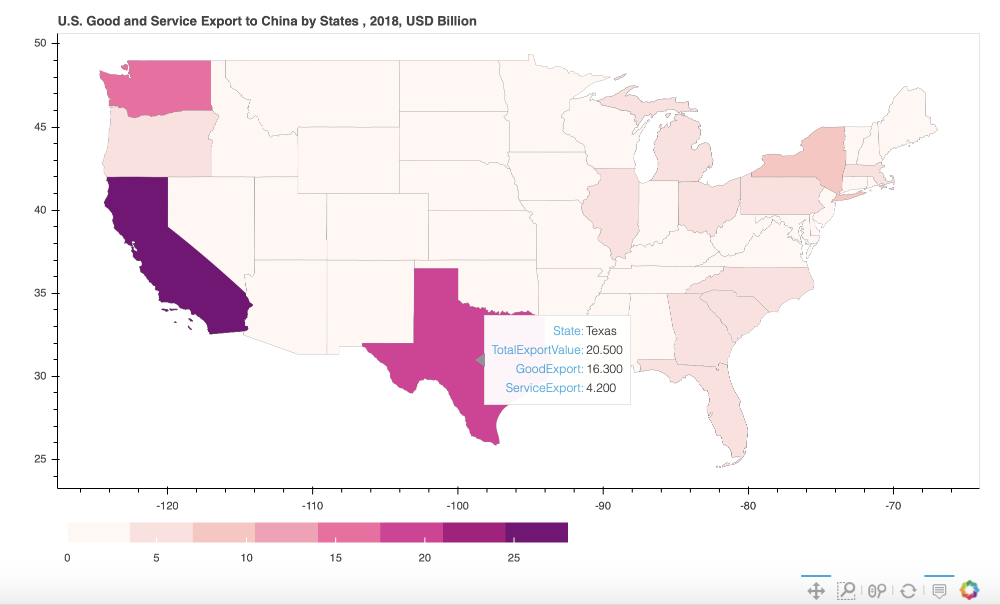

In [583]:
from IPython.display import Image
Image("/Users/zihao/Desktop/UBC/Econ 323/Project/U.S. Export State.png")

## 4.2 Goods Exports (non-service) Relative Change in 2019 by State
Though there were some states still witnessed a growth in exports to China, the major exporters, however, suffered from a decline. (As most parts of the heating map are darken) The 2019 Service Exports to China has not been released, so the contraction was only based on good exports.

In [474]:
# Define color palettes
palette = brewer['Blues'][8]
 
# Instantiate LinearColorMapper that linearly maps numbers in a range, into a sequence of colors.
color_mapper = LinearColorMapper(palette = palette, low = -2, high = 2)

# Define custom tick labels for color bar.
tick_labels = {'-2': '-2', '-1': '-1',
               '-0.5':'-0.5', '-0.2':'-0.2',
               '0':'0', '0.2':'0.2',
               '0.4':'0.4', '0.6':'0.6',
               '0.8':'0.8+'}

# Create color bar.
color_bar = ColorBar(color_mapper=color_mapper, label_standoff=8,width = 500, height = 20,
                     border_line_color=None,location = (0,0), orientation = 'horizontal',
                     major_label_overrides = tick_labels)

# Create figure object.
p = figure(title = 'U.S. Good Exports to China Relative Change by Percentage, 2019', plot_height = 600 ,
           plot_width = 950, toolbar_location = 'below',
           tools = "pan, wheel_zoom, box_zoom, reset")
p.xgrid.grid_line_color = None
p.ygrid.grid_line_color = None

# Add patch renderer to figure.
states = p.patches('xs','ys', source = geosource,
                   fill_color = {'field' :'Relative_Change', 'transform' : color_mapper},
                   line_color = 'gray', line_width = 0.25, fill_alpha = 1)

# Create hover tool
p.add_tools(HoverTool(renderers = [states],
                      tooltips = [('State','@NAME'),('GrowthRate', '@Relative_Change'),('GoodExport2018', '@Goods2018'),
                                 ('GoodsExport2019','@GoodsExports2019')]))

# Specify layout
p.add_layout(color_bar, 'below')
output_notebook()

show(p)

Loading BokehJS ...

You can also look at the video attached to the document "Relative change in flow.mov"

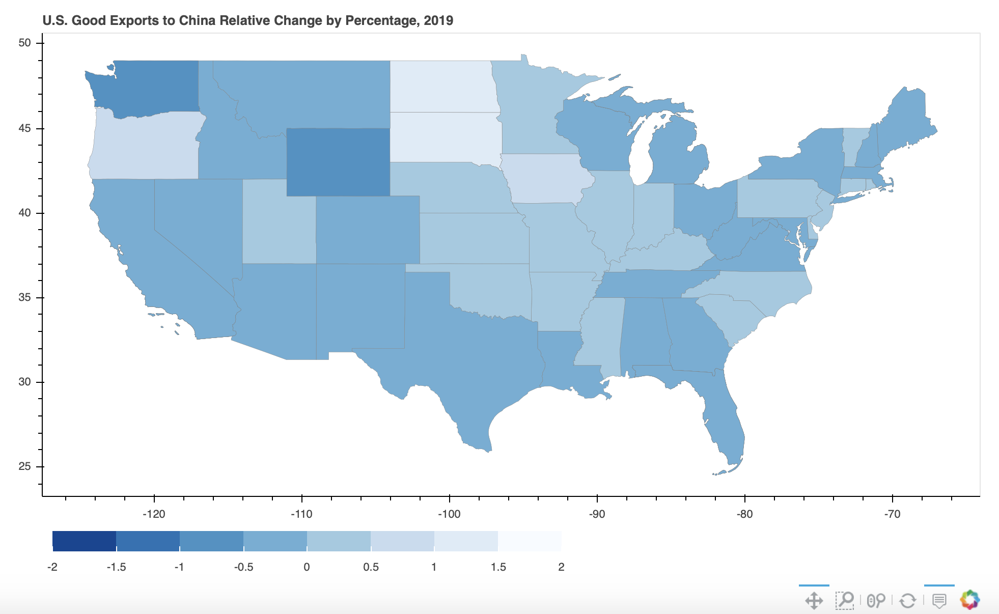

In [584]:
from IPython.display import Image
Image("/Users/zihao/Desktop/UBC/Econ 323/Project/Relative Change.png")

# 5 (Extra Global Trade 2014 Network Plot by NetworkX)

In [2]:
df

,iso_o,iso_d,year,FLOW
0,ABW,AFG,2001,0.0
1,ABW,AFG,2002,0.0
2,ABW,AFG,2003,0.0
3,ABW,AFG,2004,0.0
4,ABW,AFG,2005,0.0
...,...,...,...,...
537583,ZWE,ZMB,2010,46558256.0
537584,ZWE,ZMB,2011,55171376.0
537585,ZWE,ZMB,2012,58787336.0
537586,ZWE,ZMB,2013,77869776.0


In [4]:
df = df[['year', 'iso_o', 'iso_d', 'FLOW']]

In [5]:
df

,year,iso_o,iso_d,FLOW
0,2001,ABW,AFG,0.0
1,2002,ABW,AFG,0.0
2,2003,ABW,AFG,0.0
3,2004,ABW,AFG,0.0
4,2005,ABW,AFG,0.0
...,...,...,...,...
537583,2010,ZWE,ZMB,46558256.0
537584,2011,ZWE,ZMB,55171376.0
537585,2012,ZWE,ZMB,58787336.0
537586,2013,ZWE,ZMB,77869776.0


In [9]:
df_year = df.set_index(["year"])

In [10]:
df_year

,iso_o,iso_d,FLOW
year,,,
2001,ABW,AFG,0.0
2002,ABW,AFG,0.0
2003,ABW,AFG,0.0
2004,ABW,AFG,0.0
2005,ABW,AFG,0.0
...,...,...,...
2010,ZWE,ZMB,46558256.0
2011,ZWE,ZMB,55171376.0
2012,ZWE,ZMB,58787336.0


In [99]:
df_2014 = df_year.loc[2014]

In [100]:
df_2014.reset_index(drop=True,inplace=True)

In [104]:
df_2014

,iso_o,iso_d,FLOW
0,ABW,AFG,0.000000e+00
1,ABW,AGO,0.000000e+00
2,ABW,ALB,0.000000e+00
3,ABW,ARE,3.018303e+05
4,ABW,ARG,0.000000e+00
...,...,...,...
36966,ZWE,VUT,0.000000e+00
36967,ZWE,WSM,0.000000e+00
36968,ZWE,YEM,4.629711e+05
36969,ZWE,ZAF,1.235077e+08


In [105]:
df_2014["FLOW"] = df_2014["FLOW"].replace('nan', np.nan).fillna(0)

/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [107]:
df_2014.head(6)

,iso_o,iso_d,FLOW
0,ABW,AFG,0.0000
1,ABW,AGO,0.0000
2,ABW,ALB,0.0000
3,ABW,ARE,301830.3125
4,ABW,ARG,0.0000
5,ABW,ARM,0.0000


In [108]:
df_2014.to_csv(r'/Users/zihao/Desktop/UBC/Econ 323/Project/df_2014_prep .csv', index = False)

In [143]:
df_2014_copy = df_2014.copy()
aggregate_exports = df_2014_copy.groupby('iso_o')['FLOW'].sum().reset_index()
aggregate_exports

,iso_o,FLOW
0,ABW,3.859146e+08
1,AFG,4.465384e+08
2,AGO,3.754324e+10
3,ALB,1.401560e+09
4,ARE,1.447143e+11
...,...,...
191,YEM,6.121867e+09
192,YUG,0.000000e+00
193,ZAF,8.141608e+10
194,ZMB,4.169583e+09


I only selected the top 100 exporters, since low trade flow value will dramatically change the eigenvector values and distortes the node's size.

In [336]:
top100_aggregate_exports = aggregate_exports.nlargest(100,'FLOW')
top100 = top100_aggregate_exports['iso_o'].values.tolist()

top100_2014 = df_2014_copy[df_2014_copy ['iso_o'].isin(top100)]
top100_2014_square = top100_2014[top100_2014['iso_d'].isin(top100)]
top100_2014_square

,iso_o,iso_d,FLOW
374,AGO,ARE,0.000000e+00
375,AGO,ARG,3.211250e+03
377,AGO,AUS,3.731991e+07
378,AGO,AUT,2.813790e+04
379,AGO,AZE,1.823190e+03
...,...,...,...
36769,ZMB,USA,3.380583e+07
36772,ZMB,VEN,0.000000e+00
36773,ZMB,VNM,1.914714e+05
36776,ZMB,YEM,0.000000e+00


In [337]:
top100_2014_square.to_csv(r'/Users/zihao/Desktop/UBC/Econ 323/Project/top100_2014_square.csv', index = False)

### Eigenvector centrality
https://en.wikipedia.org/wiki/Eigenvector_centrality

In graph theory, eigenvector centrality (also called eigencentrality or prestige score) is a measure of the influence of a node in a network. Relative scores are assigned to all nodes in the network based on the concept that connections to high-scoring nodes contribute more to the score of the node in question than equal connections to low-scoring nodes. A high eigenvector score means that a node is connected to many nodes who themselves have high scores.

$$
{\displaystyle x_{v}={\frac {1}{\lambda }}\sum _{t\in M(v)}x_{t}={\frac {1}{\lambda }}\sum _{t\in G}a_{v,t}x_{t}}
$$
where $M(v)$  is a set of the neighbors of $v$ and $\lambda$  is a constant. With a small rearrangement this can be rewritten in vector notation as the eigenvector equation
where 
$${\displaystyle \mathbf {Ax} =\lambda \mathbf {x} }$$


In [336]:
import networkx as nx
import csv
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
%matplotlib inline

Here I apply right eigen cenrality for export to consturct the network grah based on ComputSimu http://computsimu.blogspot.com/2014/01/networks-1-scraping-data-visualization.html
and https://briandew.wordpress.com/2016/06/15/trade-network-analysis-why-centrality-matters/

In [345]:
G = nx.DiGraph() # create a directed graph called G
 
# Loop reads a csv file with scrap aluminum bilateral trade data
with open('/Users/zihao/Desktop/UBC/Econ 323/Project/top100_2014_square.csv', 'r') as csvfile:

     csv_f = csv.reader(csvfile)
     next(csv_f)

# Now we build the network by adding each row of data 
# as an edge between two nodes (columns 1 and 2).
     for row in csv_f:
          G.add_edge(row[0],row[1],weight=row[2])

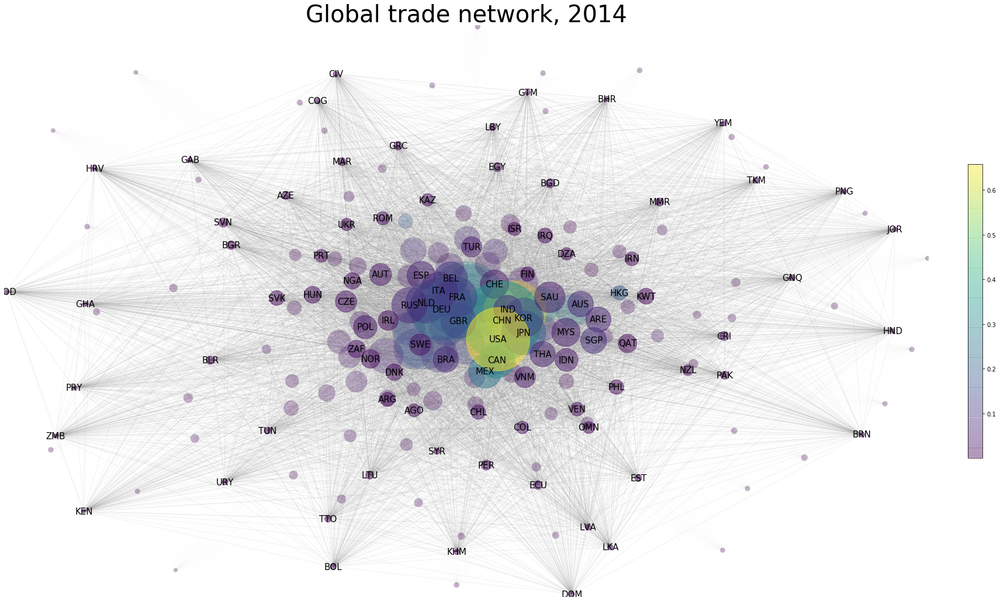

<Figure size 432x288 with 0 Axes>

In [354]:
ec = nx.eigenvector_centrality_numpy(G, weight='weight')
nx.set_node_attributes(G,ec,'cent')
node_color = [float(G.nodes[v]['cent']) for v in G]
totexp = {}

# Calculate total exports of each country in the network
for exp in G.nodes(): 
     tx=sum([float(g) for exp,f,g in G.out_edges(exp, 'weight')])
     totexp[exp] = tx
     avgexp = np.mean(tx)
nx.set_node_attributes(G,  totexp, 'totexp')

# Use the results later for the node's size in the graph
node_size = [float(G.nodes[v]['totexp'])*50 / avgexp for v in G]

fig = plt.figure(figsize = (30,18))


nodes = nx.draw_networkx_nodes(G,pos, node_size=node_size, \
                               node_color=node_color, alpha=0.3) 
# Draw edges
edges = nx.draw_networkx_edges(G, pos, edge_color='lightgray', \
                               arrows=False, width=0.01,)
# Visualization
# Calculate position of each node in G using networkx spring layout
pos = nx.spring_layout(G,k=500,iterations=50) 

# Draw nodes
nx.draw_networkx_nodes(G,pos, node_size=node_size, node_color=node_color, alpha=0.5)

# Draw edges
nx.draw_networkx_edges(G, pos, edge_color='gray', arrows=False, width=0.05,)

# Add labels
nx.draw_networkx_labels(G,pos,font_size=15)
nodes.set_edgecolor('gray')

# Add labels and title

plt.title('Global trade network, 2014', fontsize=40)


# Bar with color scale for eigenvalues

cbar = plt.colorbar(mappable=nodes, cax=None, ax=None, fraction=0.015, pad=0.04)


plt.margins(0,0)
plt.axis('off')


plt.show()
plt.savefig("trade.pdf")








# 6. Small Dataset with Precise Aggregate Tariff Data
## 6.1 Clean Data
This dataset captures the trade flow and the Aggregate Bilateral Data from CEPII TRADHIST. Two Centuries of Bilateral Trade and Gravity Data: 1827-2014  http://www.cepii.fr/cepii/en/bdd_modele/download.asp?id=32
CEPII Working Paper, N°2016-14, mai 2016
Michel Fouquin, Jules Hugot.

I also merged it with the WITS tariff data.

In [5]:
df_china = df.set_index('iso_o').loc['CHN']
df_china


,iso_d,year,FLOW
iso_o,,,
CHN,ABW,2001,4.046692e+06
CHN,ABW,2002,2.313028e+06
CHN,ABW,2003,1.456348e+06
CHN,ABW,2004,2.851764e+06
CHN,ABW,2005,4.361033e+06
...,...,...,...
CHN,ZWE,2010,2.227241e+08
CHN,ZWE,2011,2.785391e+08
CHN,ZWE,2012,2.997592e+08


In [6]:
df_us= df.set_index('iso_o').loc['USA']
df_us

,iso_d,year,FLOW
iso_o,,,
USA,ABW,2001,319394048.0
USA,ABW,2002,307090048.0
USA,ABW,2003,286488672.0
USA,ABW,2004,265345168.0
USA,ABW,2005,316823584.0
...,...,...,...
USA,ZWE,2010,47981852.0
USA,ZWE,2011,42290668.0
USA,ZWE,2012,37239684.0


In [7]:
df_04_16_gravity = pd.read_csv(r'/Users/zihao/Desktop/UBC/Econ 323/Project/gravity dataset/DATASET/2004-2016 gravity.csv')
df_04_16_gravity

,year,country_d,iso3_d,dynamic_code_d,landlocked_d,island_d,region_d,gdp_pwt_const_d,pop_d,gdp_pwt_cur_d,...,hostility_level_o,hostility_level_d,distance,common_language,colony_of_destination_after45,colony_of_destination_current,colony_of_destination_ever,colony_of_origin_after45,colony_of_origin_current,colony_of_origin_ever
0,2005,Aruba,ABW,ABW,0,1,caribbean,3906.5203,0.100031,4093.2434,...,0,0,120.05867,1,0,0,0,0,0,0
1,2006,Aruba,ABW,ABW,0,1,caribbean,4118.1396,0.100830,4217.0669,...,0,0,978.77728,1,0,0,0,0,0,0
2,2007,Aruba,ABW,ABW,0,1,caribbean,4196.4634,0.101218,4248.4707,...,0,0,8563.69630,0,0,0,0,0,0,0
3,2008,Aruba,ABW,ABW,0,1,caribbean,4433.6772,0.101342,4441.8828,...,0,0,7562.67330,0,0,0,0,0,0,0
4,2009,Aruba,ABW,ABW,0,1,caribbean,4183.0449,0.101416,4304.9224,...,0,0,16904.59600,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746043,2016,Zimbabwe,ZWE,ZWE,1,0,africa,NaN,NaN,NaN,...,0,0,10163.50800,1,0,0,0,0,0,0
746044,2016,Zimbabwe,ZWE,ZWE,1,0,africa,NaN,NaN,NaN,...,0,0,11205.32000,1,0,0,0,0,0,0
746045,2016,Zimbabwe,ZWE,ZWE,1,0,africa,NaN,NaN,NaN,...,0,0,15422.45000,0,0,0,0,0,0,0
746046,2016,Zimbabwe,ZWE,ZWE,1,0,africa,NaN,NaN,NaN,...,0,0,10944.65400,1,0,0,0,0,0,0


In [8]:
df_93_04_gravity = pd.read_csv(r'/Users/zihao/Desktop/UBC/Econ 323/Project/gravity dataset/DATASET/1993-2004 gravity.csv')
df_93_04_gravity

,year,country_d,iso3_d,dynamic_code_d,landlocked_d,island_d,region_d,gdp_pwt_const_d,pop_d,gdp_pwt_cur_d,...,hostility_level_o,hostility_level_d,distance,common_language,colony_of_destination_after45,colony_of_destination_current,colony_of_destination_ever,colony_of_origin_after45,colony_of_origin_current,colony_of_origin_ever
0,1993,Aruba,ABW,ABW,0,1,caribbean,3642.4900,0.072498,3967.2341,...,0,0,2261.8384,1,0,0,0,0,0,0
1,1994,Aruba,ABW,ABW,0,1,caribbean,4120.8423,0.076700,4375.1250,...,0,0,18336.3320,1,0,0,0,0,0,0
2,1995,Aruba,ABW,ABW,0,1,caribbean,4051.7637,0.080326,4159.1152,...,0,0,13977.8780,0,0,0,0,0,0,0
3,1996,Aruba,ABW,ABW,0,1,caribbean,4171.4653,0.083195,4185.3594,...,0,0,4349.6777,1,0,0,0,0,0,0
4,1997,Aruba,ABW,ABW,0,1,caribbean,4420.3481,0.085447,4387.0752,...,0,0,1130.6757,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
716890,2004,Zimbabwe,ZWE,ZWE,1,0,africa,20304.7710,12.867828,20631.4080,...,0,0,11802.5430,0,0,0,0,0,0,0
716891,2004,Zimbabwe,ZWE,ZWE,1,0,africa,20304.7710,12.867828,20631.4080,...,0,0,12886.2270,1,0,0,0,0,0,0
716892,2004,Zimbabwe,ZWE,ZWE,1,0,africa,20304.7710,12.867828,20631.4080,...,0,0,10374.1750,0,0,0,0,0,0,0
716893,2004,Zimbabwe,ZWE,ZWE,1,0,africa,20304.7710,12.867828,20631.4080,...,0,0,7659.8032,0,0,0,0,0,0,0


In [679]:
df_gravity = pd.read_stata(r'/Users/zihao/Desktop/UBC/Econ 323/Project/TRADHIST_WP.dta')
df_gravity

,iso_o,iso_d,year,FLOW,FLOW_0,SOURCE_TF,GDP_o,SOURCE_GDP_o,GDP_d,SOURCE_GDP_d,...,Indepdate_o,Indepdate_d,XCH_RATE_o,SOURCE_XCH_o,XCH_RATE_d,SOURCE_XCH_d,CONTI_o,CONTI_d,REGIO_o,REGIO_d
0,,ADEN,1950,NaN,NaN,,NaN,,NaN,,...,NaN,1967.0,NaN,,NaN,,,ASIA,,MIDEST
1,,ADEN,1951,NaN,NaN,,NaN,,NaN,,...,NaN,1967.0,NaN,,NaN,,,ASIA,,MIDEST
2,,ADEN,1952,NaN,NaN,,NaN,,NaN,,...,NaN,1967.0,NaN,,NaN,,,ASIA,,MIDEST
3,,ADEN,1953,NaN,NaN,,NaN,,NaN,,...,NaN,1967.0,NaN,,NaN,,,ASIA,,MIDEST
4,,ADEN,1954,NaN,NaN,,NaN,,NaN,,...,NaN,1967.0,NaN,,NaN,,,ASIA,,MIDEST
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2510149,ZWE,ZMB,2010,46558256.0,NaN,DOTS_IP,6.097825e+09,WDI,1.311544e+10,WDI,...,1980.0,1964.0,NaN,,0.134909,IFS,AFRI,AFRI,STHAFR,STHAFR
2510150,ZWE,ZMB,2011,55171376.0,NaN,DOTS_IP,6.838230e+09,WDI,1.481194e+10,WDI,...,1980.0,1964.0,NaN,,0.128406,IFS,AFRI,AFRI,STHAFR,STHAFR
2510151,ZWE,ZMB,2012,58787336.0,NaN,DOTS_IP,7.845171e+09,WDI,1.578776e+10,WDI,...,1980.0,1964.0,NaN,,0.122987,IFS,AFRI,AFRI,STHAFR,STHAFR
2510152,ZWE,ZMB,2013,77869776.0,NaN,DOTS_IP,8.629172e+09,WDI,1.715622e+10,WDI,...,1980.0,1964.0,NaN,,0.118546,IFS,AFRI,AFRI,STHAFR,STHAFR


In [680]:
df_gravity_1 = df_gravity[['iso_o','iso_d','year','FLOW','GDP_o','GDP_d','IPTOT_o','IPTOT_d','XPTOT_o','XPTOT_d','TARIFF_o','TARIFF_d',
                       'Dist','Comlang','Contig','Curcol']]
df_gravity_2 = df_gravity[['iso_o','iso_d','year','FLOW','GDP_o','GDP_d','IPTOT_o','IPTOT_d','XPTOT_o','XPTOT_d','TARIFF_d',
                       'Dist','Comlang','Contig','Curcol']] 

In [681]:
df_us_gravity_1= df_gravity_1.set_index('iso_o').loc['USA']
df_us_92 = df_us_gravity_1[df_us_gravity_1['year'] >= 1945]
df_us_92

,iso_d,year,FLOW,GDP_o,GDP_d,IPTOT_o,IPTOT_d,XPTOT_o,XPTOT_d,TARIFF_o,TARIFF_d,Dist,Comlang,Contig,Curcol
iso_o,,,,,,,,,,,,,,,
USA,ABW,1989,77439896.0,3.457829e+12,NaN,3.015228e+11,2.457325e+08,2.283166e+11,1.997382e+07,3.463053,NaN,3859.885498,1,0.0,0.0
USA,ABW,1990,113874384.0,3.367567e+12,NaN,2.911732e+11,3.271146e+08,2.288749e+11,1.353272e+07,3.515915,NaN,3859.885498,1,0.0,0.0
USA,ABW,1991,132908312.0,3.500775e+12,NaN,2.887921e+11,7.954365e+08,2.542448e+11,8.829330e+07,3.430391,NaN,3859.885498,1,0.0,0.0
USA,ABW,1992,164151888.0,3.725922e+12,NaN,3.148645e+11,7.441439e+08,2.715215e+11,2.035974e+08,3.443393,NaN,3859.885498,1,0.0,0.0
USA,ABW,1993,177090656.0,4.586433e+12,NaN,4.020604e+11,9.306661e+08,3.294941e+11,3.774600e+08,3.421995,NaN,3859.885498,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
USA,ZWE,2010,47981852.0,9.684627e+12,6.097825e+09,1.273726e+12,2.673542e+09,8.267647e+11,2.070475e+09,1.497259,NaN,14160.549805,1,0.0,0.0
USA,ZWE,2011,42290668.0,9.685374e+12,6.838230e+09,1.378072e+12,3.097955e+09,9.252765e+11,2.192061e+09,NaN,NaN,14160.549805,1,0.0,0.0
USA,ZWE,2012,37239684.0,1.023204e+13,7.845171e+09,1.440980e+12,3.321382e+09,9.785577e+11,2.457760e+09,NaN,NaN,14160.549805,1,0.0,0.0


In [682]:
null_sum = df_us_92['TARIFF_o'].isnull().sum()
null_sum 

776

In [79]:

a= df_us_92.dropna(axis=0, subset=['GDP_d'])

In [85]:
b = a.fillna(method="ffill")


In [86]:
b.isnull().sum()

iso_d       0
year        0
FLOW        0
GDP_o       0
GDP_d       0
IPTOT_o     0
IPTOT_d     0
XPTOT_o     0
XPTOT_d     0
TARIFF_o    0
Dist        0
Comlang     0
Contig      0
Curcol      0
dtype: int64

Let's only focus on the U.S.-China trade flow, looking at the significance of U.S. import tariff on Chinese goods

In [683]:
df_china_gravity_2= df_gravity_2.set_index('iso_o').loc['CHN']
df_china_92 = df_china_gravity_2[df_china_gravity_2['year'] >= 1992]
china_to_us = df_china_92.reset_index().set_index('iso_d').loc['USA'].reset_index().set_index('iso_o').drop(['TARIFF_d','Dist','Comlang','Contig','Curcol'],axis=1)
china_to_us.head()



,iso_d,year,FLOW,GDP_o,GDP_d,IPTOT_o,IPTOT_d,XPTOT_o,XPTOT_d
iso_o,,,,,,,,,
CHN,USA,1992,1.561893e+10,2.421164e+11,3.725922e+12,4.664825e+10,3.148645e+11,7.779882e+10,2.715215e+11
CHN,USA,1993,2.234483e+10,2.952897e+11,4.586433e+12,7.234828e+10,4.020604e+11,1.058858e+11,3.294941e+11
CHN,USA,1994,2.702731e+10,3.673966e+11,4.775738e+12,7.895586e+10,4.504536e+11,1.250470e+11,3.634313e+11
CHN,USA,1995,3.074602e+10,4.638653e+11,4.856469e+12,9.274582e+10,4.886170e+11,1.469554e+11,4.067594e+11
CHN,USA,1996,3.487382e+10,5.517650e+11,5.191889e+12,1.004244e+11,5.242101e+11,1.626788e+11,4.444080e+11


In [693]:
df_us_gravity_2= df_gravity_2.set_index('iso_o').loc['USA']
df_us_92 = df_us_gravity_2[df_us_gravity_2['year'] >= 1992]
us_to_china = df_us_92.reset_index().set_index('iso_d').loc['CHN'].reset_index().set_index('iso_o').drop(['TARIFF_d','Dist','Comlang','Contig','Curcol'],axis=1)
us_to_china.head()

,iso_d,year,FLOW,GDP_o,GDP_d,IPTOT_o,IPTOT_d,XPTOT_o,XPTOT_d
iso_o,,,,,,,,,
USA,CHN,1992,5.072527e+09,3.725922e+12,2.421164e+11,3.148645e+11,4.664825e+10,2.715215e+11,7.779882e+10
USA,CHN,1993,7.089494e+09,4.586433e+12,2.952897e+11,4.020604e+11,7.234828e+10,3.294941e+11,1.058858e+11
USA,CHN,1994,9.132753e+09,4.775738e+12,3.673966e+11,4.504536e+11,7.895586e+10,3.634313e+11,1.250470e+11
USA,CHN,1995,1.021676e+10,4.856469e+12,4.638653e+11,4.886170e+11,9.274582e+10,4.067594e+11,1.469554e+11
USA,CHN,1996,1.037000e+10,5.191889e+12,5.517650e+11,5.242101e+11,1.004244e+11,4.444080e+11,1.626788e+11


In [684]:
df_us_tariff_time =df_us_tariff_time.T.iloc[1:]


In [685]:
df_china_tariff_time =df_china_tariff_time.T.iloc[1:]

In [686]:
df_us_tariff_time.rename(columns={0:'U.S. on China'}, inplace=True)

In [687]:
df_china_tariff_time.rename(columns={0:'China on U.S.'}, inplace=True)

In [688]:
df_us_tariff_time.head()

,U.S. on China
1992,9.14025
1993,8.97955
1994,7.78781
1995,6.59607
1996,6.10936


In [689]:
df_china_tariff_time.head()

,China on U.S.
1992,22.5966
1993,25.2162
1994,20.1654
1995,19.799
1996,19.4326


In [690]:
china_to_us['U.S. Tariff']= df_us_tariff_time['U.S. on China'].values


In [694]:
us_to_china['China Tariff']=df_china_tariff_time['China on U.S.'].values

Finally I could get the 1992-2013 precise tariff data. Since some datas such us population and distance did not very much,
I simply drop the data. (I'll use those data when doing machine leanring). Let's look at the linear regression on some key factors.

In [695]:
china_to_us = china_to_us[china_to_us['year']<2014]

In [696]:
us_to_china = us_to_china[us_to_china['year']<2014]

In [697]:
china_to_us.tail()

,iso_d,year,FLOW,GDP_o,GDP_d,IPTOT_o,IPTOT_d,XPTOT_o,XPTOT_d,U.S. Tariff
iso_o,,,,,,,,,,
CHN,USA,2009,1.987112e+11,3.247738e+12,9.255663e+12,6.444161e+11,1.029349e+12,9.063443e+11,6.784442e+11,3.18477
CHN,USA,2010,2.478586e+11,3.908740e+12,9.684627e+12,9.021093e+11,1.273726e+12,1.160983e+12,8.267647e+11,3.1402
CHN,USA,2011,2.492638e+11,4.676334e+12,9.685374e+12,1.086898e+12,1.378072e+12,1.285863e+12,9.252765e+11,3.03097
CHN,USA,2012,2.694368e+11,5.356605e+12,1.023204e+13,1.150462e+12,1.440980e+12,1.356310e+12,9.785577e+11,2.94673
CHN,USA,2013,2.817285e+11,6.070769e+12,1.072587e+13,1.246891e+12,1.450988e+12,1.428233e+12,1.009660e+12,2.94626


## 6.2 Small Data Regression 

Firstly, take the log of all terms except the tariff data

In [698]:
china_to_us['log_flow'] = np.log(china_to_us['FLOW'])
china_to_us['log_GDP_o']= np.log(china_to_us['GDP_o']) 
china_to_us['log_GDP_d']= np.log(china_to_us['GDP_d']) 
china_to_us['log_IPTOT_o']= np.log(china_to_us['IPTOT_o']) 
china_to_us['log_IPTOT_d']= np.log(china_to_us['IPTOT_d']) 
china_to_us['log_XPTOT_o']= np.log(china_to_us['XPTOT_o']) 
china_to_us['log_XPTOT_d']= np.log(china_to_us['XPTOT_d']) 


us_to_china['log_flow'] = np.log(us_to_china['FLOW'])
us_to_china['log_GDP_o']= np.log(us_to_china['GDP_o']) 
us_to_china['log_GDP_d']= np.log(us_to_china['GDP_d'])  
us_to_china['log_IPTOT_o']= np.log(us_to_china['IPTOT_o']) 
us_to_china['log_IPTOT_d']= np.log(us_to_china['IPTOT_d']) 
us_to_china['log_XPTOT_o']= np.log(us_to_china['XPTOT_o']) 
us_to_china['log_XPTOT_d']= np.log(us_to_china['XPTOT_d']) 

df_china_to_us = china_to_us.drop(['FLOW','GDP_o','GDP_d','IPTOT_o','IPTOT_d','XPTOT_o','XPTOT_d'],axis=1)
df_us_to_china = us_to_china.drop(['FLOW','GDP_o','GDP_d','IPTOT_o','IPTOT_d','XPTOT_o','XPTOT_d'],axis=1)
df_china_to_us.head()



,iso_d,year,U.S. Tariff,log_flow,log_GDP_o,log_GDP_d,log_IPTOT_o,log_IPTOT_d,log_XPTOT_o,log_XPTOT_d
iso_o,,,,,,,,,,
CHN,USA,1992,9.14025,23.471750,26.212685,28.946335,24.565901,26.475409,25.077393,26.327307
CHN,USA,1993,8.97955,23.829861,26.411222,29.154123,25.004757,26.719868,25.385628,26.520824
CHN,USA,1994,7.78781,24.020113,26.629707,29.194571,25.092155,26.833521,25.551956,26.618856
CHN,USA,1995,6.59607,24.149027,26.862860,29.211332,25.253128,26.914845,25.713394,26.731487
CHN,USA,1996,6.10936,24.275002,27.036388,29.278118,25.332670,26.985159,25.815044,26.820009


In [699]:
df_us_to_china.head()

,iso_d,year,China Tariff,log_flow,log_GDP_o,log_GDP_d,log_IPTOT_o,log_IPTOT_d,log_XPTOT_o,log_XPTOT_d
iso_o,,,,,,,,,,
USA,CHN,1992,22.5966,22.347105,28.946335,26.212685,26.475409,24.565901,26.327307,25.077393
USA,CHN,1993,25.2162,22.681879,29.154123,26.411222,26.719868,25.004757,26.520824,25.385628
USA,CHN,1994,20.1654,22.935133,29.194571,26.629707,26.833521,25.092155,26.618856,25.551956
USA,CHN,1995,19.799,23.047295,29.211332,26.862860,26.914845,25.253128,26.731487,25.713394
USA,CHN,1996,19.4326,23.062183,29.278118,27.036388,26.985159,25.332670,26.820009,25.815044


In [700]:
y_china = df_china_to_us['log_flow']
y_us = df_us_to_china['log_flow']
y_china.head()

iso_o
CHN    23.471750
CHN    23.829861
CHN    24.020113
CHN    24.149027
CHN    24.275002
Name: log_flow, dtype: float32

In [701]:
y_us.head()

iso_o
USA    22.347105
USA    22.681879
USA    22.935133
USA    23.047295
USA    23.062183
Name: log_flow, dtype: float32

Take the varaible matrix X

In [702]:
X_china = df_china_to_us.drop(["log_flow",'iso_d','year'], axis=1).copy()
X_us = df_us_to_china.drop(["log_flow",'iso_d','year'], axis=1).copy()
# convert everything to be a float for later on
for i in X_china,X_us:
    for col in list(i):
        i[col] = i[col].astype(float)
X_china.head()

,U.S. Tariff,log_GDP_o,log_GDP_d,log_IPTOT_o,log_IPTOT_d,log_XPTOT_o,log_XPTOT_d
iso_o,,,,,,,
CHN,9.140252,26.212685,28.946335,24.565901,26.475409,25.077393,26.327307
CHN,8.979555,26.411222,29.154123,25.004757,26.719868,25.385628,26.520824
CHN,7.787814,26.629707,29.194571,25.092155,26.833521,25.551956,26.618856
CHN,6.596073,26.862860,29.211332,25.253128,26.914845,25.713394,26.731487
CHN,6.109358,27.036388,29.278118,25.332670,26.985159,25.815044,26.820009


In [703]:
X_us.head()

,China Tariff,log_GDP_o,log_GDP_d,log_IPTOT_o,log_IPTOT_d,log_XPTOT_o,log_XPTOT_d
iso_o,,,,,,,
USA,22.596588,28.946335,26.212685,26.475409,24.565901,26.327307,25.077393
USA,25.216208,29.154123,26.411222,26.719868,25.004757,26.520824,25.385628
USA,20.165407,29.194571,26.629707,26.833521,25.092155,26.618856,25.551956
USA,19.798993,29.211332,26.862860,26.914845,25.253128,26.731487,25.713394
USA,19.432578,29.278118,27.036388,26.985159,25.332670,26.820009,25.815044


A standard scatter plot 

I really need to apologize that I didn't have enough time to collect the precise time-series tariff data for longer period, since the bilateral data from the World Bank dataset is exteremly tedious to clean, and for the exsiting balateral trade dataset from CEPII, the aggregate data has not been updated for years. What I'll do next is the do a machine learning on gravity model to predict the trade if no tariff war happened.

Fit model: China export flow = 27.0495 + -0.4122 tariff imposed by the United States
Fit model: U.S. export flow = 25.0826 + -0.1084 tariff imposed by China


Text(0.5, 1.0, 'U.S. Export to China Linear Regression')

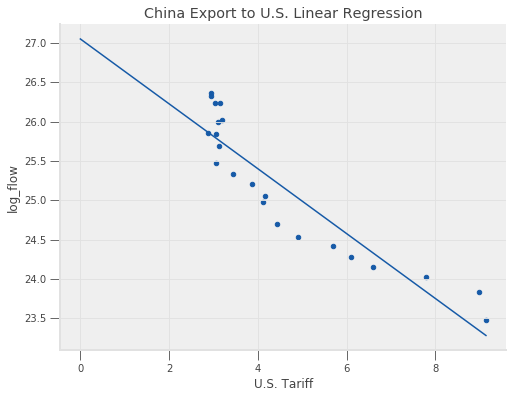

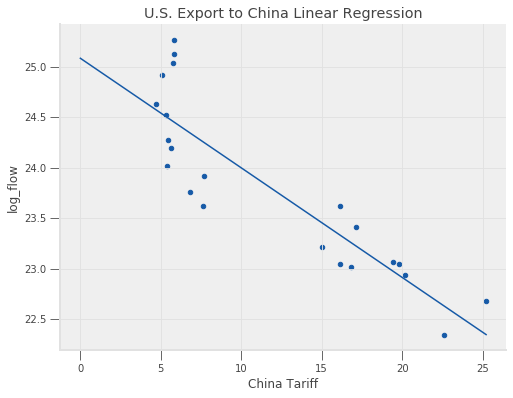

In [706]:
# import
from sklearn import linear_model

# construct the model instance
china_lr_model = linear_model.LinearRegression()
us_lr_model = linear_model.LinearRegression()

# fit the model
china_lr_model.fit(X_china[['U.S. Tariff']], y_china)
us_lr_model.fit(X_us[['China Tariff']], y_us)


# print the coefficients
beta_0 = china_lr_model.intercept_
beta_1 = china_lr_model.coef_[0]
beta_2 = us_lr_model.intercept_
beta_3 = us_lr_model.coef_[0]


#####
print(f"Fit model: China export flow = {beta_0:.4f} + {beta_1:.4f} tariff imposed by the United States")
print(f"Fit model: U.S. export flow = {beta_2:.4f} + {beta_3:.4f} tariff imposed by China")


# points for the line
# use np.array to define the x axis

def var_scatter_china(df, ax=None, var="U.S. Tariff"):
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 6))
    df.plot.scatter(x=var , y="log_flow", alpha=1, s=20, ax=ax)

    return ax
def var_scatter_us(df, ax=None, var="China Tariff"):
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 6))
    df.plot.scatter(x=var , y="log_flow", alpha=1, s=20, ax=ax)

    return ax




ax[0] = var_scatter_china(df_china_to_us)
ax[1] = var_scatter_us(df_us_to_china)


x_china = np.array([0, df_china_to_us["U.S. Tariff"].max()])
x_us = np.array([0, df_us_to_china["China Tariff"].max()])
ax[0].plot(x_china, beta_0 + beta_1*x_china)
ax[0].set_title('China Export to U.S. Linear Regression')
ax[1].plot(x_us, beta_2 + beta_3*x_us)
ax[1].set_title('U.S. Export to China Linear Regression')


    



Let's look at the mean square error of the full model and plot them out
The mean squared error loss function for the general model is

$$
\frac{1}{N} \sum_{i=1}^N (y_i - X_i \beta)^2 = \frac{1}{N} \| y - X \beta\|_2^2
$$

In [707]:
lr_model_china = linear_model.LinearRegression()
lr_model_china.fit(X_china, y_china)
lr_model_us = linear_model.LinearRegression()
lr_model_us.fit(X_us, y_us)
china_mse = metrics.mean_squared_error(y_china, china_lr_model.predict(X_china[["U.S. Tariff"]]))
print(f"The mse of the China full model is {china_mse:.4f}")
us_mse = metrics.mean_squared_error(y_us, us_lr_model.predict(X_us[["China Tariff"]]))
print(f"The mse of the U.S. full model is {us_mse:.4f}")




The mse of the China full model is 0.1155
The mse of the U.S. full model is 0.1512


Text(8, 25.5, 'mse =0.1155')

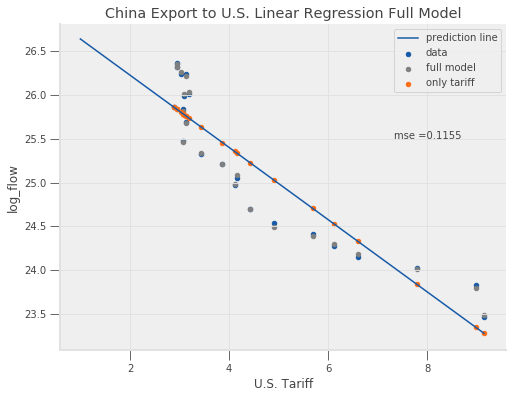

In [709]:
ax = var_scatter_china(df_china_to_us)
x_china = np.array([1, df_china_to_us["U.S. Tariff"].max()])

ax.plot(x_china, beta_0 + beta_1*x_china)
ax.set_title('China Export to U.S. Linear Regression Full Model')
def scatter_model(mod, X, ax=None, color="gray", x="U.S. Tariff"):
    if ax is None:
        _, ax = plt.subplots()

    ax.scatter(X[x], mod.predict(X), c=color, alpha=1, s=20)
    return ax

scatter_model(lr_model_china, X_china, ax, color='gray')
scatter_model(china_lr_model, X_china[["U.S. Tariff"]], ax, color="#ff6d13")
ax.legend(["prediction line", "data", "full model",'only tariff'])
ax.text(8, 25.5, f'mse ={china_mse:.4f}' , ha='center')


Text(20, 24, 'mse =0.1512')

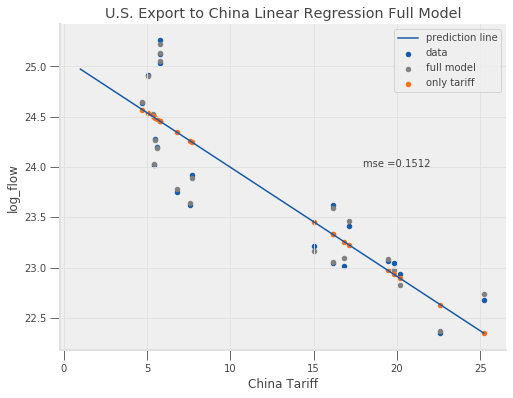

In [710]:
ax = var_scatter_us(df_us_to_china)
x_us = np.array([1, df_us_to_china["China Tariff"].max()])

ax.plot(x_us, beta_2 + beta_3*x_us)
ax.set_title('U.S. Export to China Linear Regression Full Model')
def scatter_model(mod, X, ax=None, color="gray", x="China Tariff"):
    if ax is None:
        _, ax = plt.subplots()

    ax.scatter(X[x], mod.predict(X), c=color, alpha=1, s=20)
    return ax

scatter_model(lr_model_us, X_us, ax, color='gray')
scatter_model(us_lr_model, X_us[["China Tariff"]], ax, color="#ff6d13")
ax.legend(["prediction line", "data", "full model",'only tariff'])
ax.text(20, 24, f'mse ={us_mse:.4f}' , ha='center')

Let's make a naive prediction on the U.S. - China trade flow if the tariff rate goes up to 21% for both countries

In [715]:
logt_china_21 =china_lr_model.predict([[21]])[0]
print(f"If the U.S. import tariff on Chinese goods increases to 21%, the export flow is predited to be {np.exp(logt_china_21):.2f} and {logt_china_21} in log term")
logt_us_21 = us_lr_model.predict([[21]])[0]
print(f"If the China's import tariff on the U.S. goods increases to 21%, the export flow is predited to be {np.exp(logt_us_21):.2f} and and {logt_us_21} in log term")


If the U.S. import tariff on Chinese goods increases to 21%, the export flow is predited to be 97198393.07 and 18.392264737131246 in log term
If the China's import tariff on the U.S. goods increases to 21%, the export flow is predited to be 8027450054.60 and and 22.806132762121553 in log term


We see this is a very naive prediction, the first reason is that there's not many samples presenting in the prediction. Second is that China has never experienced such high tariff from the U.S. for decades, therefore the shrink of the Chinese exports to the U.S. is dramatic.

# 7 Large Dataset Gravity, Lasso, Neural Networks and Classification
## 7.1 Cleaning Data
Now, I'll apply some machine learning on the whole graivty model database. This dataset comes from 

The United States International trade commission based on the exports of the United States. Tamara Gurevich and Peter Herman, (2018). The Dynamic Gravity Dataset: 1948-2016. USITC Working Paper 2018-02-A.
https://www.usitc.gov/data/gravity/dataset.htm

CEPII TRADHIST. Two Centuries of Bilateral Trade and Gravity Data: 1827-2014 CEPII Working Paper, N°2016-14, mai 2016 Michel Fouquin, Jules Hugot.
http://www.cepii.fr/cepii/en/bdd_modele/download.asp?id=32

CEPII Gravity Database 
by Head, K., Mayer, T. & Ries, J. (2010),
The erosion of colonial trade linkages after independence
Journal of International Economics, 81(1):1-14 http://www.cepii.fr/CEPII/en/bdd_modele/download.asp?id=8

Head, K. and T. Mayer, (2014),
"Gravity Equations: Toolkit, Cookbook, Workhorse."
Handbook of International Economics, Vol. 4,eds. Gopinath, Helpman, and Rogoff, Elsevier. http://www.cepii.fr/CEPII/en/bdd_modele/download.asp?id=8



In [37]:
df_gravity_model =df_gravity_model[df_gravity_model['year'] <=2014]

In [38]:
df_gravity_model

,year,country_d,iso3_d,dynamic_code_d,landlocked_d,island_d,region_d,gdp_pwt_const_d,pop_d,gdp_pwt_cur_d,...,hostility_level_o,hostility_level_d,distance,common_language,colony_of_destination_after45,colony_of_destination_current,colony_of_destination_ever,colony_of_origin_after45,colony_of_origin_current,colony_of_origin_ever
0,2005,Aruba,ABW,ABW,0,1,caribbean,3906.5203,0.100031,4093.2434,...,0,0,120.05867,1,0,0,0,0,0,0
1,2006,Aruba,ABW,ABW,0,1,caribbean,4118.1396,0.100830,4217.0669,...,0,0,978.77728,1,0,0,0,0,0,0
2,2007,Aruba,ABW,ABW,0,1,caribbean,4196.4634,0.101218,4248.4707,...,0,0,8563.69630,0,0,0,0,0,0,0
3,2008,Aruba,ABW,ABW,0,1,caribbean,4433.6772,0.101342,4441.8828,...,0,0,7562.67330,0,0,0,0,0,0,0
4,2009,Aruba,ABW,ABW,0,1,caribbean,4183.0449,0.101416,4304.9224,...,0,0,16904.59600,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745543,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,12178.03300,1,0,0,0,0,0,0
745544,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,11158.91700,1,0,0,0,0,0,0
745545,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,10202.50000,0,0,0,0,0,0,0
745546,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,12930.38800,1,0,0,0,0,0,0


In [43]:
df_gravity_model = df_gravity_model.rename(columns={'iso3_d': 'iso_d', 'iso3_o': 'iso_o'})
df_gravity_model

,year,country_d,iso_d,dynamic_code_d,landlocked_d,island_d,region_d,gdp_pwt_const_d,pop_d,gdp_pwt_cur_d,...,hostility_level_o,hostility_level_d,distance,common_language,colony_of_destination_after45,colony_of_destination_current,colony_of_destination_ever,colony_of_origin_after45,colony_of_origin_current,colony_of_origin_ever
0,2005,Aruba,ABW,ABW,0,1,caribbean,3906.5203,0.100031,4093.2434,...,0,0,120.05867,1,0,0,0,0,0,0
1,2006,Aruba,ABW,ABW,0,1,caribbean,4118.1396,0.100830,4217.0669,...,0,0,978.77728,1,0,0,0,0,0,0
2,2007,Aruba,ABW,ABW,0,1,caribbean,4196.4634,0.101218,4248.4707,...,0,0,8563.69630,0,0,0,0,0,0,0
3,2008,Aruba,ABW,ABW,0,1,caribbean,4433.6772,0.101342,4441.8828,...,0,0,7562.67330,0,0,0,0,0,0,0
4,2009,Aruba,ABW,ABW,0,1,caribbean,4183.0449,0.101416,4304.9224,...,0,0,16904.59600,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745543,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,12178.03300,1,0,0,0,0,0,0
745544,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,11158.91700,1,0,0,0,0,0,0
745545,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,10202.50000,0,0,0,0,0,0,0
745546,2014,Zimbabwe,ZWE,ZWE,1,0,africa,29149.7090,15.245855,29001.2250,...,0,0,12930.38800,1,0,0,0,0,0,0


In [ ]:
df_gravity_model_columns = df_gravity_model[df_gravity_model['year','iso3_d','iso3_o','iso3_d' ]]

In [322]:
df_gravity_model.describe()

,year,landlocked_d,island_d,gdp_pwt_const_d,pop_d,gdp_pwt_cur_d,capital_cur_d,capital_const_d,gdp_wdi_cur_d,gdp_wdi_const_d,...,hostility_level_o,hostility_level_d,distance,common_language,colony_of_destination_after45,colony_of_destination_current,colony_of_destination_ever,colony_of_origin_after45,colony_of_origin_current,colony_of_origin_ever
count,746048.000000,746048.000000,746048.000000,4.477220e+05,447722.000000,4.477220e+05,4.454640e+05,4.454640e+05,5.426720e+05,5.307520e+05,...,746048.000000,746048.000000,746048.000000,746048.000000,746048.000000,746048.0,746048.000000,746048.000000,746048.0,746048.000000
mean,2010.548042,0.169466,0.336915,4.848036e+05,37.745831,4.850836e+05,1.646679e+06,1.714354e+06,3.289086e+11,3.402141e+11,...,0.001556,0.001556,8459.633215,0.399296,0.001713,0.0,0.002206,0.001713,0.0,0.002206
std,3.445108,0.375164,0.472656,1.625387e+06,138.725228,1.624879e+06,5.536413e+06,5.547838e+06,1.330710e+12,1.325681e+12,...,0.074089,0.074089,4670.073812,0.489754,0.041353,0.0,0.046919,0.041353,0.0,0.046919
min,2005.000000,0.000000,0.000000,7.285319e+01,0.004777,7.251530e+01,7.111269e+02,9.787498e+02,2.043274e+07,2.918573e+07,...,0.000000,0.000000,0.183362,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
25%,2008.000000,0.000000,0.000000,1.603936e+04,2.062881,1.619303e+04,4.065764e+04,4.594060e+04,4.980000e+09,5.552580e+09,...,0.000000,0.000000,4748.271000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
50%,2011.000000,0.000000,0.000000,5.415848e+04,7.737316,5.424052e+04,1.604362e+05,1.852463e+05,2.095800e+10,2.320806e+10,...,0.000000,0.000000,8146.521500,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
75%,2014.000000,0.000000,1.000000,3.113398e+05,25.922239,3.144975e+05,1.046180e+06,1.139293e+06,1.625901e+11,1.679981e+11,...,0.000000,0.000000,11934.431000,1.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000
max,2016.000000,1.000000,1.000000,1.713595e+07,1369.435670,1.681026e+07,6.937970e+07,6.759007e+07,1.803665e+13,1.659745e+13,...,4.000000,4.000000,19868.152000,1.000000,1.000000,0.0,1.000000,1.000000,0.0,1.000000


In [31]:
df_gravity = df_gravity[df_gravity['FLOW'].notna()]


,iso_o,iso_d,year,FLOW,FLOW_0,SOURCE_TF,GDP_o,SOURCE_GDP_o,GDP_d,SOURCE_GDP_d,...,Indepdate_o,Indepdate_d,XCH_RATE_o,SOURCE_XCH_o,XCH_RATE_d,SOURCE_XCH_d,CONTI_o,CONTI_d,REGIO_o,REGIO_d
2187,2SICIL,AUTHUN,1838,492920.687500,NaN,RIC_IP,NaN,,NaN,,...,NaN,NaN,NaN,,NaN,,EUROP,EUROP,CTREUR,CTREUR
2188,2SICIL,BEL,1834,38164.500000,NaN,RIC_IP,NaN,,NaN,,...,NaN,NaN,NaN,,0.040975,HDBK,EUROP,EUROP,CTREUR,NWEUR
2189,2SICIL,BEL,1835,30052.339844,NaN,RIC_IP,NaN,,61133280.0,GGDC,...,NaN,NaN,NaN,,0.040850,HDBK,EUROP,EUROP,CTREUR,NWEUR
2190,2SICIL,BEL,1836,44906.539062,NaN,RIC_IP,NaN,,68204648.0,GGDC,...,NaN,NaN,NaN,,0.040960,HDBK,EUROP,EUROP,CTREUR,NWEUR
2191,2SICIL,BEL,1837,33957.269531,NaN,RIC_IP,NaN,,71462456.0,GGDC,...,NaN,NaN,NaN,,0.040960,HDBK,EUROP,EUROP,CTREUR,NWEUR


In [ ]:
df_gravity= df_gravity[df_gravity['year'] >= 1945]

In [ ]:
df_gravity = df_gravity[df_gravity['year','iso_o','iso_d','FLOW','GDP_o','GDP_d']

Now I merge the gravity data provided by CEPII which contains the trade flow and the gravity data by USITC which provides political indicators. 

In [45]:
df_final_version = pd.merge(df_gravity,df_gravity_model , on=['iso_o', 'iso_d','year'])

In [46]:
df_final_version

,iso_o,iso_d,year,FLOW,FLOW_0,SOURCE_TF,GDP_o,SOURCE_GDP_o,GDP_d,SOURCE_GDP_d,...,hostility_level_o,hostility_level_d,distance,common_language,colony_of_destination_after45,colony_of_destination_current,colony_of_destination_ever,colony_of_origin_after45,colony_of_origin_current,colony_of_origin_ever
0,ABW,AFG,2005,0.0,NaN,DOTS_IP,1.282048e+09,WDI,3.451279e+09,WDI,...,0,0,13146.86300,0,0,0,0,0,0,0
1,ABW,AFG,2006,0.0,NaN,DOTS_IP,1.316040e+09,WDI,3.835713e+09,WDI,...,0,0,13146.86300,0,0,0,0,0,0,0
2,ABW,AFG,2007,0.0,NaN,DOTS_IP,1.311265e+09,WDI,4.919677e+09,WDI,...,0,0,13146.86300,0,0,0,0,0,0,0
3,ABW,AFG,2008,0.0,NaN,DOTS_IP,1.518732e+09,WDI,5.543302e+09,WDI,...,0,0,13146.86300,0,0,0,0,0,0,0
4,ABW,AFG,2009,0.0,NaN,DOTS_IP,1.604113e+09,WDI,8.015607e+09,WDI,...,0,0,13146.86300,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319270,ZWE,ZMB,2010,46558256.0,NaN,DOTS_IP,6.097825e+09,WDI,1.311544e+10,WDI,...,0,0,605.01996,1,0,0,0,0,0,0
319271,ZWE,ZMB,2011,55171376.0,NaN,DOTS_IP,6.838230e+09,WDI,1.481194e+10,WDI,...,0,0,605.01996,1,0,0,0,0,0,0
319272,ZWE,ZMB,2012,58787336.0,NaN,DOTS_IP,7.845171e+09,WDI,1.578776e+10,WDI,...,0,0,605.01996,1,0,0,0,0,0,0
319273,ZWE,ZMB,2013,77869776.0,NaN,DOTS_IP,8.629172e+09,WDI,1.715622e+10,WDI,...,0,0,605.01996,1,0,0,0,0,0,0


note: the distance here is the population weighted distance, so the population density is taken into account.

In [645]:
df_final_version_1= df_final_version[['year','iso_o','iso_d','region_d','FLOW','GDP_o','GDP_d','distance',
                                     'contiguity','landlocked_d','island_d','common_language','colony_of_origin_after45',
                                    'agree_fta','member_wto_o','member_wto_d','polity_o','polity_d',
                                     'hostility_level_o','hostility_level_d','sanction_imposition_trade']]
df_final_version_1

,year,iso_o,iso_d,region_d,FLOW,GDP_o,GDP_d,distance,contiguity,landlocked_d,...,common_language,colony_of_origin_after45,agree_fta,member_wto_o,member_wto_d,polity_o,polity_d,hostility_level_o,hostility_level_d,sanction_imposition_trade
0,2005,ABW,AFG,middle_east,0.0,1.282048e+09,3.451279e+09,13146.86300,0,1,...,0,0,0,0,0,NaN,NaN,0,0,0.0
1,2006,ABW,AFG,middle_east,0.0,1.316040e+09,3.835713e+09,13146.86300,0,1,...,0,0,0,0,0,NaN,NaN,0,0,0.0
2,2007,ABW,AFG,middle_east,0.0,1.311265e+09,4.919677e+09,13146.86300,0,1,...,0,0,0,0,0,NaN,NaN,0,0,0.0
3,2008,ABW,AFG,middle_east,0.0,1.518732e+09,5.543302e+09,13146.86300,0,1,...,0,0,0,0,0,NaN,NaN,0,0,0.0
4,2009,ABW,AFG,middle_east,0.0,1.604113e+09,8.015607e+09,13146.86300,0,1,...,0,0,0,0,0,NaN,NaN,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319270,2010,ZWE,ZMB,africa,46558256.0,6.097825e+09,1.311544e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319271,2011,ZWE,ZMB,africa,55171376.0,6.838230e+09,1.481194e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319272,2012,ZWE,ZMB,africa,58787336.0,7.845171e+09,1.578776e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319273,2013,ZWE,ZMB,africa,77869776.0,8.629172e+09,1.715622e+10,605.01996,1,1,...,1,0,1,1,1,4.0,7.0,0,0,0.0


In [279]:
df_final_version_1[['polity_o','polity_d','sanction_imposition_trade']] = df_final_version_1[['polity_o','polity_d','sanction_imposition_trade']].fillna(value=0)

/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [280]:
df_final_version_2 = df_final_version_1.dropna(subset=['GDP_o','GDP_d'])
df_final_version_2

,year,iso_o,iso_d,region_d,FLOW,GDP_o,GDP_d,distance,contiguity,landlocked_d,...,common_language,colony_of_origin_after45,agree_fta,member_wto_o,member_wto_d,polity_o,polity_d,hostility_level_o,hostility_level_d,sanction_imposition_trade
0,2005,ABW,AFG,middle_east,0.0,1.282048e+09,3.451279e+09,13146.86300,0,1,...,0,0,0,0,0,0.0,0.0,0,0,0.0
1,2006,ABW,AFG,middle_east,0.0,1.316040e+09,3.835713e+09,13146.86300,0,1,...,0,0,0,0,0,0.0,0.0,0,0,0.0
2,2007,ABW,AFG,middle_east,0.0,1.311265e+09,4.919677e+09,13146.86300,0,1,...,0,0,0,0,0,0.0,0.0,0,0,0.0
3,2008,ABW,AFG,middle_east,0.0,1.518732e+09,5.543302e+09,13146.86300,0,1,...,0,0,0,0,0,0.0,0.0,0,0,0.0
4,2009,ABW,AFG,middle_east,0.0,1.604113e+09,8.015607e+09,13146.86300,0,1,...,0,0,0,0,0,0.0,0.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319270,2010,ZWE,ZMB,africa,46558256.0,6.097825e+09,1.311544e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319271,2011,ZWE,ZMB,africa,55171376.0,6.838230e+09,1.481194e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319272,2012,ZWE,ZMB,africa,58787336.0,7.845171e+09,1.578776e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319273,2013,ZWE,ZMB,africa,77869776.0,8.629172e+09,1.715622e+10,605.01996,1,1,...,1,0,1,1,1,4.0,7.0,0,0,0.0


Get rid off the rows that has FLOW = 0

In [281]:
df_final_version_3 = df_final_version_2.loc[~(df_final_version_2['FLOW'] == 0)]
df_final_version_3

,year,iso_o,iso_d,region_d,FLOW,GDP_o,GDP_d,distance,contiguity,landlocked_d,...,common_language,colony_of_origin_after45,agree_fta,member_wto_o,member_wto_d,polity_o,polity_d,hostility_level_o,hostility_level_d,sanction_imposition_trade
6,2011,ABW,AFG,middle_east,6.023273e+04,1.613070e+09,1.119100e+10,13146.86300,0,1,...,0,0,0,0,0,0.0,0.0,0,0,0.0
36,2005,ABW,ARE,middle_east,5.235400e+02,1.282048e+09,9.933899e+10,12761.36100,0,0,...,1,0,0,0,1,0.0,-8.0,0,0,0.0
38,2007,ABW,ARE,middle_east,3.234000e+02,1.311265e+09,1.288993e+11,12761.36100,0,0,...,1,0,0,0,1,0.0,-8.0,0,0,0.0
39,2008,ABW,ARE,middle_east,1.432072e+05,1.518732e+09,1.716075e+11,12761.36100,0,0,...,1,0,0,0,1,0.0,-8.0,0,0,0.0
40,2009,ABW,ARE,middle_east,1.119558e+04,1.604113e+09,1.627569e+11,12761.36100,0,0,...,1,0,0,0,1,0.0,-8.0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319270,2010,ZWE,ZMB,africa,4.655826e+07,6.097825e+09,1.311544e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319271,2011,ZWE,ZMB,africa,5.517138e+07,6.838230e+09,1.481194e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319272,2012,ZWE,ZMB,africa,5.878734e+07,7.845171e+09,1.578776e+10,605.01996,1,1,...,1,0,1,1,1,1.0,7.0,0,0,0.0
319273,2013,ZWE,ZMB,africa,7.786978e+07,8.629172e+09,1.715622e+10,605.01996,1,1,...,1,0,1,1,1,4.0,7.0,0,0,0.0


In [317]:
df_final_version_3['log_flow'] = np.log(df_final_version_3['FLOW'])
df_final_version_3['log_GDP_o']= np.log(df_final_version_3['GDP_o']) 
df_final_version_3['log_GDP_d']= np.log(df_final_version_3['GDP_d'])
df_final_version_3['log_distance']= np.log(df_final_version_3['distance']) 
df_final_version_4 = df_final_version_3.drop(['FLOW','GDP_o','GDP_d','distance'],axis=1)
df_final_version_5 = df_final_version_4[df_final_version_4['log_flow']>0]
df_final_version_5

/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer]

,year,iso_o,iso_d,region_d,contiguity,landlocked_d,island_d,common_language,colony_of_origin_after45,agree_fta,...,member_wto_d,polity_o,polity_d,hostility_level_o,hostility_level_d,sanction_imposition_trade,log_flow,log_GDP_o,log_GDP_d,log_distance
6,2011,ABW,AFG,middle_east,0,1,0,0,0,0,...,0,0.0,0.0,0,0,0.0,11.005971,21.201405,23.138376,9.483938
36,2005,ABW,ARE,middle_east,0,0,0,1,0,0,...,1,0.0,-8.0,0,0,0.0,6.260613,20.971725,25.321804,9.454177
38,2007,ABW,ARE,middle_east,0,0,0,1,0,0,...,1,0.0,-8.0,0,0,0.0,5.778890,20.994259,25.582296,9.454177
39,2008,ABW,ARE,middle_east,0,0,0,1,0,0,...,1,0.0,-8.0,0,0,0.0,11.872047,21.141142,25.868475,9.454177
40,2009,ABW,ARE,middle_east,0,0,0,1,0,0,...,1,0.0,-8.0,0,0,0.0,9.323275,21.195837,25.815523,9.454177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319270,2010,ZWE,ZMB,africa,1,1,0,1,0,1,...,1,1.0,7.0,0,0,0.0,17.656216,22.531199,23.297056,6.405261
319271,2011,ZWE,ZMB,africa,1,1,0,1,0,1,...,1,1.0,7.0,0,0,0.0,17.825954,22.645794,23.418699,6.405261
319272,2012,ZWE,ZMB,africa,1,1,0,1,0,1,...,1,1.0,7.0,0,0,0.0,17.889437,22.783165,23.482500,6.405261
319273,2013,ZWE,ZMB,africa,1,1,0,1,0,1,...,1,4.0,7.0,0,0,0.0,18.170549,22.878414,23.565626,6.405261


In [661]:
df_final_version_5 = df_final_version_5[df_final_version_5['year'] < 2014]

## 7.2 Gravity Model Linear regression 
### with multiple political and geographic indicators 

Now I'll create some variables based on the gravity model, which was inspired by Newton law of gravitation.
My approach is based on the ARTNeT- GIZ Capacity Building Workshop on Introduction to Gravity Modelling: 19-21 April 2016, Ulaanbaatar, Introduction to the basic gravity model.
https://www.unescap.org/sites/default/files/Day1_S2_Gravity_intro.pdf

I also introduced some more policy indicators such as hospitality level, government control into the trade cost friction, after taking the log, we can get the linear regression below. G is the gravitation constant parameter.

$$
\log(\text{Export}_{ij}) = \beta_0\log{G} + \beta_1\log\text{GDP_o} +
\beta_2\log\text{GDP_d} +\beta_i \text{Policy Indicators}_i+ \beta_j \text{Geographic Indicators}_j + \epsilon
$$


Let’s firstly make the log price vs sqft_living to visualize the scatter plot of the data

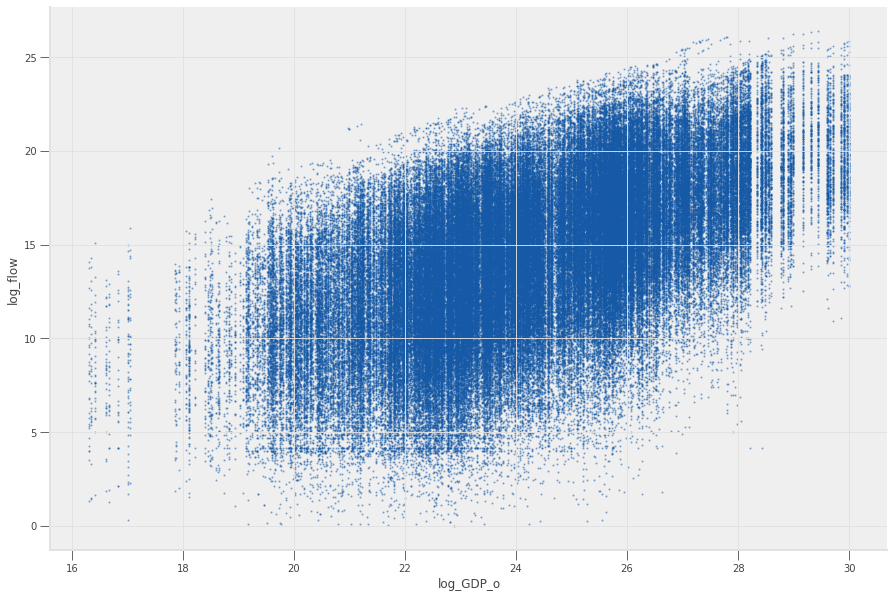

In [828]:
X = df_final_version_5.drop(["log_flow", "iso_o", "iso_d",'region_d',"year"], axis=1).copy()
for col in list(X):
    X[col] = X[col].astype(float)

# convert everything to be a float for later on
for col in list(X):
    X[col] = X[col].astype(float)



y = df_final_version_5['log_flow']
def var_scatter(df, ax=None, var="log_GDP_o"):
    if ax is None:
        _, ax = plt.subplots(figsize=(15, 10))
    df.plot.scatter(x=var , y="log_flow", alpha=0.35, s=1.5, ax=ax)

    return ax


var_scatter(df_final_version_5);


Fit model: log(flow) = -10.8105 + 1.0360 log_GDP_o
The R2 score of the linear model is 0.31319855485247206
The full model mse is 6.4102 
The R2 score of the full model is 0.6344888113693667
contiguity                   1.169724
landlocked_d                -0.659235
island_d                     0.125324
common_language              0.897848
colony_of_origin_after45     0.594258
agree_fta                    0.476895
member_wto_o                 0.644206
member_wto_d                 0.147447
polity_o                     0.018764
polity_d                    -0.002851
hostility_level_o           -0.080827
hostility_level_d            0.012910
sanction_imposition_trade    0.165399
log_GDP_o                    1.201219
log_GDP_d                    0.894970
log_distance                -1.334600
dtype: float64


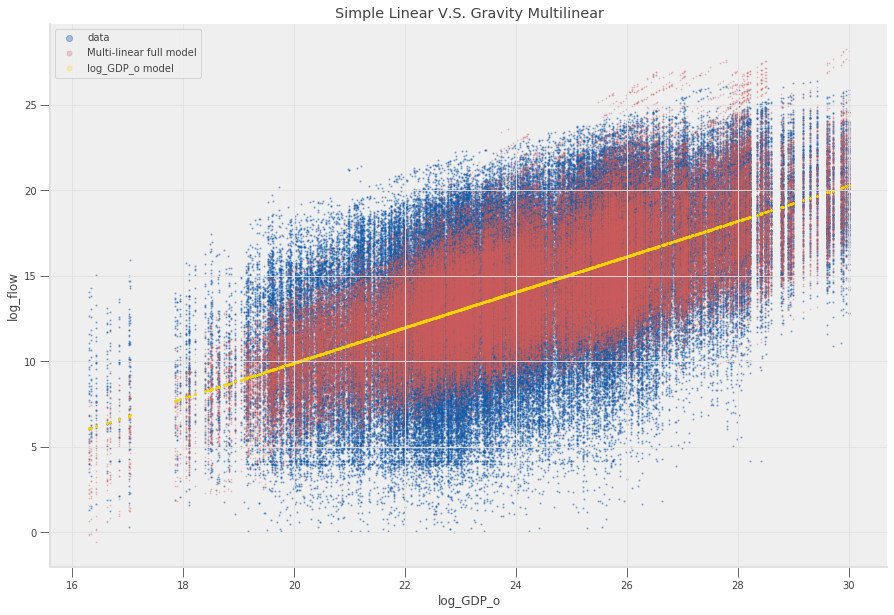

In [721]:
# import
from sklearn import linear_model

# construct the model instance
gravity_lr_model = linear_model.LinearRegression()

# fit the model
gravity_lr_model.fit(X[["log_GDP_o"]], y)

# print the coefficients
beta_g_0 = gravity_lr_model.intercept_
beta_g_1 = gravity_lr_model.coef_[0]


#####
print(f"Fit model: log(flow) = {beta_g_0:.4f} + {beta_g_1:.4f} log_GDP_o")
#the full model
lr_model = linear_model.LinearRegression()
lr_model.fit(X, y)

ax = var_scatter(df_final_version_5)

def scatter_model(mod, X, ax=None, color='red', x="log_GDP_o"):
    if ax is None:
        _, ax = plt.subplots()

    ax.scatter(X[x], mod.predict(X), c=color, alpha=0.25, s=1)
    
    
    return ax

scatter_model(lr_model, X, ax, color='indianred')
scatter_model(gravity_lr_model, X[["log_GDP_o"]], ax, color='gold')
ax.legend(["data", "Multi-linear full model", "log_GDP_o model"],markerscale = 5)

ax.set_title('Simple Linear V.S. Gravity Multilinear')



gravity_mse = metrics.mean_squared_error(y, gravity_lr_model.predict(X[["log_GDP_o"]]))
gravity_R2 = metrics.r2_score(y,gravity_lr_model.predict(X[["log_GDP_o"]]))
gravity_full_mse = metrics.mean_squared_error(y,lr_model.predict(X))
gravity_full_R2 = metrics.r2_score(y,lr_model.predict(X))
print(f"The R2 score of the linear model is {gravity_R2}")


print(f"The full model mse is {gravity_full_mse:.4f} ")
print(f"The R2 score of the full model is {gravity_full_R2}")

gravity_coefs = pd.Series(dict(zip(list(X), lr_model.coef_)))
print(gravity_coefs)

Or simply look at the summary table

In [664]:
import statsmodels.api as sm
X1 = sm.add_constant(X)
sm.OLS(y,X1).fit().summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               log_flow   R-squared:                       0.634
Model:                            OLS   Adj. R-squared:                  0.634
Method:                 Least Squares   F-statistic:                 2.114e+04
Date:                Mon, 20 Apr 2020   Prob (F-statistic):               0.00
Time:                        17:16:24   Log-Likelihood:            -4.5757e+05
No. Observations:              194884   AIC:                         9.152e+05
Df Residuals:                  194867   BIC:                         9.153e+05
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                       -26.0190      0.120   -217.421      0.000     -26.254     -25.784
contiguity                    1.1697      0.042     28.053      0.000       1.088       1.251
landlocked_d                 -0.6592      0.016    -40.305      0.000      -0.691      -0.627
island_d                      0.1253      0.016      7.787      0.000       0.094       0.157
common_language               0.8978      0.012     72.667      0.000       0.874       0.922
colony_of_origin_after45      0.5943      0.100      5.955      0.000       0.399       0.790
agree_fta                     0.4769      0.018     25.787      0.000       0.441       0.513
member_wto_o                  0.6442      0.018     35.100      0.000       0.608       0.680
member_wto_d                  0.1474      0.018      8.189      0.000       0.112       0.183
polity_o                      0.0188      0.001     17.460      0.000       0.017       0.021
polity_d                     -0.0029      0.001     -2.633      0.008      -0.005      -0.001
hostility_level_o            -0.0808      0.096     -0.845      0.398      -0.268       0.107
hostility_level_d             0.0129      0.095      0.136      0.892      -0.173       0.199
sanction_imposition_trade     0.1654      0.105      1.569      0.117      -0.041       0.372
log_GDP_o                     1.2012      0.003    435.658      0.000       1.196       1.207
log_GDP_d                     0.8950      0.003    308.677      0.000       0.889       0.901
log_distance                 -1.3346      0.009   -155.398      0.000      -1.351      -1.318
==============================================================================
Omnibus:                    14299.664   Durbin-Watson:                   0.607
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23923.475
Skew:                          -0.562   Prob(JB):                         0.00
Kurtosis:                       4.297   Cond. No.                         813.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### 7.3 Variance Inflation Factor (VIF)

In [665]:
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns
vif.round(2)

,VIF Factor,features
0,1.20,contiguity
1,1.32,landlocked_d
2,1.45,island_d
3,1.67,common_language
4,1.02,colony_of_origin_after45
5,1.49,agree_fta
6,8.86,member_wto_o
7,8.46,member_wto_d
8,1.83,polity_o
9,1.82,polity_d


In [666]:
X_vif = X.drop(['log_GDP_d','log_distance'],axis=1).copy()


lr_model_vif = linear_model.LinearRegression()
lr_model_vif.fit(X_vif, y)


gravity_vif_R2 = metrics.r2_score(y,lr_model_vif.predict(X_vif))


print(f"The R2 score is {gravity_vif_R2}")

gravity_vif_coefs = pd.Series(dict(zip(list(X), lr_model_vif.coef_)))
print(gravity_vif_coefs)

The R2 score is 0.42723639753728515
contiguity                   3.214427
landlocked_d                -1.649783
island_d                    -1.619409
common_language              0.780110
colony_of_origin_after45    -0.175894
agree_fta                    2.099707
member_wto_o                 0.287735
member_wto_d                 0.373834
polity_o                    -0.004910
polity_d                     0.060412
hostility_level_o           -0.046207
hostility_level_d            0.166451
sanction_imposition_trade    2.398556
log_GDP_o                    1.059179
dtype: float64


## 7.4 Ridge Model
Linear least squares with l2 regularization.
$$||y - Xw||^2_2 + \alpha * ||w||^2_2$$
In this case ridge only slightly differs from the linear regression as shown in the result.



In [667]:
from sklearn.linear_model import Ridge
clf = linear_model.Ridge(alpha=10)
clf.fit(X, y)
ridge_mse = metrics.mean_squared_error(y,clf.predict(X))
ridge_r2 = metrics.r2_score(y,clf.predict(X))
print(f"The ridge mse is {ridge_mse :.4f} ")
print(f"The ridge R2 score is {ridge_r2}")


ridge_coefs = pd.Series(dict(zip(list(X), clf.coef_)))
print(ridge_coefs)

The ridge mse is 6.4102 
The ridge R2 score is 0.6344887832813664
contiguity                   1.166796
landlocked_d                -0.658958
island_d                     0.125310
common_language              0.897877
colony_of_origin_after45     0.585220
agree_fta                    0.476808
member_wto_o                 0.643853
member_wto_d                 0.147402
polity_o                     0.018774
polity_d                    -0.002850
hostility_level_o           -0.079209
hostility_level_d            0.012120
sanction_imposition_trade    0.162706
log_GDP_o                    1.201236
log_GDP_d                    0.894967
log_distance                -1.334672
dtype: float64


## 7.5 Lasso Regression 
### Lasso on usual gravity
$ y = X \beta $
$$
\min_{\beta} {|| X \beta - y||_2}^2 + \underbrace{\alpha {|| \beta ||_1}}_{\text{new part}}
$$

By running Lasso Regression with the default value 1.0, most coeficients got penalized to 0, except for distance,
political status of country of origin, and bilateral GDP

In [668]:
lasso_gravity_model = linear_model.Lasso()
lasso_gravity_model.fit(X, y)

lasso_coefs = pd.Series(dict(zip(list(X), lasso_gravity_model.coef_)))
lr_coefs = pd.Series(dict(zip(list(X), lr_model.coef_)))
coefs = pd.DataFrame(dict(lasso=lasso_coefs, linreg=lr_coefs))
coefs

,lasso,linreg
contiguity,0.000000,1.169724
landlocked_d,-0.000000,-0.659235
island_d,-0.000000,0.125324
common_language,0.000000,0.897848
colony_of_origin_after45,0.000000,0.594258
agree_fta,0.000000,0.476895
member_wto_o,0.000000,0.644206
member_wto_d,0.000000,0.147447
polity_o,0.008226,0.018764
polity_d,0.000000,-0.002851


### Lasso on VIF fixed gravity, dropping log_GDP_d

In [669]:
lasso_gravity_model_vif = linear_model.Lasso()
lasso_gravity_model_vif.fit(X_vif, y)

lasso_coefs_vif = pd.Series(dict(zip(list(X_vif), lasso_gravity_model_vif.coef_)))
lr_coefs_vif = pd.Series(dict(zip(list(X_vif), lr_model_vif.coef_)))
coefs_vif = pd.DataFrame(dict(lasso_vif=lasso_coefs_vif, linreg_vif=lr_coefs_vif))
coefs_vif

,lasso_vif,linreg_vif
contiguity,0.000000,3.214427
landlocked_d,-0.000000,-1.649783
island_d,-0.000000,-1.619409
common_language,0.000000,0.780110
colony_of_origin_after45,0.000000,-0.175894
agree_fta,0.000000,2.099707
member_wto_o,0.000000,0.287735
member_wto_d,0.000000,0.373834
polity_o,0.000000,-0.004910
polity_d,0.048370,0.060412


Corss Validation for alpha, folds=5. We see the corss validation path is very similar to the train path.
Here I select the test size as 80000, roughly one third of the sample size

### Gravity Lasso Path

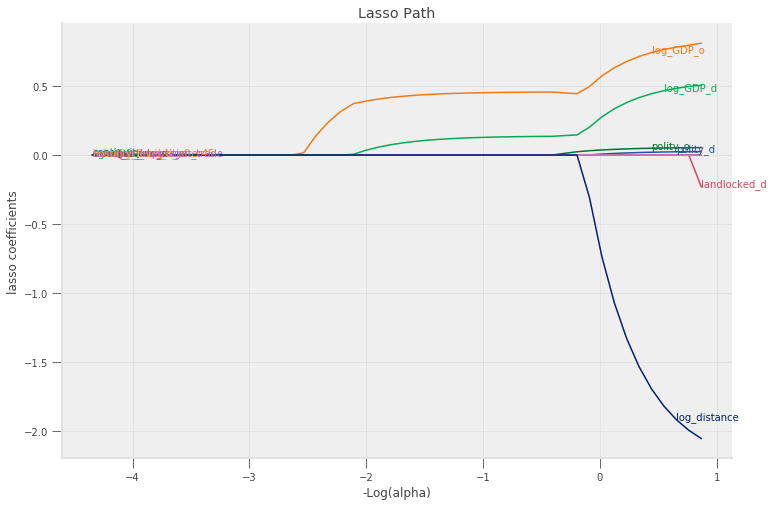

In [670]:
# Compute lasso for many alphas (the lasso path)
from itertools import cycle
alphas = np.exp(np.linspace(10, -2, 50))
alphas, coefs_lasso, _ = linear_model.lasso_path(X, y, alphas=alphas, fit_intercept=True, max_iter=10000)

# plotting
fig, ax = plt.subplots(figsize=(12, 8))
colors = cycle(qeds.themes.COLOR_CYCLE)
log_alphas = -np.log10(alphas)
for coef_l, c, name in zip(coefs_lasso, colors, list(X)):
   ax.plot(log_alphas, coef_l, c=c)
   ax.set_xlabel('-Log(alpha)')
   ax.set_ylabel('lasso coefficients')
   ax.set_title('Lasso Path')
   ax.axis('tight')
   maxabs = np.max(np.abs(coef_l))
   i = [idx for idx in range(len(coef_l)) if abs(coef_l[idx]) >= (0.9*maxabs)][0]
   xnote = log_alphas[i]
   ynote = coef_l[i]
   ax.annotate(name, (xnote, ynote), color=c)

Find the MSE minimizer lasso alpha

2.2336381795139677
the lasso alpha minimizer is 0.005839313880316532


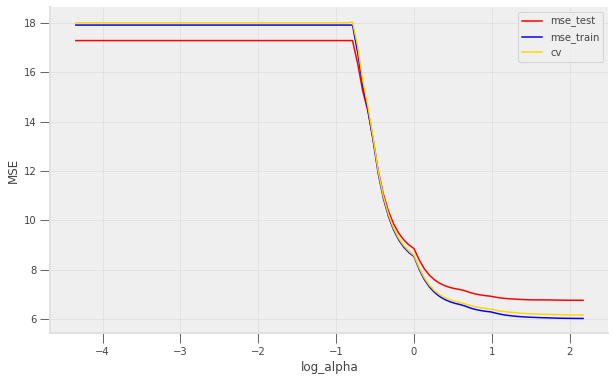

In [671]:
def fit_and_report_mses(mod, X_train, X_test, y_train, y_test):
    mod.fit(X_train, y_train)
    return dict(
        mse_train=metrics.mean_squared_error(y_train, mod.predict(X_train)),
        mse_test=metrics.mean_squared_error(y_test, mod.predict(X_test)),
        R2 = metrics.r2_score(y_test, mod.predict(X_test))
    )
# fit the train model, apply to predict
n_test = 80000
#X is a matrix 2D, y is an array
X_train = X.iloc[:n_test, :]
X_test = X.iloc[n_test:, :]
y_train = y.iloc[:n_test]
y_test = y.iloc[n_test:]

alphas = np.exp(np.linspace(10, -5, 100))
mse = pd.DataFrame([fit_and_report_mses(linear_model.Lasso(alpha=alpha, max_iter=50000),
                           X_train, X_test, y_train, y_test)
                    for alpha in alphas])    #test for different alphas, see which one is better
mse["log_alpha"] = -np.log10(alphas)
fig, ax = plt.subplots(figsize=(10,6))

mse.plot(x="log_alpha", y="mse_test", c='r', ax=ax)
mse.plot(x="log_alpha", y="mse_train", c='blue', ax=ax)
ax.set_xlabel(r"$-\log(\alpha)$")
ax.set_ylabel("MSE")

from sklearn.model_selection import cross_val_score
mse["cv"] = [-np.mean(cross_val_score(linear_model.Lasso(alpha=alpha, max_iter=50000),
                                  X_train, y_train, cv=5, scoring='neg_mean_squared_error'))
          for alpha in alphas]
mse.plot(x="log_alpha", y="cv", c='gold', ax=ax)

lasso = linear_model.LassoCV(cv=5).fit(X_train,y_train)
alpha_minimize = -np.log10(lasso.alpha_)
print(alpha_minimize)
print(f'the lasso alpha minimizer is {lasso.alpha_}')


By the minimizer alpha = 0.006. By the defualt alpha = 1, many Political related scores are penalized to 0, but It's far from ideal to analyze trade sanction policy. We could also see that lasso minimizer alpha is a really bad prediction for data, far inferior than the gravity model in the export trade flow case

## 7.6 Lasso V.S. Multilinear V.S. Ridge Table

In [672]:
lasso_alpha_model = linear_model.Lasso(alpha = 0.006)
lasso_alpha_model.fit(X, y)
lasso_alpha_coefs = pd.Series(dict(zip(list(X), lasso_alpha_model.coef_)))
coefs_new = pd.DataFrame(dict(lasso_alpha_min = lasso_alpha_coefs, lasso_alpha_default =lasso_coefs, 
                              linreg=lr_coefs,ridge = ridge_coefs))

lasso_1_R2 = metrics.r2_score(y,lasso_gravity_model.predict(X))
lasso_min_R2 = metrics.r2_score(y,lasso_alpha_model.predict(X))

lasso_1_mse = metrics.mean_squared_error(y,lasso_gravity_model.predict(X))
lasso_min_mse = metrics.mean_squared_error(y,lasso_alpha_model.predict(X))




R_sqaure = pd.Series(dict(lasso_alpha_min = lasso_min_R2 , lasso_alpha_default = lasso_1_R2,
                             gravity =gravity_full_R2, ridge_gravity = ridge_r2, single_variable = gravity_R2))
MSE = pd.Series(dict(lasso_alpha_min = lasso_min_mse , lasso_alpha_default = lasso_1_mse,
                             gravity =gravity_full_mse, ridge_gravity = ridge_mse, single_variable = gravity_mse ))

print("R square for each model is")
print(R_sqaure)
print("MSE for each model is")
print(MSE)

coefs_new

R square for each model is
lasso_alpha_min        0.634240
lasso_alpha_default    0.500732
gravity                0.634489
ridge_gravity          0.634489
single_variable        0.313199
dtype: float64
MSE for each model is
lasso_alpha_min         6.414600
lasso_alpha_default     8.756027
gravity                 6.410241
ridge_gravity           6.410241
single_variable        12.044946
dtype: float64


,lasso_alpha_min,lasso_alpha_default,linreg,ridge
contiguity,0.871726,0.000000,1.169724,1.166796
landlocked_d,-0.625962,-0.000000,-0.659235,-0.658958
island_d,0.087903,-0.000000,0.125324,0.125310
common_language,0.898684,0.000000,0.897848,0.897877
colony_of_origin_after45,0.000000,0.000000,0.594258,0.585220
agree_fta,0.437331,0.000000,0.476895,0.476808
member_wto_o,0.583790,0.000000,0.644206,0.643853
member_wto_d,0.091606,0.000000,0.147447,0.147402
polity_o,0.020058,0.008226,0.018764,0.018774
polity_d,-0.001176,0.000000,-0.002851,-0.002850


In [548]:
d = pd.concat([R_sqaure,MSE],axis = 1)
d.columns = ['R^2','MSE']
d

,R^2,MSE
lasso_alpha_min,0.635133,6.407172
lasso_alpha_default,0.500832,8.765536
gravity,0.635377,6.402887
ridge_gravity,0.635377,6.402887
single_variable,0.313830,12.049356


Now add lasso alpha 1.0 and lasso alpha 0.006 to the scatter plot

Text(0.5, 1.0, 'Simple Linear V.S. Lasso V.S. Gravity Multilinear')

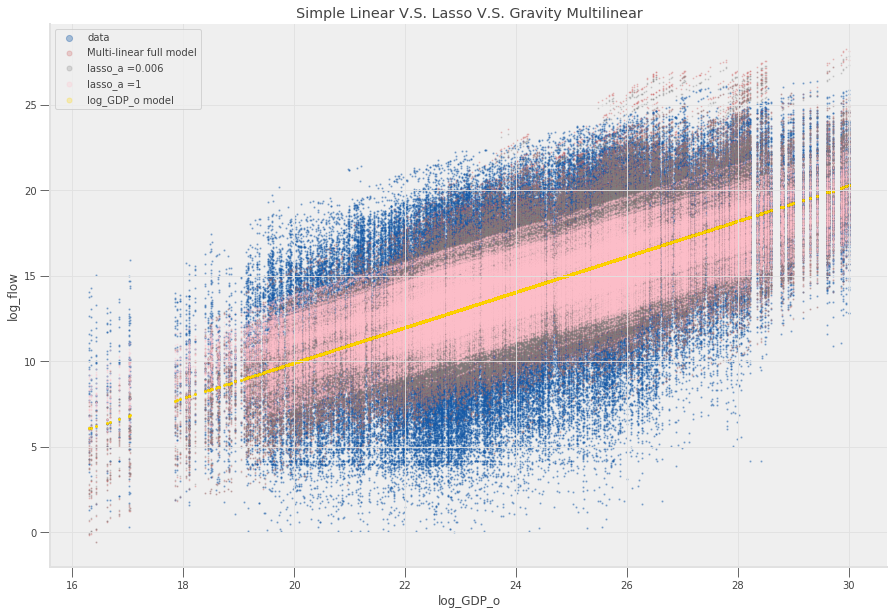

In [722]:



#the full model
lr_model = linear_model.LinearRegression()
lr_model.fit(X, y)

ax = var_scatter(df_final_version_5)



scatter_model(lr_model, X, ax, color='indianred')

scatter_model(lasso_alpha_model, X, ax, color='gray')
scatter_model(lasso_gravity_model, X, ax, color='pink')
scatter_model(gravity_lr_model, X[["log_GDP_o"]], ax, color='gold')


ax.legend(["data", "Multi-linear full model","lasso_a =0.006","lasso_a =1","log_GDP_o model"],markerscale = 5)

ax.set_title('Simple Linear V.S. Lasso V.S. Gravity Multilinear')




## 7.7 Test and Train
Use the model_selection to train, and by trail and error, I found by setting test_size = 0.25 gives the 
smaller mse for both train and test data. Both R^2 are roughly 0.63.

Again, compared to other R Squares

In [673]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.3)
fit_and_report_mses(linear_model.LinearRegression(), X_train, X_test, y_train, y_test)


{'mse_train': 6.41744198695048,
 'mse_test': 6.393686367439606,
 'R2': 0.635950972867064}

In [674]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.25)
fit_and_report_mses(linear_model.LinearRegression(), X_train, X_test, y_train, y_test)

{'mse_train': 6.417193759468607,
 'mse_test': 6.389683021606089,
 'R2': 0.634657260248257}

In [723]:
mod_train_test = linear_model.LinearRegression()
mod_train_test.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

## 7.8 Neural Networks 

$$
y = f_{\cdots} \left(f_2(f_1(X w_1 + b_1) w_2 + b_2) w_{\cdots} + b_{\cdots} \right) w_{N+1} + b_{N+1}
$$


Two Layers, 30 and 20 neurons 

In [555]:
from sklearn import neural_network

# two hidden layers, with N1=30 and N2=20
nn_model = neural_network.MLPRegressor((30, 20))
nn_model.fit(X, y)

from sklearn import preprocessing, pipeline
# X is the observation matrix
#regressors are continuous 
#observation can be binary
# the pipeline defines any number of steps that will be applied
# to transform the `X` data and then a final step that is a model
# we can use for prediction
nn_scaled_model = pipeline.make_pipeline(
    preprocessing.StandardScaler(),  
    neural_network.MLPRegressor((30, 20))  
)

# We can now use `model` like we have used our other models all along
# Call fit
nn_scaled_model.fit(X, y)

# Call predict
mse_nn_scaled = metrics.mean_squared_error(y, nn_scaled_model.predict(X))

print(f"Scaled mse {mse_nn_scaled}")



/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Scaled mse 5.351520187673711


/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [676]:
R2_nn_scaled = metrics.r2_score(y, nn_scaled_model.predict(X))
print("The R^2 score is", R2_nn_scaled)


The R^2 score is 0.6947039769866588


Three Layers, 10, 20, 10 neurons

In [677]:
nn_scaled_model_3_layer = pipeline.make_pipeline(
    preprocessing.StandardScaler(),  
    neural_network.MLPRegressor((10, 20,10))  
)

nn_scaled_model_3_layer.fit(X, y)
mse_nn_scaled_3_layer = metrics.mean_squared_error(y, nn_scaled_model_3_layer.predict(X))
R2_nn_scaled_3 = metrics.r2_score(y, nn_scaled_model_3_layer.predict(X))

print(f"Scaled mse {mse_nn_scaled_3_layer}")
print("The R^2 score is", R2_nn_scaled_3)

Scaled mse 5.467001044014516
The R^2 score is 0.6882722283413251


/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Two layers, 50, 40 neurons. 

In [829]:
nn_scaled_model_2_layer_more = pipeline.make_pipeline(
    preprocessing.StandardScaler(),  
    neural_network.MLPRegressor((50,40))  
)

nn_scaled_model_2_layer_more.fit(X, y)
mse_nn_scaled_2_layer_more = metrics.mean_squared_error(y, nn_scaled_model_2_layer_more.predict(X))
R2_nn_scaled_2_layer_more = metrics.r2_score(y, nn_scaled_model_2_layer_more.predict(X))

print(f"Scaled mse {mse_nn_scaled_2_layer_more }")
print("The R^2 score is", R2_nn_scaled_2_layer_more)

/Users/zihao/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



Scaled mse 5.082227372823879
The R^2 score is 0.7102119788823471


In [830]:
R_sqaure = pd.Series(dict(lasso_alpha_min = lasso_min_R2 , lasso_alpha_default = lasso_1_R2,
                             gravity =gravity_full_R2, ridge_gravity = ridge_r2, single_variable = gravity_R2, 
                          train_and_test_25 = 0.634657,layer_3_10_20_10 = R2_nn_scaled_3, 
                          layer_2_50_40 = R2_nn_scaled_2_layer_more))
MSE = pd.Series(dict(lasso_alpha_min = lasso_min_mse , lasso_alpha_default = lasso_1_mse,
                     train_and_test_25 = 6.389683,
                     gravity =gravity_full_mse, ridge_gravity = ridge_mse, single_variable = gravity_mse,
                     
                    layer_3_10_20_10 = mse_nn_scaled_3_layer , layer_2_50_40 = mse_nn_scaled_2_layer_more ))
r2_mse = pd.concat([R_sqaure,MSE],axis = 1)
r2_mse.columns = ['R^2','MSE']
r2_mse




,R^2,MSE
lasso_alpha_min,0.634240,6.414600
lasso_alpha_default,0.500732,8.756027
gravity,0.634489,6.410241
ridge_gravity,0.634489,6.410241
single_variable,0.313199,12.044946
train_and_test_25,0.634657,6.389683
layer_3_10_20_10,0.688272,5.467001
layer_2_50_40,0.710212,5.082227


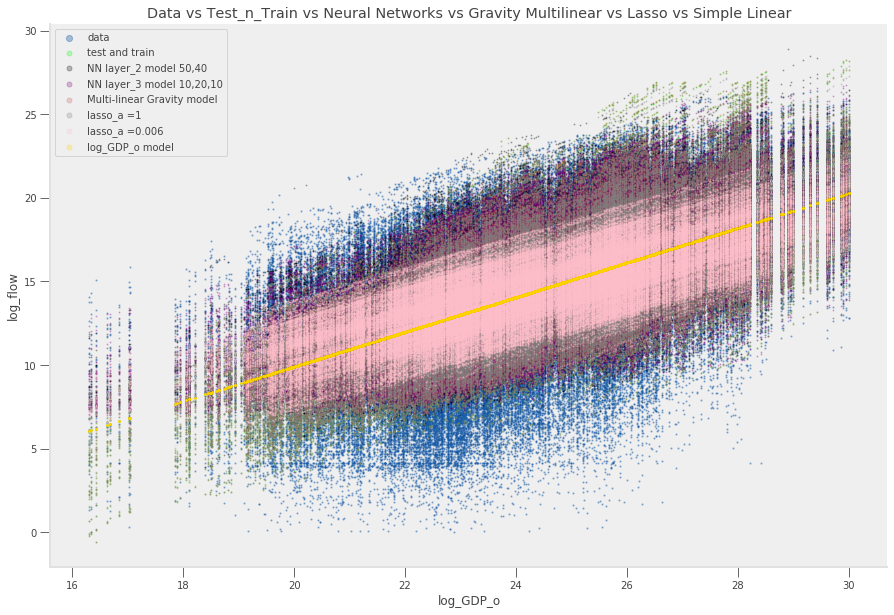

In [832]:
ax = var_scatter(df_final_version_5)

scatter_model(mod_train_test, X, ax, color='lime')
scatter_model(nn_scaled_model_2_layer_more, X, ax, color='black')
scatter_model(nn_scaled_model_3_layer, X, ax, color='purple')
scatter_model(lr_model, X, ax, color='indianred')
scatter_model(lasso_alpha_model, X, ax, color='gray')
scatter_model(lasso_gravity_model, X, ax, color='pink')

scatter_model(gravity_lr_model, X[["log_GDP_o"]], ax, color='gold')


ax.legend(["data",'test and train','NN layer_2 model 50,40','NN layer_3 model 10,20,10', "Multi-linear Gravity model", 
           "lasso_a =1","lasso_a =0.006","log_GDP_o model"],markerscale = 5)


ax.set_title('Data vs Test_n_Train vs Neural Networks vs Gravity Multilinear vs Lasso vs Simple Linear')
ax.grid(False)


## 7.8 Political Score

(<Figure size 864x576 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1d32777510>)

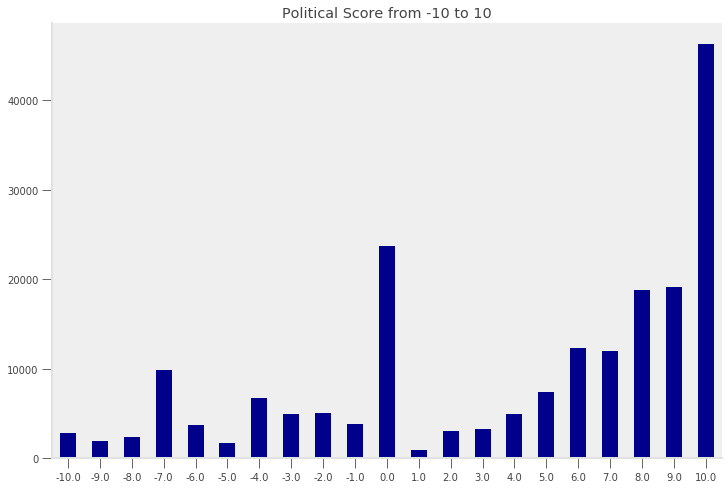

In [726]:
def create_groupcount_barplot(df, group_col, figsize, **kwargs):
    "call df.groupby(group_col), then count number of records and plot"
    counts = df.groupby(group_col)["iso_d"].count().sort_index()

    fig, ax = plt.subplots(figsize=figsize)
    counts.plot(kind="bar", **kwargs)

    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_title('Political Score from -10 to 10')
    ax.grid(False)

    return fig, ax


create_groupcount_barplot(df_final_version_5, "polity_d", (12, 8), color="DarkBlue", rot=0)

What is the political score of China and the U.S.?

In [727]:
print(df_final_version_5.set_index('iso_d').loc['CHN']['polity_d'])
print(df_final_version_5.set_index('iso_d').loc['USA']['polity_d'])

iso_d
CHN   -7.0
CHN   -7.0
CHN   -7.0
CHN   -7.0
CHN   -7.0
      ... 
CHN   -7.0
CHN   -7.0
CHN   -7.0
CHN   -7.0
CHN   -7.0
Name: polity_d, Length: 1609, dtype: float64
iso_d
USA    10.0
USA    10.0
USA    10.0
USA    10.0
USA    10.0
       ... 
USA    10.0
USA    10.0
USA    10.0
USA    10.0
USA    10.0
Name: polity_d, Length: 1612, dtype: float64


Which country was set as -10? Qatar, Saudi and Bahrain ( quite surprising )

In [728]:
a = df_final_version_5.set_index('polity_d').loc[-10]['iso_d'].tolist()

minus_10 = []
for i in a :
    if i not in minus_10:
        minus_10.append(i)
minus_10
    

['QAT', 'SAU', 'BHR']

How does the political score differs by continent. From the plot below, most negative score come from middle east, central asia and euro asia. And China is the only negative score country in east asia

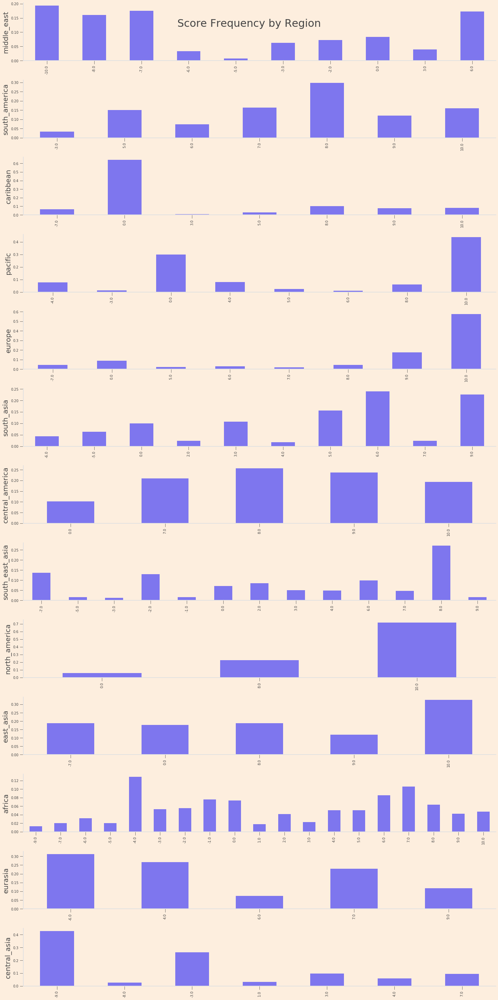

In [733]:
# create a region list
b = df_final_version_5['region_d'].tolist()
region_list = []
for i in b :
    if i not in region_list:
        region_list.append(i)
#then plot
region_count = df_final_version_5.groupby(["region_d"])["iso_d"].count()
dfgb = df_final_version_5.groupby("region_d")
region = df_final_version_5.groupby("region_d")["iso_d"].count()


fig, ax = plt.subplots(len(region_list), figsize=(20, 40))

for (i, region) in enumerate(region_list):
    (
        (dfgb
            .get_group(region)
            .groupby("polity_d")["iso_d"].count() / region_count[region] # percentage
        )
        .plot(kind="bar", ax=ax[i], color="blue", alpha = 0.5)
    )
    ax[i].set_ylabel(region,fontsize=20)
    ax[i].set_xlabel("")
    ax[i].set_facecolor(background_1)
    ax[i].grid(False)
    # set equal y limit for visual comparison
   
fig.set_facecolor(background_1) 

fig.suptitle("Score Frequency by Region", size = 30)
fig.tight_layout()

And How does the political affects export percentage of GDP? 

Text(0.5, 1, ' log_flow againt  polity_o')

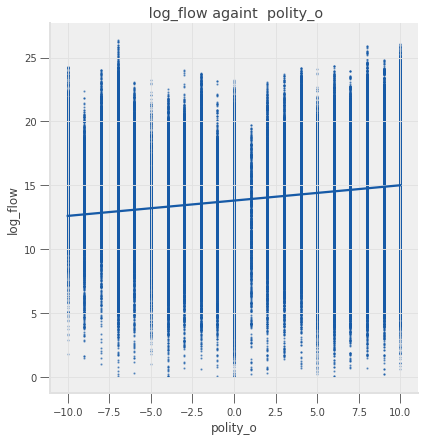

In [734]:


sns.lmplot(
    data=df_final_version_5, x="polity_o", y="log_flow", height=6,
    scatter_kws=dict(s=1.5, alpha=0.5)
);

plt.title(' log_flow againt  polity_o')




## 7.9 Hostility Level
Hostility_d varibale is coded 1–5 and denotes the level of hostility of country_d towards country_o in year t. We see most countries were not assigned to be in this score. After cleaning the data that drop the 0 value, only 263 rows left
The defition of each level of hosility score is (given by USITC dynamic gravity dataset https://www.usitc.gov/data/gravity/html_documentation/dynamic_gravity_technical_documentation_v1_00.html#x1-480007.1)

1	-	no militarized action taken

2	-	some form of threat made

3	-	some show of force or alert of force

4	-	some use of more substantial force

5	-	complete war

(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1dcde6a250>)

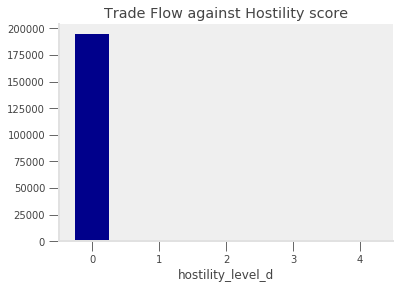

In [736]:
def create_groupcount_barplot(df, group_col, figsize, **kwargs):
    "call df.groupby(group_col), then count number of records and plot"
    counts = df.groupby(group_col)["iso_d"].count().sort_index()

    fig, ax = plt.subplots(figsize=figsize)
    counts.plot(kind="bar", **kwargs)

    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    
    ax.set_title('Trade Flow against Hostility score')
    ax.grid(False)

    return fig, ax


create_groupcount_barplot(df_final_version_5, "hostility_level_d", (6, 4), color="DarkBlue", rot=0)

Since there're too many zeros, what if it's conditional on a score has alreaby been assigned?

(<Figure size 432x288 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1dce54c510>)

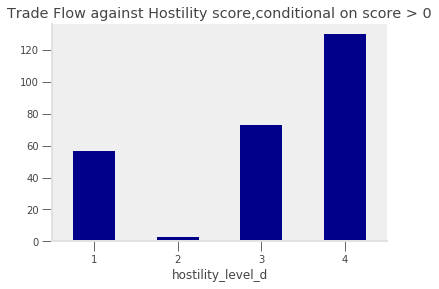

In [737]:
df_hostility = df_final_version_5.set_index("hostility_level_d").drop(0).reset_index()
def create_groupcount_barplot_c(df, group_col, figsize, **kwargs):
    "call df.groupby(group_col), then count number of records and plot"
    counts = df.groupby(group_col)["iso_d"].count().sort_index()

    fig, ax = plt.subplots(figsize=figsize)
    counts.plot(kind="bar", **kwargs)

    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    
    ax.set_title('Trade Flow against Hostility score,conditional on score > 0')
    ax.grid(False)

    return fig, ax

create_groupcount_barplot_c(df_hostility, "hostility_level_d", (6, 4), color="DarkBlue", rot=0)

Text(0.5, 1, 'log_flow agains hostility conditional on score has been assgined')

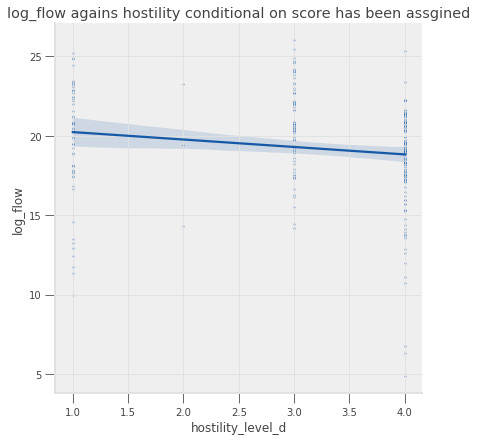

In [738]:
sns.lmplot(
    data=df_hostility, x="hostility_level_d", y="log_flow", height=6,
    scatter_kws=dict(s=1.5, alpha=0.5)
);
plt.title('log_flow agains hostility conditional on score has been assgined')

## 7.10 Classification
### Trade sanction imposition possibility on hostility level and political score
####  Decision Boundaries
From the process below, we can see the sanction on trade decision is not dependent on other classifications. So it may not cause multi-collinearity issue. The contour plot map is a visualization of the VIF result on 7.3 and 7.4

The correlation table between trade_sanction, hostility_level_o, hostility_level_d, polity_o,polity_d 

In [739]:
df_final_version_5[["sanction_imposition_trade","hostility_level_o", "hostility_level_d",'polity_o','polity_d']].corr()

,sanction_imposition_trade,hostility_level_o,hostility_level_d,polity_o,polity_d
sanction_imposition_trade,1.000000,0.053208,0.052771,0.011827,0.011438
hostility_level_o,0.053208,1.000000,0.863372,-0.005700,-0.007234
hostility_level_d,0.052771,0.863372,1.000000,-0.006295,-0.007205
polity_o,0.011827,-0.005700,-0.006295,1.000000,-0.049693
polity_d,0.011438,-0.007234,-0.007205,-0.049693,1.000000


Fit model: p(sanction_imposition_trade) = L(-5.8408 + 0.2252 hostility_level_o + 0.7849 hostility_level_o)


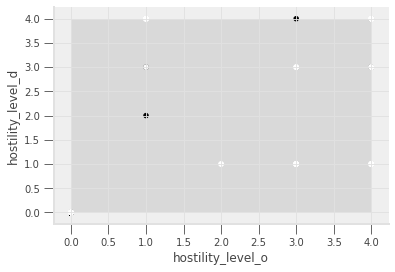

In [740]:
y = df_final_version_5["sanction_imposition_trade"]
X = df_final_version_5[["hostility_level_o", "hostility_level_d"]]
X_train, X_test, y_train, y_test = model_selection.train_test_split(
    X, y, test_size=0.25,
)




def plot_contours(ax, mod, xx, yy, **params):
    """
    Plot the decision boundaries for a classifier with 2 features x and y.

    Parameters
    ----------
    ax: matplotlib axes object
    mod: a classifier
    xx: meshgrid ndarray
    yy: meshgrid ndarray
    params: dictionary of params to pass to contourf, optional
    """
    Z = mod.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out

def fit_and_plot_decision_boundary(mod, X, y, **params):
    # fit model
    mod.fit(X, y)

    # generate grids of first two columns of X
    def gen_grid(xseries):
        if xseries.nunique() < 6:
            return sorted(xseries.unique())
        else:
            return np.linspace(xseries.min(), xseries.max(), 6)

    x1, x2 = np.meshgrid(gen_grid(X.iloc[:, 0]), gen_grid(X.iloc[:, 1]))

    # plot contours and scatter
    fig, ax = plt.subplots()
    plot_contours(ax, mod, x1, x2, **params)
    x1_name, x2_name = list(X)[:2]
    X.plot.scatter(x=x1_name, y=x2_name, color=y, ax=ax)
    ax.set_xlabel(x1_name)
    ax.set_ylabel(x2_name)

    return ax



logistic_age_model = linear_model.LogisticRegression(solver="lbfgs")
logistic_age_model.fit(X_train, y_train)

beta_0 = logistic_age_model.intercept_[0]
beta_1, beta_2 = logistic_age_model.coef_[0]

print(f"Fit model: p(sanction_imposition_trade) = L({beta_0:.4f} + {beta_1:.4f} hostility_level_o + {beta_2:.4f} hostility_level_o)")

fit_and_plot_decision_boundary(
    linear_model.LogisticRegression(solver="lbfgs"),
    X_train, y_train, cmap=plt.cm.Greys
)



# 8. Model Estimation by USITC GME Package


The package was created by the Gravity Modeling Group at the United States International Trade Commission.
https://www.usitc.gov/data/gravity/gme_docs/about/
I noticed this package at the end of finishing the project. This package facilitates the estimation procedure for fixed effects and specific country's estimation
I've not fully learned the GME package. Here's a simple example that is much similer to the GME instruction that estimates the small gravity dataset, for which I also created a summary table.

Implementing the merged CEPII and USITC dataset by GME

In [330]:
gme_data = gme.EstimationData(data_frame = df_final_version_5,
                              imp_var_name = 'iso_o',
                              exp_var_name = 'iso_d',
                              trade_var_name = 'log_flow',
                              year_var_name = 'year')
print(gme_data)

number of countries: 194 
number of exporters: 194 
number of importers: 193 
number of years: 10 
number of sectors: not_applicable 
dimensions: (214776, 21)



In [12]:
gme_model.estimate()

select specification variables: ['log_distance', 'agree_pta', 'common_language', 'contiguity', 'trade_value', 'importer', 'exporter', 'year'], Observations excluded by user: {'rows': 0, 'columns': 0}
drop_intratrade: no, Observations excluded by user: {'rows': 0, 'columns': 0}
drop_imp: none, Observations excluded by user: {'rows': 0, 'columns': 0}
drop_exp: none, Observations excluded by user: {'rows': 0, 'columns': 0}
keep_imp: all available, Observations excluded by user: {'rows': 0, 'columns': 0}
keep_exp: all available, Observations excluded by user: {'rows': 0, 'columns': 0}
drop_years: none, Observations excluded by user: {'rows': 0, 'columns': 0}
keep_years: [1989], Observations excluded by user: {'rows': 95190, 'columns': 0}
drop_missing: yes, Observations excluded by user: {'rows': 116, 'columns': 0}
Estimation began at 05:40 PM  on Apr 18, 2020
Omitted Columns: ['importer_fe_ARG', 'importer_fe_AUT', 'importer_fe_BOL', 'importer_fe_CHL', 'importer_fe_CHN', 'importer_fe_COL', 

{'all': <gme.estimate.SlimResults.SlimResults at 0x1a1d1a4710>}

In [332]:
fixed_effects_model_2  = gme.EstimationModel(estimation_data = gme_data,
                                                 lhs_var = 'log_flow',
                                                 rhs_var = (['log_GDP_o','log_GDP_d','log_distance',
                                                                'contiguity','landlocked_d','island_d','common_language','colony_of_origin_after45',
                                                                'agree_fta','member_wto_o','member_wto_d','polity_o','polity_d',
                                                                 'hostility_level_o','hostility_level_d','sanction_imposition_trade']),
                                                 fixed_effects = ['iso_d', 'iso_o'],
                                                 
                                                 keep_years = [2014])

# Conduct a PPML estimation of the fixed effects model.
estimates = fixed_effects_model_2.estimate()

select specification variables: ['log_GDP_o', 'log_GDP_d', 'log_distance', 'contiguity', 'landlocked_d', 'island_d', 'common_language', 'colony_of_origin_after45', 'agree_fta', 'member_wto_o', 'member_wto_d', 'polity_o', 'polity_d', 'hostility_level_o', 'hostility_level_d', 'sanction_imposition_trade', 'log_flow', 'iso_o', 'iso_d', 'year'], Observations excluded by user: {'rows': 0, 'columns': 1}
drop_intratrade: no, Observations excluded by user: {'rows': 0, 'columns': 0}
drop_imp: none, Observations excluded by user: {'rows': 0, 'columns': 0}
drop_exp: none, Observations excluded by user: {'rows': 0, 'columns': 0}
keep_imp: all available, Observations excluded by user: {'rows': 0, 'columns': 0}
keep_exp: all available, Observations excluded by user: {'rows': 0, 'columns': 0}
drop_years: none, Observations excluded by user: {'rows': 0, 'columns': 0}
keep_years: [2014], Observations excluded by user: {'rows': 194884, 'columns': 0}
drop_missing: yes, Observations excluded by user: {'row

In [333]:
fixed_effects_model_2.format_regression_table(format = "txt")

,Variable,all
a_agree_fta,agree_fta,0.019***
a_agree_fta_se,,(0.003)
a_colony_of_origin_after45,colony_of_origin_after45,0.061***
a_colony_of_origin_after45_se,,(0.012)
a_common_language,common_language,0.060***
...,...,...
a_polity_o_se,,(2.323)
b_aic,AIC,93529.945
b_bic,BIC,-175316.579
b_llf,Likelihood,-46425.972


In [334]:
results = estimates['all']
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:               log_flow   No. Iterations:                      4
Model:                            GLM   Df Residuals:                    18595
Model Family:                 Poisson   Df Model:                          338
Link Function:                    log   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -46426.
Covariance Type:                  HC1   Deviance:                       7820.3
No. Observations:               18934   Pearson chi2:                 7.35e+03
============================================================================================
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
log_GDP_o                   -2.3455      2.988     -0.785      0.432      -8.202       3.511
log_GDP_d                    0.0680      0.003     22.698      0.000       0.062       0.074
log_distance                -0.1078      0.002    -49.488      0.000      -0.112      -0.104
contiguity                   0.0103      0.008      1.236      0.216      -0.006       0.027
landlocked_d                40.9660     50.652      0.809      0.419     -58.317     140.249
island_d                     0.0011      0.030      0.037      0.970      -0.058       0.060
common_language              0.0597      0.003     18.578      0.000       0.053       0.066
colony_of_origin_after45     0.0610      0.012      4.917      0.000       0.037       0.085
agree_fta                    0.0185      0.003      5.351      0.000       0.012       0.025
member_wto_o                 7.4399      9.139      0.814      0.416     -10.473      25.353
member_wto_d                41.0893     50.652      0.811      0.417     -58.194     140.373
polity_o                    -1.9071      2.323     -0.821      0.412      -6.461       2.647
polity_d                    -0.0038      0.001     -3.698      0.000      -0.006      -0.002
iso_d_fe_AFG                 0.0855      0.026      3.328      0.001       0.035       0.136
iso_d_fe_ALB                -0.0431      0.022     -1.919      0.055      -0.087       0.001
iso_d_fe_ARE                -0.0296      0.017     -1.774      0.076      -0.062       0.003
iso_d_fe_ARG                -0.1136      0.018     -6.318      0.000      -0.149      -0.078
iso_d_fe_ARM               -41.0070     50.652     -0.810      0.418    -140.290      58.276
iso_d_fe_ATG                 0.0437      0.029      1.530      0.126      -0.012       0.100
iso_d_fe_AUS                 0.0265      0.030      0.889      0.374      -0.032       0.085
iso_d_fe_AUT               -41.0841     50.653     -0.811      0.417    -140.368      58.200
iso_d_fe_AZE                40.9292     50.652      0.808      0.419     -58.354     140.212
iso_d_fe_BDI               -41.0643     50.652     -0.811      0.418    -140.348      58.219
iso_d_fe_BEL                 0.0450      0.016      2.889      0.004       0.014       0.075
iso_d_fe_BEN                -0.0198      0.025     -0.803      0.422      -0.068       0.029
iso_d_fe_BFA               -41.0219     50.652     -0.810      0.418    -140.305      58.261
iso_d_fe_BGD                -0.0001      0.017     -0.007      0.995      -0.033       0.033
iso_d_fe_BGR                -0.0166      0.020     -0.842      0.400      -0.055       0.022
iso_d_fe_BHR                -0.1098      0.031     -3.539      0.000      -0.171      -0.049
iso_d_fe_BHS                41.0948     50.652      0.811      0.417     -58.188     140.378
iso_d_fe_BIH                40.9759     50.652      0.809      0.419     -58.307     140.259
iso_d_fe_BLR                 0.0362      0.021      1.760      0.078      -0.00

# 9. Prediciton on Bilateral Trade Flow
### Simple Tariff Data

In [853]:
china_21_tariff_change = (np.exp(logt_china_21) - china_export_2018)/china_export_2018
us_21_tariff_change = (np.exp(logt_us_21) - usa_export_2018)/usa_export_2018

tariff_21 = pd.Series(dict(China_exports_relative_change = china_21_tariff_change, 
               US_exports_relative_change = us_21_tariff_change))

tariff_21


China_exports_relative_change   -0.999720
US_exports_relative_change      -0.913481
dtype: float64

### Gravity Database Political Variables 

Firstly Create the list for 2019 China and the U.S. data. Due to the reason that the databse has a selected base year value, here I'm applying the GDP growth rate on 2013 data, since the original data source in 2014 might not be the full year annual data.
The data source is from the World Bank Open Data https://data.worldbank.org

In [741]:
china_gdp_2018 = 6.070769e+12 *(1+0.07769)* (1+0.06905) *(1+0.06737) * (1+0.06757)*(1+0.06567)
usa_gdp_2018 = 1.072587e+13 * (1+0.02452)* (1+0.02811)* (1+0.01567) * (1+ 0.02217)* (1+ 0.02927)
9.401673e+10
china_export_2018 = 2.836604e+11*(468474.9/440430.0)*(483201.7/468474.9)*(462420.0/483201.7)*(505220.2/462420.0)*(539675.6/505220.2)
usa_export_2018 =   9.401673e+10*(123657.2/121746.2)*(115873.4/123657.2)*(115594.8/115873.4)*(129797.6/115594.8)*(120148.1/129797.6)

np.log(usa_gdp_2018)

30.12195219656553

In [837]:
X_china_2018 = [0,0,0,0,0,0,1,1,-7,10,0,0,0,np.log(china_gdp_2018),np.log(usa_gdp_2018),9.346115]
X_usa_2018 = [0,0,0,0,0,0,1,1,10,-7,0,0,0,np.log(usa_gdp_2018),np.log(china_gdp_2018),9.346115]
X_predict = [X_china_2018,X_usa_2018]
X_flow_2018 = [np.log(china_export_2018),np.log(usa_export_2018)]

linear_gravity_pre = lr_model.predict(X_predict)
ridge_gravity_pre = clf.predict(X_predict)
lasso_min_pre = lasso_alpha_model.predict(X_predict)
lasso_default_pre = lasso_gravity_model.predict(X_predict)
train_n_test_pre = mod_train_test.predict(X_predict)
neural_2_layer_pre = nn_scaled_model_2_layer_more.predict(X_predict)
neural_3_layer_pre = nn_scaled_model_3_layer.predict(X_predict)

Prediction = pd.Series(dict(gravity_model = linear_gravity_pre , ridge_gravity= ridge_gravity_pre,
                             lasso_min_alpha =lasso_min_pre , lasso_default_alpha = lasso_default_pre, 
                          train_n_test = train_n_test_pre, 
                          neural_2_layer = neural_2_layer_pre,neural_3_layer = neural_3_layer_pre))

Prediction
X_flow_2018

[26.574260280831858, 25.253525180617917]

In [743]:
X_flow_2018

[26.574260280831858, 25.253525180617917]

In [625]:
p = df_final_version_5.set_index('iso_o').loc['USA']
p.loc[p['iso_d'] == 'CHN']

,year,iso_d,region_d,contiguity,landlocked_d,island_d,common_language,colony_of_origin_after45,agree_fta,member_wto_o,member_wto_d,polity_o,polity_d,hostility_level_o,hostility_level_d,sanction_imposition_trade,log_flow,log_GDP_o,log_GDP_d,log_distance
iso_o,,,,,,,,,,,,,,,,,,,,
USA,2005,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,1.0,24.017134,29.605314,27.852343,9.346115
USA,2006,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,1.0,24.196566,29.649982,28.025494,9.346115
USA,2007,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,1.0,24.278124,29.610023,28.196758,9.346115
USA,2008,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,1.0,24.517729,29.711264,28.539131,9.346115
USA,2009,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,3,3,1.0,24.633760,29.856256,28.808979,9.346115
USA,2010,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,1.0,24.912704,29.901562,28.994236,9.346115
USA,2011,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,0.0,25.032387,29.901638,29.173536,9.346115
USA,2012,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,0.0,25.123058,29.956545,29.309351,9.346115
USA,2013,CHN,east_asia,0,0,0,0,0,0,1,1,10.0,-7.0,0,0,0.0,25.266739,30.003679,29.434505,9.346115


We could see that in the USITC dataset the hostility level was 3 for both countries in 2009, and we'll use 2,3 and for for simulation, and also add trade sanction to 1 for both countries as well.

In [838]:
X_china_2018_2 = [0,0,0,0,0,0,1,1,-7,10,2,2,1,np.log(china_gdp_2018),np.log(usa_gdp_2018),9.346115]
X_usa_2018_2 = [0,0,0,0,0,0,1,1,10,-7,2,2,1,np.log(usa_gdp_2018),np.log(china_gdp_2018),9.346115]


X_predict_2 = [X_china_2018_2,X_usa_2018_2]
X_flow_2018 = [np.log(china_export_2018),np.log(usa_export_2018)]

linear_gravity_pre_2 = lr_model.predict(X_predict_2)
ridge_gravity_pre_2 = clf.predict(X_predict_2)
lasso_min_pre_2 = lasso_alpha_model.predict(X_predict_2)
lasso_default_pre_2 = lasso_gravity_model.predict(X_predict_2)
train_n_test_pre_2 = mod_train_test.predict(X_predict_2)
neural_2_layer_pre_2 = nn_scaled_model_2_layer_more.predict(X_predict_2)
neural_3_layer_pre_2 = nn_scaled_model_3_layer.predict(X_predict_2)

Prediction_2 = pd.Series(dict(gravity_model = linear_gravity_pre_2 , ridge_gravity= ridge_gravity_pre_2,
                             lasso_min_alpha =lasso_min_pre_2 , lasso_default_alpha = lasso_default_pre_2, 
                          train_n_test = train_n_test_pre_2, 
                          neural_2_layer = neural_2_layer_pre_2,
                              neural_3_layer = neural_3_layer_pre_2))
Relative_Change = pd.Series(dict(gravity_model = (np.exp(linear_gravity_pre_2) -np.exp(X_flow_2018))/np.exp(X_flow_2018) , 
                                 ridge_gravity=  (np.exp(ridge_gravity_pre_2)-np.exp(X_flow_2018))/np.exp(X_flow_2018),
                             lasso_min_alpha = (np.exp(lasso_min_pre_2)-np.exp(X_flow_2018))/np.exp(X_flow_2018) , 
                                 lasso_default_alpha = (np.exp(lasso_default_pre_2)-np.exp(X_flow_2018))/np.exp(X_flow_2018), 
                          train_n_test = (np.exp(train_n_test_pre_2)-np.exp(X_flow_2018))/np.exp(X_flow_2018), 
                          neural_2_layer =(np.exp(neural_2_layer_pre_2)-np.exp(X_flow_2018))/np.exp(X_flow_2018),
                                 neural_3_layer = (np.exp(neural_3_layer_pre_2)-np.exp(X_flow_2018))/np.exp(X_flow_2018)))


In [839]:
df_2 = pd.DataFrame.from_dict(Prediction_2)
df_2['China log_exports'], df_2['U.S. log_exports'] = zip(*df_2.pop(0))
df_2_relative = pd.DataFrame.from_dict(Relative_Change)
df_2_relative['China exports percentage change'], df_2_relative['U.S. exports percentage change'] = zip(*df_2_relative.pop(0))
h_score_2 = pd.merge(df_2, df_2_relative,how='outer', left_index=True, right_index=True).round(2)
h_score_2



,China log_exports,U.S. log_exports,China exports percentage change,U.S. exports percentage change
gravity_model,24.89,25.36,-0.81,0.12
ridge_gravity,24.89,25.36,-0.82,0.11
lasso_min_alpha,24.85,25.31,-0.82,0.06
lasso_default_alpha,23.18,23.43,-0.97,-0.84
train_n_test,24.78,25.25,-0.83,-0.00
neural_2_layer,23.47,23.25,-0.96,-0.86
neural_3_layer,25.91,25.46,-0.49,0.23


In [785]:
X_flow_2018

[26.574260280831858, 25.253525180617917]

Assigning Trade sanction to 1 and hostility level 3 for the U.S. and China.

In [840]:
X_china_2018_3 = [0,0,0,0,0,0,1,1,-7,10,3,3,1,np.log(china_gdp_2018),np.log(usa_gdp_2018),9.346115]
X_usa_2018_3 = [0,0,0,0,0,0,1,1,10,-7,3,3,1,np.log(usa_gdp_2018),np.log(china_gdp_2018),9.346115]


X_predict_3 = [X_china_2018_3,X_usa_2018_3]
X_flow_2018 = [np.log(china_export_2018),np.log(usa_export_2018)]

linear_gravity_pre_3 = lr_model.predict(X_predict_3)
ridge_gravity_pre_3 = clf.predict(X_predict_3)
lasso_min_pre_3 = lasso_alpha_model.predict(X_predict_3)
lasso_default_pre_3 = lasso_gravity_model.predict(X_predict_3)
train_n_test_pre_3 = mod_train_test.predict(X_predict_3)
neural_2_layer_pre_3 = nn_scaled_model_2_layer_more.predict(X_predict_3)
neural_3_layer_pre_3 = nn_scaled_model_3_layer.predict(X_predict_3)
Prediction_3 = pd.Series(dict(gravity_model = linear_gravity_pre_3, 
                              ridge_gravity= ridge_gravity_pre_3,
                             lasso_min_alpha =lasso_min_pre_3, 
                              lasso_default_alpha = lasso_default_pre_3, 
                          train_n_test = train_n_test_pre_3, 
                          neural_2_layer = neural_2_layer_pre_3,
                              neural_3_layer = neural_3_layer_pre_3))

Relative_change_3 = pd.Series(dict(gravity_model = (np.exp(linear_gravity_pre_3) -np.exp(X_flow_2018))/np.exp(X_flow_2018) , 
                                 ridge_gravity=  (np.exp(ridge_gravity_pre_3)-np.exp(X_flow_2018))/np.exp(X_flow_2018),
                             lasso_min_alpha = (np.exp(lasso_min_pre_3)-np.exp(X_flow_2018))/np.exp(X_flow_2018) , 
                                 lasso_default_alpha = (np.exp(lasso_default_pre_3)-np.exp(X_flow_2018))/np.exp(X_flow_2018), 
                          train_n_test = (np.exp(train_n_test_pre_3)-np.exp(X_flow_2018))/np.exp(X_flow_2018), 
                          neural_2_layer =(np.exp(neural_2_layer_pre_3)-np.exp(X_flow_2018))/np.exp(X_flow_2018),
                                 neural_3_layer = (np.exp(neural_3_layer_pre_3)-np.exp(X_flow_2018))/np.exp(X_flow_2018)))



In [841]:
df_3 = pd.DataFrame.from_dict(Prediction_3)
df_3['China log_exports'], df_3['U.S. log_exports'] = zip(*df_3.pop(0))
df_3_relative = pd.DataFrame.from_dict(Relative_change_3)
df_3_relative['China exports percentage change'], df_3_relative['U.S. exports percentage change'] = zip(*df_3_relative.pop(0))
h_score_3 = pd.merge(df_3, df_3_relative,how='outer', left_index=True, right_index=True).round(2)
h_score_3

,China log_exports,U.S. log_exports,China exports percentage change,U.S. exports percentage change
gravity_model,24.82,25.30,-0.83,0.04
ridge_gravity,24.82,25.30,-0.83,0.04
lasso_min_alpha,24.85,25.31,-0.82,0.06
lasso_default_alpha,23.18,23.43,-0.97,-0.84
train_n_test,24.68,25.15,-0.85,-0.10
neural_2_layer,23.73,25.12,-0.94,-0.12
neural_3_layer,25.62,25.08,-0.61,-0.16


# 10. Conclusion 

Comparing the OLS Gravity model, Ridge Gravity model ($\alpha$=10), coefficients are rather similar though a regularization is given. Then by the Lasso path $\alpha$ is set to be 0.006 to minimize the mean square error, which implies that the Gravity model in this original expression was not overfitting per se. To the contrary, neural network model by setting 2 layers, 3 layers, or training 25% or 30% of the model could not improve the r square nor decrease mse significantly. Political indicators, by setting 0.1 as the threshold, political indicators are statitically significant, and do not create much multicolinearity issue. Therefore, I let the hostility level and trade sanction vary to predict the U.S.-China trade flow. 

As the result, China's exports reduces more than that of the U.S. in all scenarios and regresssion or learning methods presneted in this project. U.S. exports to China growth rate do not witness a dramatic fluctuation might be due to the fact that the GDP growth offsets the reduction in trade value.

#### If the bilateral aggregate tariff escalates to 21% 

In [854]:
tariff_21

China_exports_relative_change   -0.999720
US_exports_relative_change      -0.913481
dtype: float64

#### Ranking of R Sqaure Ranking of Mean Square Error and summary Table

In [842]:
h_score_2.columns = pd.MultiIndex.from_product([['hostility_score_2, with trade sanction'], h_score_2.columns])
h_score_3.columns = pd.MultiIndex.from_product([['hostility_score_3, with trade sanction'], h_score_3.columns])
pd.concat([h_score_2, h_score_3], axis = 1)

hostility_score_2, with trade sanction                   \
                                         China log_exports U.S. log_exports   
gravity_model                                        24.89            25.36   
ridge_gravity                                        24.89            25.36   
lasso_min_alpha                                      24.85            25.31   
lasso_default_alpha                                  23.18            23.43   
train_n_test                                         24.78            25.25   
neural_2_layer                                       23.47            23.25   
neural_3_layer                                       25.91            25.46   

                                                     \
                    China exports percentage change   
gravity_model                                 -0.81   
ridge_gravity                                 -0.82   
lasso_min_alpha                               -0.82   
lasso_default_alpha                           -0.97   
train_n_test                                  -0.83   
neural_2_layer                                -0.96   
neural_3_layer                                -0.49   

                                                    \
                    U.S. exports percentage change   
gravity_model                                 0.12   
ridge_gravity                                 0.11   
lasso_min_alpha                               0.06   
lasso_default_alpha                          -0.84   
train_n_test                                 -0.00   
neural_2_layer                               -0.86   
neural_3_layer                                0.23   

                    hostility_score_3, with trade sanction                   \
                                         China log_exports U.S. log_exports   
gravity_model                                        24.82            25.30   
ridge_gravity                                        24.82            25.30   
lasso_min_alpha                                      24.85            25.31   
lasso_default_alpha                                  23.18            23.43   
train_n_test                                         24.68            25.15   
neural_2_layer                                       23.73            25.12   
neural_3_layer                                       25.62            25.08   

                                                     \
                    China exports percentage change   
gravity_model                                 -0.83   
ridge_gravity                                 -0.83   
lasso_min_alpha                               -0.82   
lasso_default_alpha                           -0.97   
train_n_test                                  -0.85   
neural_2_layer                                -0.94   
neural_3_layer                                -0.61   

                                                    
                    U.S. exports percentage change  
gravity_model                                 0.04  
ridge_gravity                                 0.04  
lasso_min_alpha                               0.06  
lasso_default_alpha                          -0.84  
train_n_test                                 -0.10  
neural_2_layer                               -0.12  
neural_3_layer                               -0.16

In [582]:
r2_mse.sort_values('R^2',ascending = False)

,R^2,MSE
layer_2_50_40,0.695249,4.959282
layer_3_10_20_10,0.686665,5.502264
train_and_test_25,0.636677,6.381244
gravity,0.635377,6.402887
ridge_gravity,0.635377,6.402887
lasso_alpha_min,0.635133,6.407172
lasso_alpha_default,0.500832,8.765536
single_variable,0.313830,12.049356


# 11. Reference

WITS World Integrated Trade Solution https://wits.worldbank.org/countrystats.aspx?lang=en

The World Bank Open Data https://data.worldbank.org

The United States Census Bureau https://www.census.gov/foreign-trade/statistics/product/enduse/exports/c5700.html

The United States International trade commission based on the exports of the United States. Tamara Gurevich and Peter Herman, (2018). The Dynamic Gravity Dataset: 1948-2016. USITC Working Paper 2018-02-A.
https://www.usitc.gov/data/gravity/dataset.htm





The U.S.-China Business Council, State Export Report 2020.
https://www.uschina.org/reports/2020-state-export-report


CEPII TRADHIST. Two Centuries of Bilateral Trade and Gravity Data: 1827-2014 CEPII Working Paper, N°2016-14, mai 2016 Michel Fouquin, Jules Hugot.
http://www.cepii.fr/cepii/en/bdd_modele/download.asp?id=32



CEPII Gravity Database 
by Head, K., Mayer, T. & Ries, J. (2010),
The erosion of colonial trade linkages after independence
Journal of International Economics, 81(1):1-14 http://www.cepii.fr/CEPII/en/bdd_modele/download.asp?id=8



Head, K. and T. Mayer, (2014),
"Gravity Equations: Toolkit, Cookbook, Workhorse."
Handbook of International Economics, Vol. 4,eds. Gopinath, Helpman, and Rogoff, Elsevier. http://www.cepii.fr/CEPII/en/bdd_modele/download.asp?id=8

The US-China Trade War: A Timeline by February 26, 2020 Posted by China Briefing Written by Dorcas Wong and Alexander Chipman Koty. https://www.china-briefing.com/news/the-us-china-trade-war-a-timeline/


Eigenvector Centrality https://en.wikipedia.org/wiki/Eigenvector_centrality

bokeh lib http://docs.bokeh.org/en/latest/docs/gallery/pie_chart.htm

bokeh lib http://docs.bokeh.org/en/latest/docs/gallery/pie_chart.htm

bokeh U.S. heat map plot is the modification based on https://towardsdatascience.com/walkthrough-mapping-basics-with-bokeh-and-geopandas-in-python-43f40aa5b7e9

NetworkX  http://computsimu.blogspot.com/2014/01/networks-1-scraping-data-visualization.html 

https://briandew.wordpress.com/2016/06/15/trade-network-analysis-why-centrality-matters/